# DATA PREPROCESSING
*   merge the data set
*   group the rows into 5 minutes duration
*   filter the irrelevant columns
*   generate the difference and mean value of the temp and humidity data






### Merge the building and weather data

In [ ]:
import pandas as pd

# Load the datasets (assuming you've already downloaded and saved them)
building_base_cooling = pd.read_csv('Building_Base_Cooling.csv')
building_base_heating = pd.read_csv('Building_Base_Heating.csv')
weather_base_cooling = pd.read_csv('Weather_Base_Cooling.csv')
weather_base_heating = pd.read_csv('Weather_Base_Heating.csv')

# Remove non-date rows where TIMESTAMP contains 'Unit'
building_base_cooling = building_base_cooling[building_base_cooling['TIMESTAMP'] != 'Unit']
weather_base_cooling = weather_base_cooling[weather_base_cooling['TIMESTAMP'] != 'Unit']
building_base_heating = building_base_heating[building_base_heating['TIMESTAMP'] != 'Unit']
weather_base_heating = weather_base_heating[weather_base_heating['TIMESTAMP'] != 'Unit']

# Convert the TIMESTAMP column to datetime format
building_base_cooling['TIMESTAMP'] = pd.to_datetime(building_base_cooling['TIMESTAMP'], errors='coerce')
weather_base_cooling['TIMESTAMP'] = pd.to_datetime(weather_base_cooling['TIMESTAMP'], errors='coerce')
building_base_heating['TIMESTAMP'] = pd.to_datetime(building_base_heating['TIMESTAMP'], errors='coerce')
weather_base_heating['TIMESTAMP'] = pd.to_datetime(weather_base_heating['TIMESTAMP'], errors='coerce')

# Drop rows where the TIMESTAMP conversion failed (NaT values)
building_base_cooling.dropna(subset=['TIMESTAMP'], inplace=True)
weather_base_cooling.dropna(subset=['TIMESTAMP'], inplace=True)
building_base_heating.dropna(subset=['TIMESTAMP'], inplace=True)
weather_base_heating.dropna(subset=['TIMESTAMP'], inplace=True)

# Merge cooling datasets on 'TIMESTAMP'
merged_cooling_data = pd.merge(building_base_cooling, weather_base_cooling, on='TIMESTAMP', how='inner')

# Merge heating datasets on 'TIMESTAMP'
merged_heating_data = pd.merge(building_base_heating, weather_base_heating, on='TIMESTAMP', how='inner')

# Check the first few rows of the merged data
print("Merged Cooling Data:")
print(merged_cooling_data.head())

print("\nMerged Heating Data:")
print(merged_heating_data.head())

# Save the merged data to new CSV files if needed
merged_cooling_data.to_csv('Merged_Cooling_Data.csv', index=False)
merged_heating_data.to_csv('Merged_Heating_Data.csv', index=False)


<ipython-input-1-7c473d795d2c>:4: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75) have mixed types. Specify dtype option on import or set low_memory=False.
  building_base_cooling = pd.read_csv('Building_Base_Cooling.csv')
<ipython-input-1-7c473d795d2c>:5: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75) have mixed types. Specify dtype option on import or set low_memory=False.
  building_base_heating = pd.read_csv('Building_Base_Heating.csv')
<ipython-input-1-7c473d795d2c>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = v

Merged Cooling Data:
            TIMESTAMP  T_Stair_101   T_Room_102   T_Room_103   T_Room_104  \
0 2021-07-08 00:00:00  24.12777778  20.85555556  20.95555556  20.90555556   
1 2021-07-08 00:01:00  24.12777778  20.88888889  20.91666667  20.94444444   
2 2021-07-08 00:02:00  24.11666667  20.88333333  20.89444444  20.98333333   
3 2021-07-08 00:03:00  24.11111111  20.92777778  20.89444444  20.99444444   
4 2021-07-08 00:04:00  24.11111111  20.95555556  20.88333333  20.94444444   

    T_Room_105   T_Room_106  T_Stair_201   T_Room_202   T_Room_203  ...  \
0  20.92777778  20.92222222  25.16111111  20.99444444  20.93333333  ...   
1        20.95        20.95  25.15555556  20.98333333  21.03888889  ...   
2  20.96111111  20.94444444  25.14444444  20.96666667  21.05555556  ...   
3  20.99444444  20.95555556  25.13888889  20.96666667  21.01666667  ...   
4  21.02222222  20.96666667  25.13888889  20.98888889  20.94444444  ...   

    AF_VAV_205   AF_VAV_206        T_out RH_out          BP Dir_S

### Remove irrelevant columns
only remain the target feature:WH_RTU_Toal

indoor temperature & humidity

weather features



In [ ]:
import pandas as pd

# Load the merged datasets
cooling_data = pd.read_csv('Merged_Cooling_Data.csv')
heating_data = pd.read_csv('Merged_Heating_Data.csv')

# List of relevant columns
relevant_columns = [
    'TIMESTAMP',  # Timestamp column
    'WH_RTU_Total',  # Target feature

    # Indoor temperature features
    'T_Room_102', 'T_Room_103', 'T_Room_104', 'T_Room_105', 'T_Room_106',
    'T_Room_202', 'T_Room_203', 'T_Room_204', 'T_Room_205', 'T_Room_206',

    # Indoor humidity features
    'RH_Room_102', 'RH_Room_103', 'RH_Room_104', 'RH_Room_105', 'RH_Room_106',
    'RH_Room_202', 'RH_Room_203', 'RH_Room_204', 'RH_Room_205', 'RH_Room_206',

    # Weather information features
    'T_out', 'RH_out', 'BP', 'Dir_Solar', 'Dif_Solar', 'Glo_Solar', 'WS', 'WD'
]

# Filter the datasets to retain only the relevant columns
filtered_cooling_data = cooling_data[relevant_columns]
filtered_heating_data = heating_data[relevant_columns]

# Save the filtered datasets to new CSV files
filtered_cooling_data.to_csv('Filtered_Cooling_Data.csv', index=False)
filtered_heating_data.to_csv('Filtered_Heating_Data.csv', index=False)

# Optionally, print the first few rows to verify the changes
print(filtered_cooling_data.head())
print(filtered_heating_data.head())
print(filtered_cooling_data.shape)
print(filtered_heating_data.shape)

             TIMESTAMP  WH_RTU_Total  T_Room_102  T_Room_103  T_Room_104  \
0  2021-07-08 00:00:00     7409.6400   20.855556   20.955556   20.905556   
1  2021-07-08 00:01:00     7395.7920   20.888889   20.916667   20.944444   
2  2021-07-08 00:02:00     7409.6400   20.883333   20.894444   20.983333   
3  2021-07-08 00:03:00     3310.1022   20.927778   20.894444   20.994444   
4  2021-07-08 00:04:00     1828.1736   20.955556   20.883333   20.944444   

   T_Room_105  T_Room_106  T_Room_202  T_Room_203  T_Room_204  ...  \
0   20.927778   20.922222   20.994444   20.933333   20.866667  ...   
1   20.950000   20.950000   20.983333   21.038889   20.955556  ...   
2   20.961111   20.944444   20.966667   21.055556   21.038889  ...   
3   20.994444   20.955556   20.966667   21.016667   21.100000  ...   
4   21.022222   20.966667   20.988889   20.944444   21.105556  ...   

   RH_Room_205  RH_Room_206      T_out  RH_out          BP  Dir_Solar  \
0        52.84        52.57  20.233333    99.6  9

### make the data into five minutes duration

For cooling data

In [ ]:
import pandas as pd

# Load the Filtered_Cooling_Data.csv file
cooling_data = pd.read_csv('Filtered_Cooling_Data.csv')

# Convert 'TIMESTAMP' column to datetime format
cooling_data['TIMESTAMP'] = pd.to_datetime(cooling_data['TIMESTAMP'])

# Set 'TIMESTAMP' as the index
cooling_data.set_index('TIMESTAMP', inplace=True)

# Define the energy consumption column and the columns that need to be averaged
energy_column = 'WH_RTU_Total'  # Energy consumption column
avg_columns = [
    'T_Room_102', 'T_Room_103', 'T_Room_104', 'T_Room_105', 'T_Room_106',
    'T_Room_202', 'T_Room_203', 'T_Room_204', 'T_Room_205', 'T_Room_206',
    'RH_Room_102', 'RH_Room_103', 'RH_Room_104', 'RH_Room_105', 'RH_Room_106',
    'RH_Room_202', 'RH_Room_203', 'RH_Room_204', 'RH_Room_205', 'RH_Room_206',
    'T_out', 'RH_out', 'BP', 'Dir_Solar', 'Dif_Solar', 'Glo_Solar', 'WS', 'WD'
]

# Use resample to group data into 5-minute intervals
resampled_cooling_data = pd.DataFrame()

# Process the energy consumption column: calculate the sum for each 5-minute interval
resampled_cooling_data[energy_column] = cooling_data[energy_column].resample('5T').sum()

# Process the other columns: calculate the mean for each 5-minute interval
resampled_cooling_data[avg_columns] = cooling_data[avg_columns].resample('5T').mean()

# Reset the index to convert TIMESTAMP back into a regular column
resampled_cooling_data.reset_index(inplace=True)

# Save the processed data to a new CSV file
resampled_cooling_data.to_csv('Resampled_Cooling_Data.csv', index=False)

# View the processed data
print(resampled_cooling_data.head())
print(resampled_cooling_data.shape)


<ipython-input-3-4d0853513e11>:26: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_cooling_data[energy_column] = cooling_data[energy_column].resample('5T').sum()
<ipython-input-3-4d0853513e11>:29: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_cooling_data[avg_columns] = cooling_data[avg_columns].resample('5T').mean()


            TIMESTAMP  WH_RTU_Total  T_Room_102  T_Room_103  T_Room_104  \
0 2021-07-08 00:00:00    27353.3478   20.902222   20.908889   20.954444   
1 2021-07-08 00:05:00    25386.6870   21.078889   21.032222   21.055556   
2 2021-07-08 00:10:00    37089.7620   21.027778   21.073333   21.013333   
3 2021-07-08 00:15:00    29721.6672   20.890000   20.916667   20.924444   
4 2021-07-08 00:20:00    23184.5616   21.052222   21.011111   21.045556   

   T_Room_105  T_Room_106  T_Room_202  T_Room_203  T_Room_204  ...  \
0   20.971111   20.947778   20.980000   20.997778   21.013333  ...   
1   21.081111   21.050000   21.095556   21.062222   21.050000  ...   
2   20.986667   20.986667   20.918889   20.937778   20.961111  ...   
3   20.931111   20.942222   20.981111   21.027778   20.956667  ...   
4   21.080000   21.066667   21.076667   21.070000   21.097778  ...   

   RH_Room_205  RH_Room_206      T_out  RH_out           BP  Dir_Solar  \
0       51.812       51.896  20.234444   99.58  98322.

For heating data

In [ ]:
import pandas as pd

# Load the Filtered_Heating_Data.csv file
heating_data = pd.read_csv('Filtered_Heating_Data.csv')

# Convert 'TIMESTAMP' column to datetime format
heating_data['TIMESTAMP'] = pd.to_datetime(heating_data['TIMESTAMP'])

# Set 'TIMESTAMP' as the index
heating_data.set_index('TIMESTAMP', inplace=True)

# Define the energy consumption column and the columns that need to be averaged
energy_column = 'WH_RTU_Total'  # Energy consumption column
avg_columns = [
    'T_Room_102', 'T_Room_103', 'T_Room_104', 'T_Room_105', 'T_Room_106',
    'T_Room_202', 'T_Room_203', 'T_Room_204', 'T_Room_205', 'T_Room_206',
    'RH_Room_102', 'RH_Room_103', 'RH_Room_104', 'RH_Room_105', 'RH_Room_106',
    'RH_Room_202', 'RH_Room_203', 'RH_Room_204', 'RH_Room_205', 'RH_Room_206',
    'T_out', 'RH_out', 'BP', 'Dir_Solar', 'Dif_Solar', 'Glo_Solar', 'WS', 'WD'
]

# Use resample to group data into 5-minute intervals
resampled_heating_data = pd.DataFrame()

# Process the energy consumption column: calculate the sum for each 5-minute interval
resampled_heating_data[energy_column] = heating_data[energy_column].resample('5T').sum()

# Process the other columns: calculate the mean for each 5-minute interval
resampled_heating_data[avg_columns] = heating_data[avg_columns].resample('5T').mean()

# Reset the index to convert TIMESTAMP back into a regular column
resampled_heating_data.reset_index(inplace=True)

# Save the processed data to a new CSV file
resampled_heating_data.to_csv('Resampled_Heating_Data.csv', index=False)

# View the processed data
print(resampled_heating_data.head())


<ipython-input-4-ddc0b022e688>:26: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_heating_data[energy_column] = heating_data[energy_column].resample('5T').sum()
<ipython-input-4-ddc0b022e688>:29: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  resampled_heating_data[avg_columns] = heating_data[avg_columns].resample('5T').mean()


            TIMESTAMP  WH_RTU_Total  T_Room_102  T_Room_103  T_Room_104  \
0 2021-03-04 00:00:00  14916.233500   19.788889   20.989444   20.987778   
1 2021-03-04 00:05:00  20082.208500   19.774444   21.003333   20.887222   
2 2021-03-04 00:10:00  23683.156998   19.776667   21.003889   21.089444   
3 2021-03-04 00:15:00  18032.438502   19.758333   21.002222   21.025000   
4 2021-03-04 00:20:00  15331.728000   19.751667   20.988333   21.002778   

   T_Room_105  T_Room_106  T_Room_202  T_Room_203  T_Room_204  ...  \
0   21.053333   21.017222   20.925556   21.067222   21.083889  ...   
1   21.016667   20.964444   20.910000   21.030556   20.965000  ...   
2   20.908333   21.018889   20.898333   21.041111   21.081667  ...   
3   21.093333   20.992222   20.910556   20.898333   20.841667  ...   
4   20.930556   20.983333   20.902778   21.054444   20.968333  ...   

   RH_Room_205  RH_Room_206     T_out  RH_out          BP  Dir_Solar  \
0       28.910       28.645  4.288889  73.340  98584.058

# Feature Preparation

### Add new columns
*   calculate the average temperature and average humidity
*   calculate the temperature and humidity differences for each room, as well as the average of these differences.


In [ ]:
import pandas as pd

# Load the datasets if not already loaded
cooling_data = pd.read_csv('Resampled_Cooling_Data.csv')
heating_data = pd.read_csv('Resampled_Heating_Data.csv')

# Define the room-specific temperature and humidity columns
temperature_columns = [
     'T_Room_102', 'T_Room_103', 'T_Room_104', 'T_Room_105', 'T_Room_106',
     'T_Room_202', 'T_Room_203', 'T_Room_204', 'T_Room_205', 'T_Room_206'
]

humidity_columns = [
    'RH_Room_102', 'RH_Room_103', 'RH_Room_104', 'RH_Room_105', 'RH_Room_106',
    'RH_Room_202', 'RH_Room_203', 'RH_Room_204', 'RH_Room_205', 'RH_Room_206'
]

# Calculate the mean indoor temperature for cooling and heating data
cooling_data['Mean_Indoor_Temperature'] = cooling_data[temperature_columns].mean(axis=1)
heating_data['Mean_Indoor_Temperature'] = heating_data[temperature_columns].mean(axis=1)

# Calculate the mean indoor humidity for cooling and heating data
cooling_data['Mean_Indoor_Humidity'] = cooling_data[humidity_columns].mean(axis=1)
heating_data['Mean_Indoor_Humidity'] = heating_data[humidity_columns].mean(axis=1)

# Generate a new column for the absolute difference between mean indoor and outdoor temperatures
cooling_data['Abs_Temp_Diff'] = (cooling_data['Mean_Indoor_Temperature'] - cooling_data['T_out']).abs()
heating_data['Abs_Temp_Diff'] = (heating_data['Mean_Indoor_Temperature'] - heating_data['T_out']).abs()

# Generate a new column for the absolute difference between mean indoor and outdoor humidity
cooling_data['Abs_Humidity_Diff'] = (cooling_data['Mean_Indoor_Humidity'] - cooling_data['RH_out']).abs()
heating_data['Abs_Humidity_Diff'] = (heating_data['Mean_Indoor_Humidity'] - heating_data['RH_out']).abs()

# Optionally, check the new columns
print(cooling_data[['TIMESTAMP', 'Mean_Indoor_Temperature', 'T_out', 'Abs_Temp_Diff', 'Mean_Indoor_Humidity', 'RH_out', 'Abs_Humidity_Diff']].head())
print(heating_data[['TIMESTAMP', 'Mean_Indoor_Temperature', 'T_out', 'Abs_Temp_Diff', 'Mean_Indoor_Humidity', 'RH_out', 'Abs_Humidity_Diff']].head())

# Save the updated datasets to new CSV files if needed
cooling_data.to_csv('Cooling_Data_With_Abs_Temp_Humidity_Diff.csv', index=False)
heating_data.to_csv('Heating_Data_With_Abs_Temp_Humidity_Diff.csv', index=False)
print(cooling_data.shape)
print(heating_data.shape)


             TIMESTAMP  Mean_Indoor_Temperature      T_out  Abs_Temp_Diff  \
0  2021-07-08 00:00:00                20.957333  20.234444       0.722889   
1  2021-07-08 00:05:00                21.069444  20.273333       0.796111   
2  2021-07-08 00:10:00                20.980556  20.315556       0.665000   
3  2021-07-08 00:15:00                20.950222  20.307778       0.642444   
4  2021-07-08 00:20:00                21.064333  20.298889       0.765444   

   Mean_Indoor_Humidity  RH_out  Abs_Humidity_Diff  
0               51.4826   99.58            48.0974  
1               54.0030   99.58            45.5770  
2               53.5404   99.50            45.9596  
3               51.7136   99.48            47.7664  
4               53.6906   99.58            45.8894  
             TIMESTAMP  Mean_Indoor_Temperature     T_out  Abs_Temp_Diff  \
0  2021-03-04 00:00:00                20.889222  4.288889      16.600333   
1  2021-03-04 00:05:00                20.858167  4.128889      16.7

### remove the irrelevant columns again

In [ ]:
import pandas as pd

# Load the datasets
cooling_data = pd.read_csv('Cooling_Data_With_Abs_Temp_Humidity_Diff.csv')
heating_data = pd.read_csv('Heating_Data_With_Abs_Temp_Humidity_Diff.csv')

# Define the temperature columns that need to be removed
temperature_columns = [
    'T_Room_102', 'T_Room_103', 'T_Room_104', 'T_Room_105', 'T_Room_106',
    'T_Room_202', 'T_Room_203', 'T_Room_204', 'T_Room_205', 'T_Room_206'
]

# Define the humidity columns that need to be removed
humidity_columns = [
    'RH_Room_102', 'RH_Room_103', 'RH_Room_104', 'RH_Room_105', 'RH_Room_106',
    'RH_Room_202', 'RH_Room_203', 'RH_Room_204', 'RH_Room_205', 'RH_Room_206'
]

# Combine the temperature and humidity columns into one list
columns_to_remove = temperature_columns + humidity_columns

# Remove the temperature and humidity columns from both cooling and heating datasets
cooling_data_cleaned = cooling_data.drop(columns=columns_to_remove)
heating_data_cleaned = heating_data.drop(columns=columns_to_remove)

# Save the cleaned data to new CSV files
cooling_data_cleaned.to_csv('cooling_data_cleaned.csv', index=False)
heating_data_cleaned.to_csv('heating_data_cleaned.csv', index=False)

# View the first few rows of the cleaned data
print(cooling_data_cleaned.head())
print(heating_data_cleaned.head())
print(cooling_data_cleaned.shape)
print(heating_data_cleaned.shape)

             TIMESTAMP  WH_RTU_Total      T_out  RH_out           BP  \
0  2021-07-08 00:00:00    27353.3478  20.234444   99.58  98322.81752   
1  2021-07-08 00:05:00    25386.6870  20.273333   99.58  98309.06800   
2  2021-07-08 00:10:00    37089.7620  20.315556   99.50  98309.06800   
3  2021-07-08 00:15:00    29721.6672  20.307778   99.48  98309.06800   
4  2021-07-08 00:20:00    23184.5616  20.298889   99.58  98309.06800   

   Dir_Solar  Dif_Solar  Glo_Solar        WS      WD  Mean_Indoor_Temperature  \
0     0.4018     0.0092    -1.3078  0.000000   0.000                20.957333   
1     0.4548     0.0092    -1.1870  0.068576  22.760                21.069444   
2     0.4654     0.0276    -0.9356  0.095220  27.926                20.980556   
3     0.3806     0.0460    -0.8850  0.236842  17.306                20.950222   
4     0.3806     0.0184    -0.9054  0.532961  36.586                21.064333   

   Mean_Indoor_Humidity  Abs_Temp_Diff  Abs_Humidity_Diff  
0               51.4

# Exploretory Data Analysis

Descriptive Statistics of the Dataset (mean, median, variance, etc.)


In [ ]:
# Load the updated datasets with the new features
cooling_data = pd.read_csv('cooling_data_cleaned.csv')
heating_data = pd.read_csv('heating_data_cleaned.csv')

# Get descriptive statistics for the cooling data
print("Cooling Data Descriptive Statistics:")
cooling_stats = cooling_data.describe()
print(cooling_stats)

# Get descriptive statistics for the heating data
print("\nHeating Data Descriptive Statistics:")
heating_stats = heating_data.describe()
print(heating_stats)

# Optionally, save the stats to CSV files
cooling_stats.to_csv('Cooling_Data_Stats.csv')
heating_stats.to_csv('Heating_Data_Stats.csv')


Cooling Data Descriptive Statistics:
       WH_RTU_Total        T_out       RH_out            BP    Dir_Solar  \
count   2016.000000  2016.000000  2016.000000   2016.000000  2016.000000   
mean   35624.597150    24.274960    86.445822  98601.224839    94.430587   
std     8816.226218     2.779884    12.523872    337.729243   186.764914   
min    14860.836600    20.066667    55.792000  98034.077600    -6.391600   
25%    31522.146300    21.946389    76.117500  98309.068000     0.348800   
50%    38197.752000    23.659444    89.520000  98515.310800     0.613800   
75%    40025.917500    26.698056    98.265000  98927.796400    57.371300   
max    65689.596000    30.733333   100.000000  99202.786800   732.760000   

         Dif_Solar    Glo_Solar           WS           WD  \
count  2016.000000  2016.000000  2016.000000  2016.000000   
mean    132.200057   205.273829     1.445045   186.641591   
std     160.589946   286.625565     1.175299    78.221644   
min      -0.506000   -15.228000   

Generate the required charts that show the relationship between Mean Indoor-Outdoor Temperature Difference and Total Energy Consumption for both cooling and heating data on a daily basis,

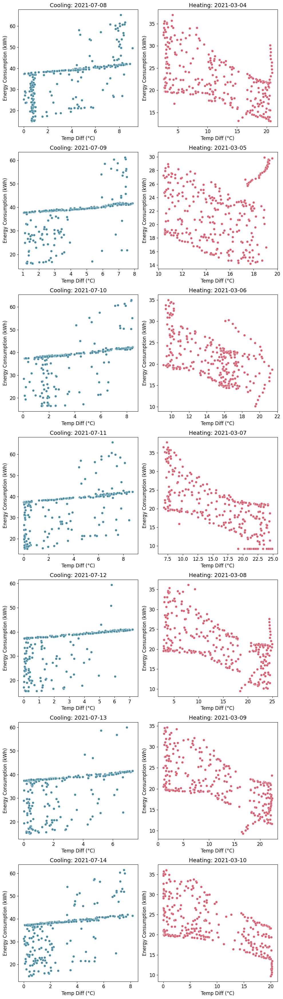

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the datasets
cooling_data = pd.read_csv('cooling_data_cleaned.csv')
heating_data = pd.read_csv('heating_data_cleaned.csv')

# Convert the 'TIMESTAMP' column to datetime
cooling_data['TIMESTAMP'] = pd.to_datetime(cooling_data['TIMESTAMP'])
heating_data['TIMESTAMP'] = pd.to_datetime(heating_data['TIMESTAMP'])

# Extract the date from the timestamp
cooling_data['Day'] = cooling_data['TIMESTAMP'].dt.date
heating_data['Day'] = heating_data['TIMESTAMP'].dt.date

# Get unique dates in the datasets
cooling_days = cooling_data['Day'].unique()
heating_days = heating_data['Day'].unique()

# Define the function to generate a 7x2 grid of scatter plots
def generate_daily_grid_charts(cooling_data, heating_data, cooling_days, heating_days):
    # Convert WH to kWh
    cooling_data['WH_RTU_Total_kWh'] = cooling_data['WH_RTU_Total'] / 1000
    heating_data['WH_RTU_Total_kWh'] = heating_data['WH_RTU_Total'] / 1000

    # Create a 7x2 grid (7 rows, 2 columns)
    fig, axes = plt.subplots(7, 2, figsize=(10, 35))  # Adjust figure size as needed

    # Loop over each day to plot cooling and heating data
    for i, (day_cool, day_heat) in enumerate(zip(cooling_days, heating_days)):
        # Filter data for the specific day
        daily_cooling_data = cooling_data[cooling_data['Day'] == day_cool]
        daily_heating_data = heating_data[heating_data['Day'] == day_heat]

        # Cooling plot (first column)
        sns.scatterplot(
            x='Abs_Temp_Diff',
            y='WH_RTU_Total_kWh',
            data=daily_cooling_data,
            ax=axes[i, 0],
            color='#478BA2',
            marker='o'
        )
        axes[i, 0].set_title(f'Cooling: {day_cool}', fontsize=14)
        axes[i, 0].set_xlabel('Temp Diff (°C)', fontsize=12)
        axes[i, 0].set_ylabel('Energy Consumption (kWh)', fontsize=12)
        axes[i, 0].tick_params(axis='x', labelsize=12)
        axes[i, 0].tick_params(axis='y', labelsize=12)

        # Heating plot (second column)
        sns.scatterplot(
            x='Abs_Temp_Diff',
            y='WH_RTU_Total_kWh',
            data=daily_heating_data,
            ax=axes[i, 1],
            color='#DE5B6D',
            marker='o'
        )
        axes[i, 1].set_title(f'Heating: {day_heat}', fontsize=14)
        axes[i, 1].set_xlabel('Temp Diff (°C)', fontsize=12)
        axes[i, 1].set_ylabel('Energy Consumption (kWh)', fontsize=12)
        axes[i, 1].tick_params(axis='x', labelsize=12)
        axes[i, 1].tick_params(axis='y', labelsize=12)

    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.show()

# Call the function to generate the plots
generate_daily_grid_charts(cooling_data, heating_data, cooling_days, heating_days)


Generate the required charts that show the relationship between Mean Indoor-Outdoor Humidity Difference and Total Energy Consumption for both cooling and heating data on a daily basis

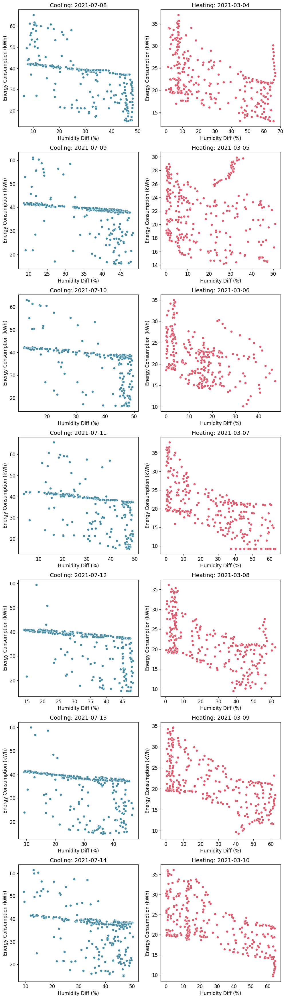

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the datasets
cooling_data = pd.read_csv('cooling_data_cleaned.csv')
heating_data = pd.read_csv('heating_data_cleaned.csv')

# Convert the 'TIMESTAMP' column to datetime
cooling_data['TIMESTAMP'] = pd.to_datetime(cooling_data['TIMESTAMP'])
heating_data['TIMESTAMP'] = pd.to_datetime(heating_data['TIMESTAMP'])

# Extract the day from the timestamp for grouping purposes
cooling_data['Day'] = cooling_data['TIMESTAMP'].dt.date
heating_data['Day'] = heating_data['TIMESTAMP'].dt.date

# List of unique days in the dataset (assuming both datasets span 7 days)
cooling_days = cooling_data['Day'].unique()
heating_days = heating_data['Day'].unique()

# Function to generate a 7x2 grid of scatter plots with 2 columns and 7 rows
def generate_daily_grid_charts(cooling_data, heating_data, cooling_days, heating_days):
    # Convert WH to kWh
    cooling_data['WH_RTU_Total_kWh'] = cooling_data['WH_RTU_Total'] / 1000
    heating_data['WH_RTU_Total_kWh'] = heating_data['WH_RTU_Total'] / 1000

    # Create a 7x2 grid (7 rows, 2 columns)
    fig, axes = plt.subplots(7, 2, figsize=(10, 35))  # Adjust the figure size as needed

    # Loop over each day and plot for both cooling and heating data
    for i, (day_cool, day_heat) in enumerate(zip(cooling_days, heating_days)):
        # Filter the data for the specific day (cooling and heating)
        daily_cooling_data = cooling_data[cooling_data['Day'] == day_cool]
        daily_heating_data = heating_data[heating_data['Day'] == day_heat]

        # Cooling plot (first column)
        sns.scatterplot(
            x='Abs_Humidity_Diff',
            y='WH_RTU_Total_kWh',
            data=daily_cooling_data,
            ax=axes[i, 0],
            color='#478BA2',
            marker='o'
        )
        axes[i, 0].set_title(f'Cooling: {day_cool}', fontsize=14)
        axes[i, 0].set_xlabel('Humidity Diff (%)', fontsize=12)
        axes[i, 0].set_ylabel('Energy Consumption (kWh)', fontsize=12)
        axes[i, 0].tick_params(axis='x', labelsize=12)
        axes[i, 0].tick_params(axis='y', labelsize=12)

        # Heating plot (second column)
        sns.scatterplot(
            x='Abs_Humidity_Diff',
            y='WH_RTU_Total_kWh',
            data=daily_heating_data,
            ax=axes[i, 1],
            color='#DE5B6D',
            marker='o'
        )
        axes[i, 1].set_title(f'Heating: {day_heat}', fontsize=14)
        axes[i, 1].set_xlabel('Humidity Diff (%)', fontsize=12)
        axes[i, 1].set_ylabel('Energy Consumption (kWh)', fontsize=12)
        axes[i, 1].tick_params(axis='x', labelsize=12)
        axes[i, 1].tick_params(axis='y', labelsize=12)

    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.show()

# Generate the grid of plots for cooling and heating data
generate_daily_grid_charts(cooling_data, heating_data, cooling_days, heating_days)


### the relationship among indoor outdoor temperature and the energy consumption for cooling data

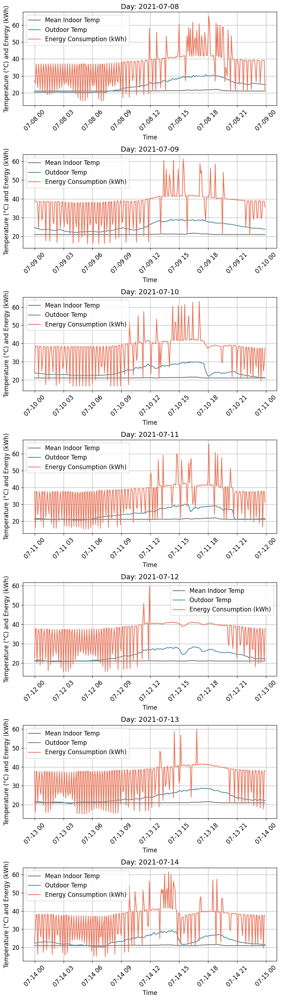

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Cooling dataset
cooling_data = pd.read_csv('cooling_data_cleaned.csv')

# Convert 'TIMESTAMP' column to datetime format
cooling_data['TIMESTAMP'] = pd.to_datetime(cooling_data['TIMESTAMP'])

# Extract the date from the timestamp for grouping purposes
cooling_data['Day'] = cooling_data['TIMESTAMP'].dt.date

# Convert energy consumption from WH to KWH
cooling_data['WH_RTU_Total'] = cooling_data['WH_RTU_Total'] / 1000

# Get the unique list of days in the dataset
cooling_days = cooling_data['Day'].unique()

# Function to generate smaller plots arranged in a 7x1 grid (7 plots in total)
def plot_temp_over_time_grid_cooling(cooling_data, cooling_days):
    # Create a grid layout with 7 rows and 1 column
    fig, axes = plt.subplots(7, 1, figsize=(8, 28))  # Adjust figure size as needed

    # Loop through each day to create separate plots
    for i, day in enumerate(cooling_days):
        # Filter the data for the specific day
        daily_data = cooling_data[cooling_data['Day'] == day]

        # Plot Mean Indoor Temperature
        sns.lineplot(
            x='TIMESTAMP', y='Mean_Indoor_Temperature',
            data=daily_data, label='Mean Indoor Temp', ax=axes[i], color='#6D7172'
        )

        # Plot Outdoor Temperature
        sns.lineplot(
            x='TIMESTAMP', y='T_out',
            data=daily_data, label='Outdoor Temp', ax=axes[i], color='#478BA2'
        )

        # Plot Energy Consumption (now in kWh)
        sns.lineplot(
            x='TIMESTAMP', y='WH_RTU_Total',
            data=daily_data, label='Energy Consumption (kWh)', ax=axes[i], color='#E9765B'
        )

        # Set title and labels for each subplot
        axes[i].set_title(f'Day: {day}', fontsize=14)
        axes[i].set_xlabel('Time', fontsize=12)
        axes[i].set_ylabel('Temperature (°C) and Energy (kWh)', fontsize=12)

        # Adjust tick labels' font size and orientation
        axes[i].tick_params(axis='x', labelsize=12, rotation=45)
        axes[i].tick_params(axis='y', labelsize=12)

        # Add grid and legend
        axes[i].grid(True)
        axes[i].legend(fontsize=12)

    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.show()

# Generate the grid of line plots
plot_temp_over_time_grid_cooling(cooling_data, cooling_days)


### the relationship among indoor outdoor humidity and the energy consumption for cooling data

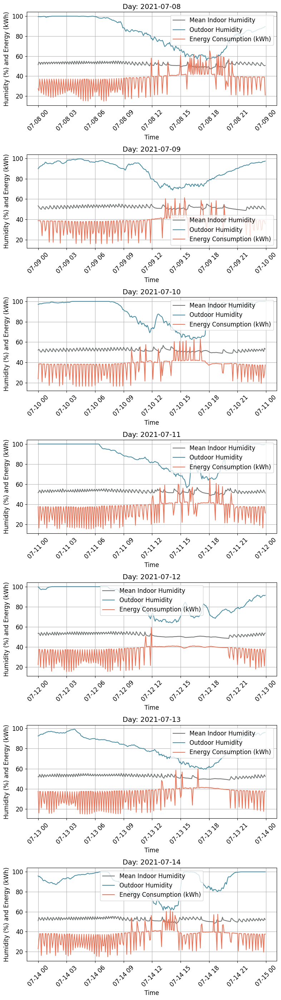

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Cooling dataset
cooling_data = pd.read_csv('cooling_data_cleaned.csv')

# Convert 'TIMESTAMP' column to datetime format
cooling_data['TIMESTAMP'] = pd.to_datetime(cooling_data['TIMESTAMP'])

# Extract the date from the timestamp for grouping purposes
cooling_data['Day'] = cooling_data['TIMESTAMP'].dt.date

# Convert energy consumption from WH to KWH
cooling_data['WH_RTU_Total'] = cooling_data['WH_RTU_Total'] / 1000

# Get the unique list of days in the dataset
cooling_days = cooling_data['Day'].unique()

# Function to generate smaller plots arranged in a 7x1 grid (7 plots in total)
def plot_humi_over_time_grid_cooling(cooling_data, cooling_days):
    # Create a grid layout with 7 rows and 1 column
    fig, axes = plt.subplots(7, 1, figsize=(8, 28))  # Adjust figure size as needed

    # Loop through each day to create separate plots
    for i, day in enumerate(cooling_days):
        # Filter the data for the specific day
        daily_data = cooling_data[cooling_data['Day'] == day]

        # Plot Mean Indoor Humidity
        sns.lineplot(
            x='TIMESTAMP',
            y='Mean_Indoor_Humidity',
            data=daily_data,
            label='Mean Indoor Humidity',
            ax=axes[i],
            color='#6D7172'
        )

        # Plot Outdoor Humidity
        sns.lineplot(
            x='TIMESTAMP',
            y='RH_out',
            data=daily_data,
            label='Outdoor Humidity',
            ax=axes[i],
            color='#478BA2'
        )

        # Plot Energy Consumption (now in kWh)
        sns.lineplot(
            x='TIMESTAMP',
            y='WH_RTU_Total',
            data=daily_data,
            label='Energy Consumption (kWh)',
            ax=axes[i],
            color='#E9765B'
        )

        # Set title and labels for each subplot
        axes[i].set_title(f'Day: {day}', fontsize=14)
        axes[i].set_xlabel('Time', fontsize=12)
        axes[i].set_ylabel('Humidity (%) and Energy (kWh)', fontsize=12)

        # Adjust tick labels' font size and rotation
        axes[i].tick_params(axis='x', labelsize=12, rotation=45)
        axes[i].tick_params(axis='y', labelsize=12)

        # Add grid and legend
        axes[i].grid(True)
        axes[i].legend(fontsize=12)

    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.show()

# Generate the grid of line plots
plot_humi_over_time_grid_cooling(cooling_data, cooling_days)


### the relationship among indoor outdoor temperature and the energy consumption for heating data

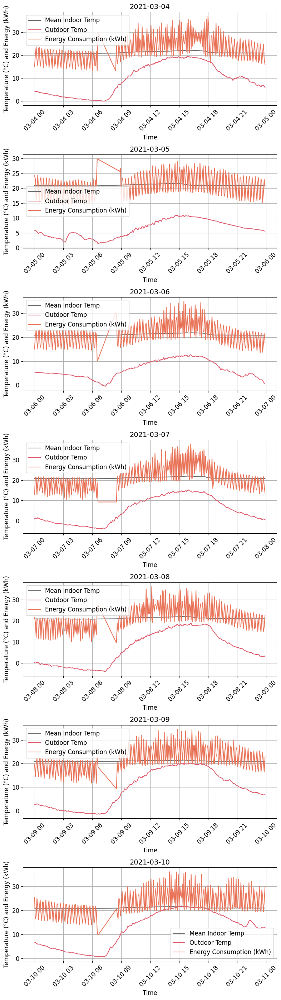

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Heating dataset
heating_data = pd.read_csv('heating_data_cleaned.csv')

# Convert 'TIMESTAMP' column to datetime format
heating_data['TIMESTAMP'] = pd.to_datetime(heating_data['TIMESTAMP'])

# Extract the date from the timestamp for grouping purposes
heating_data['Day'] = heating_data['TIMESTAMP'].dt.date

# Convert energy consumption from WH to KWH
heating_data['WH_RTU_Total'] = heating_data['WH_RTU_Total'] / 1000

# Get the unique list of days in the dataset
heating_days = heating_data['Day'].unique()

# Function to generate smaller plots arranged in a 2x4 grid (7 plots in total)
def plot_temp_over_time_grid_heating(heating_data, heating_days):
    # Create a grid layout with 2 rows and 4 columns (7 plots total)
    fig, axes = plt.subplots(7, 1, figsize=(8, 28))  # Adjust figure size as needed

    # Flatten axes to make it easier to index
    axes = axes.flatten()

    # Loop through each day to create separate plots
    for i, day in enumerate(heating_days):
        # Filter the data for the specific day
        daily_data = heating_data[heating_data['Day'] == day]

        # Plot Mean Indoor Temperature
        sns.lineplot(x='TIMESTAMP', y='Mean_Indoor_Temperature', data=daily_data, label='Mean Indoor Temp', ax=axes[i], color='#6D7172')

        # Plot Outdoor Temperature
        sns.lineplot(x='TIMESTAMP', y='T_out', data=daily_data, label='Outdoor Temp', ax=axes[i], color='#DE5B6D')

        # Plot Energy Consumption (now in kWh)
        sns.lineplot(x='TIMESTAMP', y='WH_RTU_Total', data=daily_data, label='Energy Consumption (kWh)', ax=axes[i], color='#E9765B')

        # Set title and labels for each subplot
        axes[i].set_title(f'{day}',fontsize=14)
        axes[i].set_xlabel('Time',fontsize=12)
        axes[i].set_ylabel('Temperature (°C) and Energy (kWh)',fontsize=12)
        axes[i].tick_params(axis='x',labelsize=12, rotation=45)  # Rotate x-axis labels for better readability
        axes[i].tick_params(axis='y', labelsize=12)
        # Add grid and legend
        axes[i].grid(True)
        axes[i].legend(fontsize=12)

    # Remove the last empty subplot (if 7 plots are used out of 8 slots)
    if len(heating_days) < len(axes):
        fig.delaxes(axes[-1])

    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.show()

# Generate the grid of line plots
plot_temp_over_time_grid_heating(heating_data, heating_days)



### the relationship among indoor outdoor humidity and the energy consumption for heating data

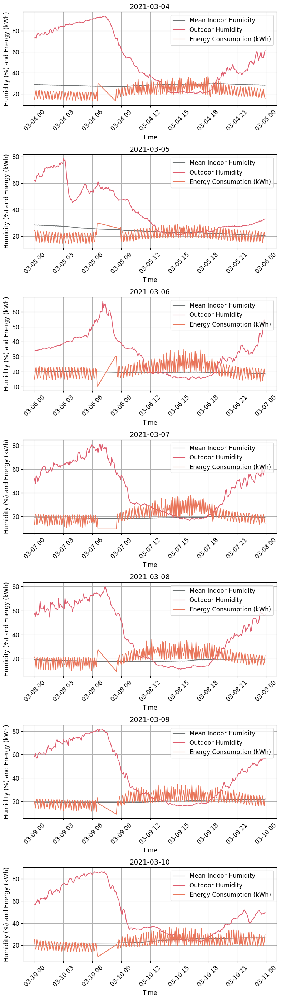

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Heating dataset
heating_data = pd.read_csv('heating_data_cleaned.csv')

# Convert 'TIMESTAMP' column to datetime format
heating_data['TIMESTAMP'] = pd.to_datetime(heating_data['TIMESTAMP'])

# Extract the date from the timestamp for grouping purposes
heating_data['Day'] = heating_data['TIMESTAMP'].dt.date

# Convert energy consumption from WH to KWH
heating_data['WH_RTU_Total'] = heating_data['WH_RTU_Total'] / 1000

# Get the unique list of days in the dataset
heating_days = heating_data['Day'].unique()

# Function to generate smaller plots arranged in a 2x4 grid (7 plots in total) focusing on humidity
def plot_humidity_over_time_grid_heating(heating_data, heating_days):
    # Create a grid layout with 2 rows and 4 columns (7 plots total)
    fig, axes = plt.subplots(7, 1, figsize=(8, 28))  # Adjust figure size as needed

    # Flatten axes to make it easier to index
    axes = axes.flatten()

    # Loop through each day to create separate plots
    for i, day in enumerate(heating_days):
        # Filter the data for the specific day
        daily_data = heating_data[heating_data['Day'] == day]

        # Plot Mean Indoor Humidity
        sns.lineplot(x='TIMESTAMP', y='Mean_Indoor_Humidity', data=daily_data, label='Mean Indoor Humidity', ax=axes[i], color='#6D7172')

        # Plot Outdoor Humidity
        sns.lineplot(x='TIMESTAMP', y='RH_out', data=daily_data, label='Outdoor Humidity', ax=axes[i], color='#DE5B6D')

        # Plot Energy Consumption (now in kWh)
        sns.lineplot(x='TIMESTAMP', y='WH_RTU_Total', data=daily_data, label='Energy Consumption (kWh)', ax=axes[i], color='#E9765B')

        # Set title and labels for each subplot
        axes[i].set_title(f'{day}',fontsize=14)
        axes[i].set_xlabel('Time', fontsize=12)
        axes[i].set_ylabel('Humidity (%) and Energy (kWh)', fontsize=12)
        axes[i].tick_params(axis='x', labelsize=12, rotation=45)  # Rotate x-axis labels for better readability
        axes[i].tick_params(axis='y', labelsize=12)
        # Add grid and legend
        axes[i].grid(True)
        axes[i].legend(fontsize=12)

    # Remove the last empty subplot (if 7 plots are used out of 8 slots)
    if len(heating_days) < len(axes):
        fig.delaxes(axes[-1])

    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.show()

# Generate the grid of line plots
plot_humidity_over_time_grid_heating(heating_data, heating_days)


### plot the correlation matrix for cooling and heating data

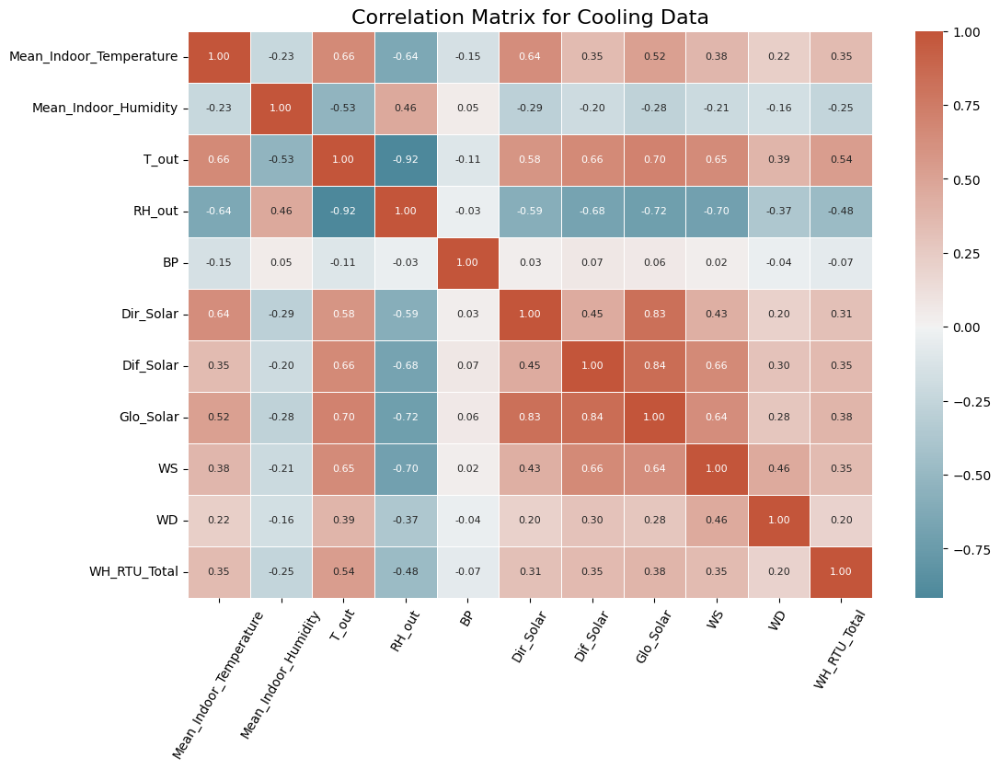

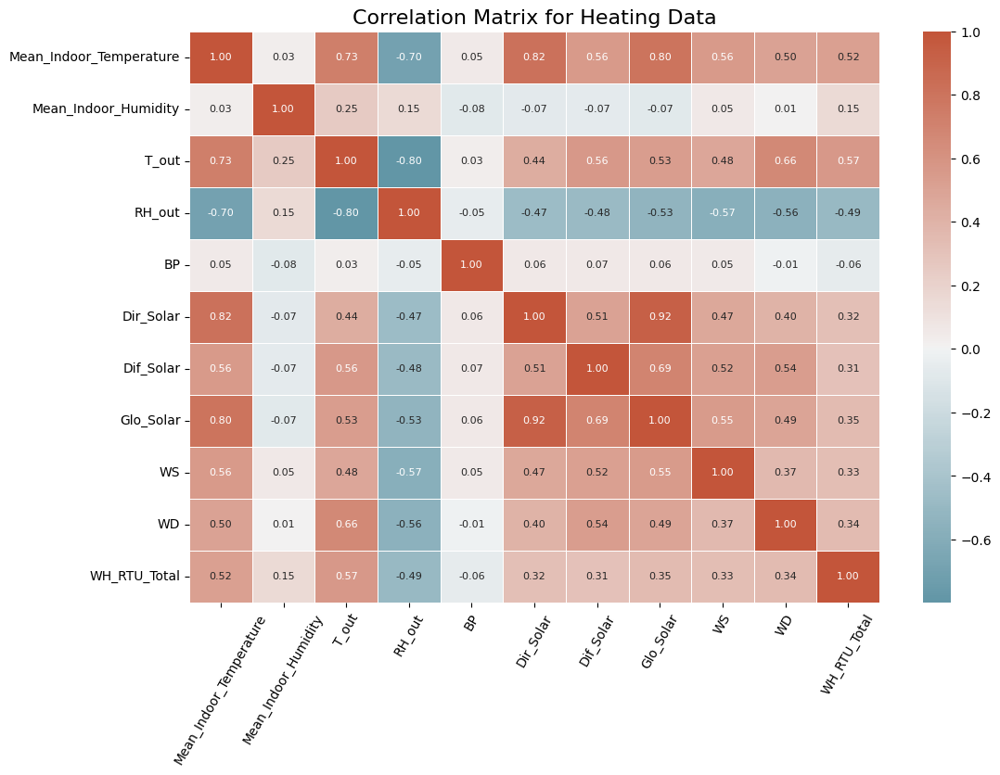

In [ ]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Load the updated datasets with the new 'Mean_Indoor_Temperature' and 'Mean_Indoor_Humidity' columns
cooling_data = pd.read_csv('cooling_data_cleaned.csv')
heating_data = pd.read_csv('heating_data_cleaned.csv')

# Define the weather columns and the target (total energy consumption)
weather_columns = ['T_out', 'RH_out', 'BP', 'Dir_Solar', 'Dif_Solar', 'Glo_Solar', 'WS', 'WD']
target_column = 'WH_RTU_Total'  # Assuming this is the column for total energy consumption

# Correlation columns: Mean indoor temperature, mean indoor humidity, weather variables, and total energy consumption
correlation_columns = ['Mean_Indoor_Temperature', 'Mean_Indoor_Humidity'] + weather_columns + [target_column]

# Filter the data for the relevant columns and drop NaN values
cooling_subset = cooling_data[correlation_columns].dropna()
heating_subset = heating_data[correlation_columns].dropna()

# Function to plot a correlation matrix with a cohesive color scheme
def plot_correlation_matrix(data, title):
    plt.figure(figsize=(12, 8))
    corr_matrix = data.corr()
    sns.heatmap(
        corr_matrix,
        annot=True,
        cmap=sns.diverging_palette(220, 20, as_cmap=True, center="light"),  # Cohesive blue-red gradient
        fmt=".2f",
        linewidths=0.5,
        annot_kws={"size": 8},
        center=0  # Centering the color map at 0 for balanced gradients
    )
    plt.title(title, fontsize=16)
    plt.xticks(fontsize=10, rotation=60)
    plt.yticks(fontsize=10)
    plt.show()

# Plot correlation matrix for cooling data
plot_correlation_matrix(cooling_subset, "Correlation Matrix for Cooling Data")

# Plot correlation matrix for heating data
plot_correlation_matrix(heating_subset, "Correlation Matrix for Heating Data")


### box plot of the energy consumption

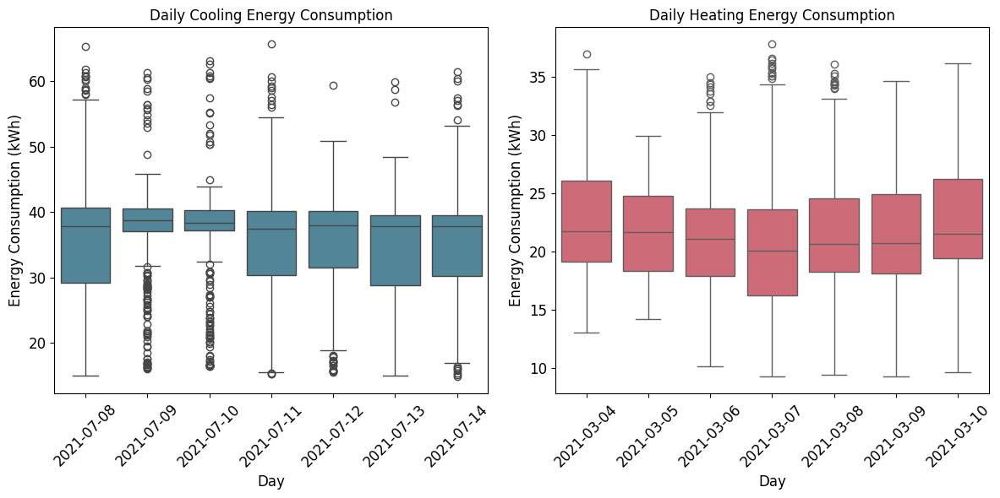

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Ensure 'Timestamp' is in datetime format and extract the 'Day' column as 'YYYY-MM-DD'
cooling_data['TIMESTAMP'] = pd.to_datetime(cooling_data['TIMESTAMP'])
heating_data['TIMESTAMP'] = pd.to_datetime(heating_data['TIMESTAMP'])

# Extract the date in 'YYYY-MM-DD' format
cooling_data['Day'] = cooling_data['TIMESTAMP'].dt.strftime('%Y-%m-%d')  # Year-Month-Day format
heating_data['Day'] = heating_data['TIMESTAMP'].dt.strftime('%Y-%m-%d')  # Year-Month-Day format

# Convert energy consumption from Wh to kWh
cooling_data['WH_RTU_Total_kWh'] = cooling_data['WH_RTU_Total'] / 1000
heating_data['WH_RTU_Total_kWh'] = heating_data['WH_RTU_Total'] / 1000

# Function to generate box plots for energy consumption
def generate_energy_consumption_box_plots(cooling_data, heating_data):
    # Create a figure with 1 row and 2 columns for cooling and heating box plots
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))  # Horizontal layout

    # Cooling data box plot
    sns.boxplot(
        x='Day', y='WH_RTU_Total_kWh',
        data=cooling_data, ax=axes[0],
        color='#478BA2'  # No alpha here
    )
    for patch in axes[0].artists:  # Adjust transparency manually
        patch.set_alpha(0.7)
    axes[0].set_title('Daily Cooling Energy Consumption', fontsize=12)
    axes[0].set_xlabel('Day', fontsize=12)
    axes[0].set_ylabel('Energy Consumption (kWh)', fontsize=12)

    # Heating data box plot
    sns.boxplot(
        x='Day', y='WH_RTU_Total_kWh',
        data=heating_data, ax=axes[1],
        color='#DE5B6D'  # No alpha here
    )
    for patch in axes[1].artists:  # Adjust transparency manually
        patch.set_alpha(0.7)
    axes[1].set_title('Daily Heating Energy Consumption', fontsize=12)
    axes[1].set_xlabel('Day', fontsize=12)
    axes[1].set_ylabel('Energy Consumption (kWh)', fontsize=12)

    # Rotate x-axis labels for better readability and increase size
    for ax in axes:
        ax.tick_params(axis='x', rotation=45, labelsize=12)  # Adjust x-axis label font size
        ax.tick_params(axis='y', labelsize=12)  # Adjust y-axis label font size

    # Adjust layout to prevent overlapping of labels and titles
    plt.tight_layout()
    plt.show()

# Generate the box plots for both cooling and heating data
generate_energy_consumption_box_plots(cooling_data, heating_data)


# FEATURE ENGINEERING PART

###Feature Engineering (Seasonal, Hourly, Day/Night, etc.)


In [ ]:
import pandas as pd
import numpy as np

# Load the filtered datasets (just in case)
cooling_data = pd.read_csv('cooling_data_cleaned.csv')
heating_data = pd.read_csv('heating_data_cleaned.csv')

# Convert TIMESTAMP to datetime format if it's not already in that format
cooling_data['TIMESTAMP'] = pd.to_datetime(cooling_data['TIMESTAMP'], errors='coerce')
heating_data['TIMESTAMP'] = pd.to_datetime(heating_data['TIMESTAMP'], errors='coerce')

# Feature Engineering for Season
def get_season(date):
    if date.month in [12, 1, 2]:
        return 'Winter'
    elif date.month in [3, 4, 5]:
        return 'Spring'
    elif date.month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'

# Apply the function to create a 'Season' feature
cooling_data['Season'] = cooling_data['TIMESTAMP'].apply(get_season)
heating_data['Season'] = heating_data['TIMESTAMP'].apply(get_season)

# Feature Engineering for Hour
cooling_data['Hour'] = cooling_data['TIMESTAMP'].dt.hour
heating_data['Hour'] = heating_data['TIMESTAMP'].dt.hour

# Feature Engineering for Day/Night
def day_or_night(hour):
    if 6 <= hour <= 18:
        return 'Day'
    else:
        return 'Night'

# Apply the function to create a 'Day/Night' feature
cooling_data['Day_Night'] = cooling_data['Hour'].apply(day_or_night)
heating_data['Day_Night'] = heating_data['Hour'].apply(day_or_night)

# Check the new features
print(cooling_data[['TIMESTAMP', 'Season', 'Hour', 'Day_Night']].head())
print(heating_data[['TIMESTAMP', 'Season', 'Hour', 'Day_Night']].head())

# Save the updated datasets with the new features
cooling_data.to_csv('cooling_data_cleaned.csv', index=False)
heating_data.to_csv('heating_data_cleaned.csv', index=False)


print(cooling_data_cleaned.head())
print(heating_data_cleaned.head())

            TIMESTAMP  Season  Hour Day_Night
0 2021-07-08 00:00:00  Summer     0     Night
1 2021-07-08 00:05:00  Summer     0     Night
2 2021-07-08 00:10:00  Summer     0     Night
3 2021-07-08 00:15:00  Summer     0     Night
4 2021-07-08 00:20:00  Summer     0     Night
            TIMESTAMP  Season  Hour Day_Night
0 2021-03-04 00:00:00  Spring     0     Night
1 2021-03-04 00:05:00  Spring     0     Night
2 2021-03-04 00:10:00  Spring     0     Night
3 2021-03-04 00:15:00  Spring     0     Night
4 2021-03-04 00:20:00  Spring     0     Night
             TIMESTAMP  WH_RTU_Total      T_out  RH_out           BP  \
0  2021-07-08 00:00:00    27353.3478  20.234444   99.58  98322.81752   
1  2021-07-08 00:05:00    25386.6870  20.273333   99.58  98309.06800   
2  2021-07-08 00:10:00    37089.7620  20.315556   99.50  98309.06800   
3  2021-07-08 00:15:00    29721.6672  20.307778   99.48  98309.06800   
4  2021-07-08 00:20:00    23184.5616  20.298889   99.58  98309.06800   

   Dir_Solar  D

### coding data

In [ ]:
import pandas as pd

# Load the filtered datasets
cooling_data = pd.read_csv('cooling_data_cleaned.csv')
heating_data = pd.read_csv('heating_data_cleaned.csv')

# Manually map 'Season' and 'Day_Night' columns into numerical values instead of using get_dummies
# Season: Winter=0, Spring=1, Summer=2, Autumn=3
season_mapping = {'Winter': 0, 'Spring': 1, 'Summer': 2, 'Autumn': 3}
cooling_data['Season'] = cooling_data['Season'].map(season_mapping)
heating_data['Season'] = heating_data['Season'].map(season_mapping)

# Day_Night: Day=0, Night=1
day_night_mapping = {'Day': 0, 'Night': 1}
cooling_data['Day_Night'] = cooling_data['Day_Night'].map(day_night_mapping)
heating_data['Day_Night'] = heating_data['Day_Night'].map(day_night_mapping)

# Save the updated datasets with the new numerical features
cooling_data.to_csv('cooling_data_cleaned.csv', index=False)
heating_data.to_csv('heating_data_cleaned.csv', index=False)

# Checking the updated data to ensure the columns are converted to numerical variables
print(cooling_data[['Season', 'Day_Night']].head())
print(heating_data[['Season', 'Day_Night']].head())


   Season  Day_Night
0       2          1
1       2          1
2       2          1
3       2          1
4       2          1
   Season  Day_Night
0       1          1
1       1          1
2       1          1
3       1          1
4       1          1


### Add lags

In [ ]:
import pandas as pd

# Load the cleaned cooling and heating datasets
cooling_data_cleaned = pd.read_csv('cooling_data_cleaned.csv')
heating_data_cleaned = pd.read_csv('heating_data_cleaned.csv')

# List of columns for which you want to create lags (EXCLUDING WH_RTU_Total)
lag_columns = [
    'T_out', 'RH_out', 'BP', 'Dir_Solar', 'Dif_Solar', 'Glo_Solar',
    'WS', 'WD', 'Mean_Indoor_Temperature', 'Mean_Indoor_Humidity',
    'Abs_Temp_Diff', 'Abs_Humidity_Diff'
]

# Function to create lag features for a given DataFrame
def create_lag_features(data, lag_columns, num_lags):
    for col in lag_columns:
        for lag in range(1, num_lags + 1):
            data[f'{col}_Lag_{lag}'] = data[col].shift(lag)
    return data

# Create lag features for cooling data (up to 4 lags for the past 4 time steps)
cooling_data_lagged = create_lag_features(cooling_data_cleaned, lag_columns, num_lags=24)

# Create lag features for heating data (up to 4 lags for the past 4 time steps)
heating_data_lagged = create_lag_features(heating_data_cleaned, lag_columns, num_lags=24)

# Drop rows with NaN values caused by lagging (first 4 rows will have NaNs due to lagging)
cooling_data_lagged.dropna(inplace=True)
heating_data_lagged.dropna(inplace=True)

# Save the lagged datasets to new CSV files
cooling_data_lagged.to_csv('cooling_data_lagged.csv', index=False)
heating_data_lagged.to_csv('heating_data_lagged.csv', index=False)

# View the first few rows of the lagged data
print("Cooling Data with Lags:")
print(cooling_data_lagged.head())

print("Heating Data with Lags:")
print(heating_data_lagged.head())


<ipython-input-19-4542a0668216>:18: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data[f'{col}_Lag_{lag}'] = data[col].shift(lag)
<ipython-input-19-4542a0668216>:18: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data[f'{col}_Lag_{lag}'] = data[col].shift(lag)
<ipython-input-19-4542a0668216>:18: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmente

Cooling Data with Lags:
              TIMESTAMP  WH_RTU_Total      T_out  RH_out          BP  \
24  2021-07-08 02:00:00    31632.9330  20.344444   100.0  98240.3204   
25  2021-07-08 02:05:00    21162.4950  20.316667   100.0  98240.3204   
26  2021-07-08 02:10:00    37131.3180  20.307778   100.0  98240.3204   
27  2021-07-08 02:15:00    30788.1036  20.395556   100.0  98240.3204   
28  2021-07-08 02:20:00    21785.7384  20.418889   100.0  98240.3204   

    Dir_Solar  Dif_Solar  Glo_Solar        WS       WD  ...  \
24     0.4124     0.0276     0.0604  0.013679   11.138  ...   
25     0.4020     0.0092     0.1308  0.000000    0.000  ...   
26     0.3594     0.0276     0.0302  0.122131   11.816  ...   
27     0.3912     0.0552     0.0704  0.281546  192.520  ...   
28     0.4018     0.0368     0.0202  0.007510   64.200  ...   

    Abs_Humidity_Diff_Lag_15  Abs_Humidity_Diff_Lag_16  \
24                   47.5526                   45.9186   
25                   45.1176                   4

### Rolling averages/moving averages smooth out data fluctuations.

In [ ]:
import pandas as pd

# Load the cleaned cooling and heating datasets with lags
cooling_data_lagged = pd.read_csv('cooling_data_lagged.csv')
heating_data_lagged = pd.read_csv('heating_data_lagged.csv')

# Columns for which to calculate rolling averages
columns_to_roll = [
    'T_out', 'RH_out', 'BP', 'Dir_Solar', 'Dif_Solar', 'Glo_Solar',
    'WS', 'WD', 'Mean_Indoor_Temperature', 'Mean_Indoor_Humidity',
    'Abs_Temp_Diff', 'Abs_Humidity_Diff'
]

# Function to add rolling averages for a given DataFrame
def add_rolling_averages(data, columns, windows):
    for col in columns:
        for window in windows:
            data[f'{col}_Rolling_{window}'] = data[col].rolling(window=window).mean()
    return data

# Example: Add rolling averages for windows of 3, 6, 12 timesteps (15, 30, 60 minutes)
windows = [3, 6, 12]

# Adding rolling averages to the cooling data
cooling_data_with_rolls = add_rolling_averages(cooling_data_lagged, columns_to_roll, windows)

# Adding rolling averages to the heating data
heating_data_with_rolls = add_rolling_averages(heating_data_lagged, columns_to_roll, windows)

# Drop rows with NaN values caused by rolling operations
cooling_data_with_rolls.dropna(inplace=True)
heating_data_with_rolls.dropna(inplace=True)

# Save the data with rolling averages to new CSV files
cooling_data_with_rolls.to_csv('cooling_data_with_lags_and_rolling_averages.csv', index=False)
heating_data_with_rolls.to_csv('heating_data_with_lags_and_rolling_averages.csv', index=False)

# View the first few rows of the new data
print(cooling_data_with_rolls.head())
print(heating_data_with_rolls.head())


              TIMESTAMP  WH_RTU_Total      T_out  RH_out           BP  \
11  2021-07-08 02:55:00    37089.7560  20.291111   100.0  98240.32040   
12  2021-07-08 03:00:00    27644.1936  20.313333   100.0  98185.32232   
13  2021-07-08 03:05:00    24998.8872  20.304444   100.0  98171.57280   
14  2021-07-08 03:10:00    37075.9080  20.311111   100.0  98171.57280   
15  2021-07-08 03:15:00    25649.8272  20.303333   100.0  98171.57280   

    Dir_Solar  Dif_Solar  Glo_Solar        WS        WD  ...  \
11     0.3382     0.0000    -0.2816  0.402604   19.6054  ...   
12     0.4336     0.0460    -0.1710  0.143321  242.7640  ...   
13     0.4336     0.0276    -0.1108  0.185253  257.3200  ...   
14     0.4336     0.0368     0.0200  0.204387  261.5400  ...   
15     0.3912     0.0184    -0.0302  0.009567   64.3600  ...   

    Mean_Indoor_Temperature_Rolling_12  Mean_Indoor_Humidity_Rolling_3  \
11                           20.998287                       53.511333   
12                          

### DIFFERENCING


In [ ]:
import pandas as pd

# Load the cooling and heating datasets with lags and rolling averages
cooling_data = pd.read_csv('cooling_data_with_lags_and_rolling_averages.csv')
heating_data = pd.read_csv('heating_data_with_lags_and_rolling_averages.csv')

# List of columns for which to apply differencing (relevant features)
diff_columns = [
    'T_out', 'RH_out', 'BP', 'Dir_Solar', 'Dif_Solar', 'Glo_Solar',
    'WS', 'WD', 'Mean_Indoor_Temperature', 'Mean_Indoor_Humidity',
    'Abs_Temp_Diff', 'Abs_Humidity_Diff'
]

# Function to apply differencing
def apply_differencing(data, diff_columns):
    for col in diff_columns:
        data[f'{col}_Diff'] = data[col].diff()
    return data

# Apply differencing to cooling data
cooling_data_with_diffs = apply_differencing(cooling_data, diff_columns)

# Apply differencing to heating data
heating_data_with_diffs = apply_differencing(heating_data, diff_columns)

# Drop rows with NaN values caused by differencing
cooling_data_with_diffs.dropna(inplace=True)
heating_data_with_diffs.dropna(inplace=True)

# Save the differenced data to new CSV files
cooling_data_with_diffs.to_csv('cooling_data_with_lags_rolls_diffs.csv', index=False)
heating_data_with_diffs.to_csv('heating_data_with_lags_rolls_diffs.csv', index=False)

# View the first few rows of the differenced data
print("Cooling Data with Differencing:")
print(cooling_data_with_diffs.head())

print("Heating Data with Differencing:")
print(heating_data_with_diffs.head())


Cooling Data with Differencing:
             TIMESTAMP  WH_RTU_Total      T_out  RH_out           BP  \
1  2021-07-08 03:00:00    27644.1936  20.313333   100.0  98185.32232   
2  2021-07-08 03:05:00    24998.8872  20.304444   100.0  98171.57280   
3  2021-07-08 03:10:00    37075.9080  20.311111   100.0  98171.57280   
4  2021-07-08 03:15:00    25649.8272  20.303333   100.0  98171.57280   
5  2021-07-08 03:20:00    26854.7640  20.316667   100.0  98171.57280   

   Dir_Solar  Dif_Solar  Glo_Solar        WS       WD  ...   BP_Diff  \
1     0.4336     0.0460    -0.1710  0.143321  242.764  ... -54.99808   
2     0.4336     0.0276    -0.1108  0.185253  257.320  ... -13.74952   
3     0.4336     0.0368     0.0200  0.204387  261.540  ...   0.00000   
4     0.3912     0.0184    -0.0302  0.009567   64.360  ...   0.00000   
5     0.4442     0.0276    -0.0806  0.117750   92.860  ...   0.00000   

   Dir_Solar_Diff  Dif_Solar_Diff  Glo_Solar_Diff   WS_Diff   WD_Diff  \
1          0.0954          0.

### Interaction Terms

In [ ]:
import pandas as pd

# Load your data
cooling_data = pd.read_csv('cooling_data_with_lags_rolls_diffs.csv')
heating_data = pd.read_csv('heating_data_with_lags_rolls_diffs.csv')

# Create interaction terms for cooling data
cooling_data['T_out_RH_out_Interaction'] = cooling_data['T_out'] * cooling_data['RH_out']
cooling_data['T_out_WS_Interaction'] = cooling_data['T_out'] * cooling_data['WS']
cooling_data['Mean_Indoor_Temp_RH_out_Interaction'] = cooling_data['Mean_Indoor_Temperature'] * cooling_data['RH_out']

# Create interaction terms for heating data
heating_data['T_out_RH_out_Interaction'] = heating_data['T_out'] * heating_data['RH_out']
heating_data['T_out_WS_Interaction'] = heating_data['T_out'] * heating_data['WS']
heating_data['Mean_Indoor_Temp_RH_out_Interaction'] = heating_data['Mean_Indoor_Temperature'] * heating_data['RH_out']

# Save the updated datasets
cooling_data.to_csv('cooling_data_with_interactions.csv', index=False)
heating_data.to_csv('heating_data_with_interactions.csv', index=False)

# View the first few rows of the updated data
print(cooling_data.head())
print(heating_data.head())


             TIMESTAMP  WH_RTU_Total      T_out  RH_out           BP  \
0  2021-07-08 03:00:00    27644.1936  20.313333   100.0  98185.32232   
1  2021-07-08 03:05:00    24998.8872  20.304444   100.0  98171.57280   
2  2021-07-08 03:10:00    37075.9080  20.311111   100.0  98171.57280   
3  2021-07-08 03:15:00    25649.8272  20.303333   100.0  98171.57280   
4  2021-07-08 03:20:00    26854.7640  20.316667   100.0  98171.57280   

   Dir_Solar  Dif_Solar  Glo_Solar        WS       WD  ...  Glo_Solar_Diff  \
0     0.4336     0.0460    -0.1710  0.143321  242.764  ...          0.1106   
1     0.4336     0.0276    -0.1108  0.185253  257.320  ...          0.0602   
2     0.4336     0.0368     0.0200  0.204387  261.540  ...          0.1308   
3     0.3912     0.0184    -0.0302  0.009567   64.360  ...         -0.0502   
4     0.4442     0.0276    -0.0806  0.117750   92.860  ...         -0.0504   

    WS_Diff   WD_Diff  Mean_Indoor_Temperature_Diff  \
0 -0.259283  223.1586                     -

### Divide the dataset into train and test datasets for both cooling and heating data

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Load the cooling and heating datasets
cooling_data = pd.read_csv('cooling_data_with_interactions.csv')  # Adjust path if needed
heating_data = pd.read_csv('heating_data_with_interactions.csv')  # Adjust path if needed

# Separate features and target for both datasets
X_cooling = cooling_data.drop('WH_RTU_Total', axis=1)
y_cooling = cooling_data['WH_RTU_Total']

X_heating = heating_data.drop('WH_RTU_Total', axis=1)
y_heating = heating_data['WH_RTU_Total']

# Perform train-test split for cooling data
X_train_cooling, X_test_cooling, y_train_cooling, y_test_cooling = train_test_split(
    X_cooling, y_cooling, test_size=0.2, random_state=42
)

# Perform train-test split for heating data
X_train_heating, X_test_heating, y_train_heating, y_test_heating = train_test_split(
    X_heating, y_heating, test_size=0.2, random_state=42
)

# Combine X and y for training and testing data in cooling and heating datasets
train_cooling_data = pd.concat([X_train_cooling, y_train_cooling], axis=1)
test_cooling_data = pd.concat([X_test_cooling, y_test_cooling], axis=1)

train_heating_data = pd.concat([X_train_heating, y_train_heating], axis=1)
test_heating_data = pd.concat([X_test_heating, y_test_heating], axis=1)

# Save to files
train_cooling_data.to_csv('train_cooling_data.csv', index=False)
test_cooling_data.to_csv('test_cooling_data.csv', index=False)
train_heating_data.to_csv('train_heating_data.csv', index=False)
test_heating_data.to_csv('test_heating_data.csv', index=False)


### combine the train data and test data together

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Load the cooling and heating datasets
cooling_data = pd.read_csv('cooling_data_with_interactions.csv')  # Adjust path if needed
heating_data = pd.read_csv('heating_data_with_interactions.csv')  # Adjust path if needed

# Separate features and target for both datasets
X_cooling = cooling_data.drop('WH_RTU_Total', axis=1)
y_cooling = cooling_data['WH_RTU_Total']

X_heating = heating_data.drop('WH_RTU_Total', axis=1)
y_heating = heating_data['WH_RTU_Total']

# Perform train-test split for cooling data
X_train_cooling, X_test_cooling, y_train_cooling, y_test_cooling = train_test_split(
    X_cooling, y_cooling, test_size=0.2, random_state=42
)

# Perform train-test split for heating data
X_train_heating, X_test_heating, y_train_heating, y_test_heating = train_test_split(
    X_heating, y_heating, test_size=0.2, random_state=42
)

# Combine X and y for training and testing data in cooling and heating datasets
train_cooling_data = pd.concat([X_train_cooling, y_train_cooling], axis=1)
test_cooling_data = pd.concat([X_test_cooling, y_test_cooling], axis=1)

train_heating_data = pd.concat([X_train_heating, y_train_heating], axis=1)
test_heating_data = pd.concat([X_test_heating, y_test_heating], axis=1)

# Combine cooling and heating train datasets
train_combined = pd.concat([train_cooling_data, train_heating_data], axis=0)

# Combine cooling and heating test datasets
test_combined = pd.concat([test_cooling_data, test_heating_data], axis=0)

# Save the combined train and test datasets to files
train_combined.to_csv('train_combined_data.csv', index=False)
test_combined.to_csv('test_combined_data.csv', index=False)


### Feature Selection

This code snippet is a Python script for feature selection from a dataset, using multiple statistical methods to refine the feature set for predictive modeling.

In [ ]:
from sklearn.ensemble import RandomForestRegressor
import pandas as pd

data = pd.read_csv('train_combined_data.csv')
X = data.drop(columns=['WH_RTU_Total','TIMESTAMP'])  # Features
y = data['WH_RTU_Total']

# Train a Random Forest model on the combined dataset
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X, y)

# Get feature importances and sort them in descending order
feature_importances = pd.DataFrame({
    'feature': X.columns,
    'importance': rf_model.feature_importances_
}).sort_values(by='importance', ascending=False)

# Display the top features by importance
print("Top features by importance:")
print(feature_importances)

# Select the top N features (e.g., top 25 features)
top_n = 25
top_features = feature_importances['feature'].head(top_n).tolist()

# Output the top features list for further use
print("\nSelected Top Features List:")
print(top_features)


Top features by importance:
                           feature    importance
207  Mean_Indoor_Temperature_Lag_1  1.605808e-01
250    Mean_Indoor_Humidity_Lag_20  5.707411e-02
348      Mean_Indoor_Humidity_Diff  5.176407e-02
232     Mean_Indoor_Humidity_Lag_2  5.062330e-02
9             Mean_Indoor_Humidity  4.813306e-02
..                             ...           ...
73                       BP_Lag_11  2.802174e-05
14                       Day_Night  2.717611e-05
72                       BP_Lag_10  2.540897e-05
76                       BP_Lag_14  1.419564e-05
12                          Season  3.725234e-08

[354 rows x 2 columns]

Selected Top Features List:
['Mean_Indoor_Temperature_Lag_1', 'Mean_Indoor_Humidity_Lag_20', 'Mean_Indoor_Humidity_Diff', 'Mean_Indoor_Humidity_Lag_2', 'Mean_Indoor_Humidity', 'T_out_Lag_3', 'T_out', 'T_out_Lag_2', 'Mean_Indoor_Humidity_Lag_7', 'Mean_Indoor_Humidity_Lag_3', 'T_out_Rolling_12', 'T_out_Lag_1', 'T_out_Lag_22', 'Mean_Indoor_Temperature', 'T_out

### Feature Importance

Top features by importance:
                           feature    importance
207  Mean_Indoor_Temperature_Lag_1  1.605808e-01
250    Mean_Indoor_Humidity_Lag_20  5.707411e-02
348      Mean_Indoor_Humidity_Diff  5.176407e-02
232     Mean_Indoor_Humidity_Lag_2  5.062330e-02
9             Mean_Indoor_Humidity  4.813306e-02
..                             ...           ...
73                       BP_Lag_11  2.802174e-05
14                       Day_Night  2.717611e-05
72                       BP_Lag_10  2.540897e-05
76                       BP_Lag_14  1.419564e-05
12                          Season  3.725234e-08

[354 rows x 2 columns]

Selected Top Features List:
['Mean_Indoor_Temperature_Lag_1', 'Mean_Indoor_Humidity_Lag_20', 'Mean_Indoor_Humidity_Diff', 'Mean_Indoor_Humidity_Lag_2', 'Mean_Indoor_Humidity', 'T_out_Lag_3', 'T_out', 'T_out_Lag_2', 'Mean_Indoor_Humidity_Lag_7', 'Mean_Indoor_Humidity_Lag_3', 'T_out_Rolling_12', 'T_out_Lag_1', 'T_out_Lag_22', 'Mean_Indoor_Temperature', 'T_out

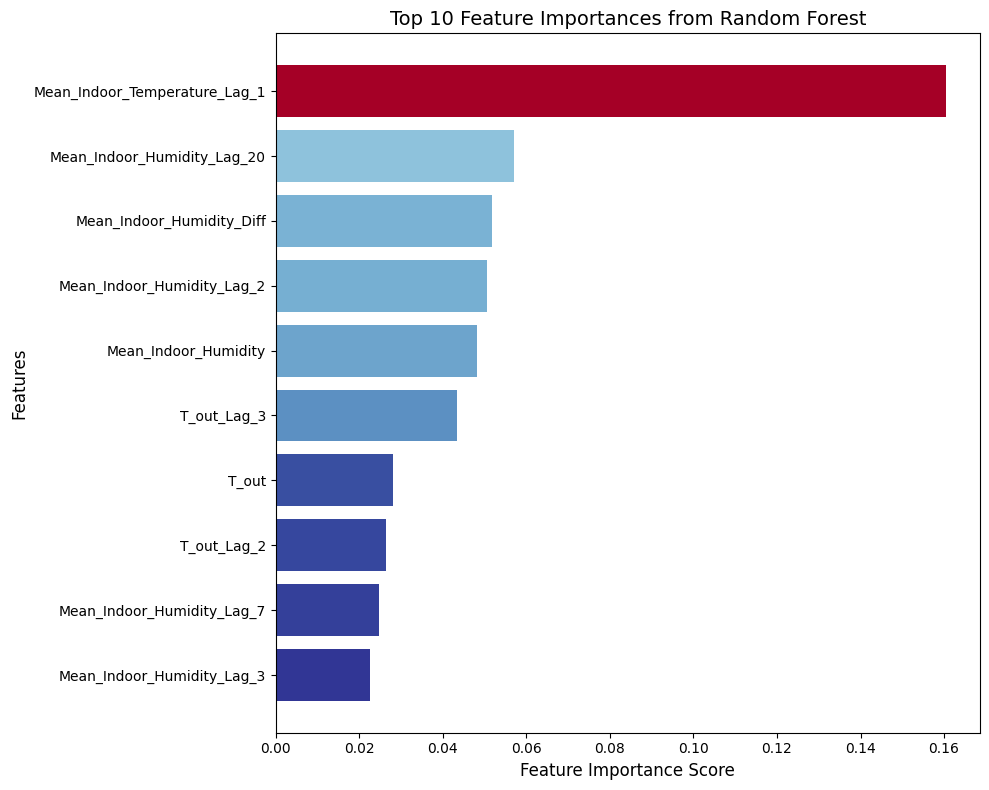

In [ ]:
from sklearn.ensemble import RandomForestRegressor
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the dataset
data = pd.read_csv('train_combined_data.csv')

# Prepare features and target
X = data.drop(columns=['WH_RTU_Total', 'TIMESTAMP'])  # Features
y = data['WH_RTU_Total']

# Train a Random Forest model on the combined dataset
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X, y)

# Get feature importances and sort them in descending order
feature_importances = pd.DataFrame({
    'feature': X.columns,
    'importance': rf_model.feature_importances_
}).sort_values(by='importance', ascending=False)

# Display the top features by importance
print("Top features by importance:")
print(feature_importances)

# Select the top N features (e.g., top 25 features)
top_n = 25
top_features = feature_importances['feature'].head(top_n).tolist()

# Output the top features list for further use
print("\nSelected Top Features List:")
print(top_features)

# Plotting the top 10 features with gradient color
top_10_features = feature_importances.head(10)

# Normalize the importance scores for the gradient
norm = plt.Normalize(top_10_features['importance'].min(), top_10_features['importance'].max())
colors = plt.cm.RdYlBu_r(norm(top_10_features['importance']))  # Reverse RdYlBu for red-to-blue

# Create the horizontal bar plot
plt.figure(figsize=(10, 8))  # Set the figure size
plt.barh(
    top_10_features['feature'],
    top_10_features['importance'],
    color=colors  # Apply gradient colors
)
plt.xlabel('Feature Importance Score', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.title('Top 10 Feature Importances from Random Forest', fontsize=14)
plt.gca().invert_yaxis()  # Invert the y-axis to have the highest importance at the top
plt.tight_layout()
plt.show()


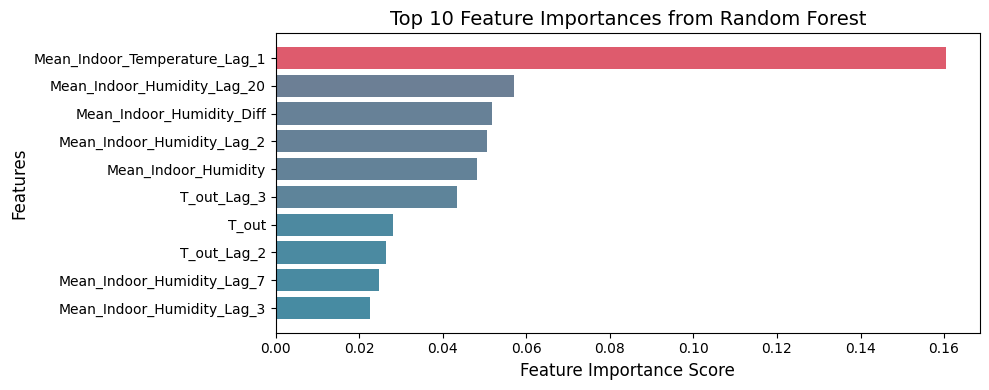

In [ ]:
from sklearn.ensemble import RandomForestRegressor
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap
# Plotting the top 10 features with a custom gradient color
top_10_features = feature_importances.head(10)

# Create a custom colormap from red to blue
custom_cmap = LinearSegmentedColormap.from_list('custom_red_blue', ['#478BA2', '#DE5B6D'])

# Normalize the importance scores for the gradient
norm = plt.Normalize(top_10_features['importance'].min(), top_10_features['importance'].max())
colors = custom_cmap(norm(top_10_features['importance']))

# Create the horizontal bar plot
plt.figure(figsize=(10, 4))  # Set the figure size
plt.barh(
    top_10_features['feature'],
    top_10_features['importance'],
    color=colors  # Apply custom gradient colors
)
plt.xlabel('Feature Importance Score', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.title('Top 10 Feature Importances from Random Forest', fontsize=14)
plt.gca().invert_yaxis()  # Invert the y-axis to have the highest importance at the top
plt.tight_layout()
plt.show()

combined data after feature selection for both train and test data

In [ ]:
import pandas as pd

# # Define the top features list
# top_features = [
#     'Mean_Indoor_Temperature_Lag_1', 'Mean_Indoor_Humidity_Lag_20', 'Mean_Indoor_Humidity_Diff',
#     'Mean_Indoor_Humidity_Lag_2', 'Mean_Indoor_Humidity', 'T_out_Lag_3', 'T_out', 'T_out_Lag_2',
#     'Mean_Indoor_Humidity_Lag_7', 'Mean_Indoor_Humidity_Lag_3', 'T_out_Rolling_12', 'T_out_Lag_1',
#     'T_out_Lag_22', 'Mean_Indoor_Temperature', 'T_out_Lag_4', 'T_out_Lag_17', 'T_out_Rolling_3',
#     'Mean_Indoor_Temperature_Diff', 'T_out_Lag_10', 'T_out_Lag_19', 'Mean_Indoor_Humidity_Lag_18',
#     'T_out_Lag_18', 'T_out_Lag_16', 'T_out_Rolling_6', 'T_out_Lag_5'
# ]

# Load the combined train and test data
train_combined = pd.read_csv('train_combined_data.csv')
test_combined = pd.read_csv('test_combined_data.csv')

# Extract the top features from the combined datasets, including the target column
train_selected = train_combined[top_features + ['WH_RTU_Total']]
test_selected = test_combined[top_features + ['WH_RTU_Total']]

# Save the selected feature data to new CSV files
train_selected.to_csv('train_selected_data.csv', index=False)
test_selected.to_csv('test_selected_data.csv', index=False)


# Experiment1



## Linear Regression

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error

# Load the selected feature data
train_selected = pd.read_csv('train_selected_data.csv')
test_selected = pd.read_csv('test_selected_data.csv')

# Load and prepare your data
X_train = train_selected.drop('WH_RTU_Total', axis=1)
y_train = train_selected['WH_RTU_Total']
X_test = test_selected.drop('WH_RTU_Total', axis=1)
y_test = test_selected['WH_RTU_Total']

# Train your model
model = LinearRegression()
model.fit(X_train, y_train)

# Calculate MAE for training and testing data
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)
train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_test, y_test_pred)

# Calculate means of the target variables
y_train_mean = y_train.mean()
y_test_mean = y_test.mean()

# Calculate normalized MAE
train_scaled_mae = (train_mae / y_train_mean) * 100
test_scaled_mae = (test_mae / y_test_mean) * 100

# Print results
print(f'Training Mean Absolute Error: {train_mae}')
print(f'Testing Mean Absolute Error: {test_mae}')
print(f'Normalized Mean Absolute Error (Training): {train_scaled_mae:.2f}%')
print(f'Normalized Mean Absolute Error (Testing): {test_scaled_mae:.2f}%')


Training Mean Absolute Error: 4672.951953366973
Testing Mean Absolute Error: 4759.125322040805
Normalized Mean Absolute Error (Training): 16.24%
Normalized Mean Absolute Error (Testing): 16.75%



## Exp1:Random Forest


### Exp1 Random Forest (Default)

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error


# Load the selected feature data
train_selected = pd.read_csv('train_selected_data.csv')
test_selected = pd.read_csv('test_selected_data.csv')

# Load and prepare your data
X_train = train_selected.drop('WH_RTU_Total', axis=1)
y_train = train_selected['WH_RTU_Total']
X_test = test_selected.drop('WH_RTU_Total', axis=1)
y_test = test_selected['WH_RTU_Total']

# Initialize and train the Random Forest model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Make predictions on both the training and test sets
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

# Calculate MAE for training and testing sets
train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_test, y_test_pred)

# Calculate the mean of the target variable for training and testing sets
y_train_mean = y_train.mean()
y_test_mean = y_test.mean()

# Calculate CV-MAE for training and testing sets
train_cv_mae = (train_mae / y_train_mean) * 100
test_cv_mae = (test_mae / y_test_mean) * 100

# Display the model performance
print("Random Forest Model Performance on Refined Data")
print(f"Train MAE: {train_mae}")
print(f"Test MAE: {test_mae}")
print(f"Train CV-MAE: {train_cv_mae}%")
print(f"Test CV-MAE: {test_cv_mae}%")


Random Forest Model Performance on Refined Data
Train MAE: 1020.5645369115414
Test MAE: 2948.546887579452
Train CV-MAE: 3.5464530663308915%
Test CV-MAE: 10.376970812927121%


### Hyper Parameter for Random Forest

### 10.23%(Best Performance)

In [ ]:
import pandas as pd
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error

# Load the selected feature data
train_selected = pd.read_csv('train_selected_data.csv')
test_selected = pd.read_csv('test_selected_data.csv')

# Load and prepare your data
X_train = train_selected.drop('WH_RTU_Total', axis=1)
y_train = train_selected['WH_RTU_Total']
X_test = test_selected.drop('WH_RTU_Total', axis=1)
y_test = test_selected['WH_RTU_Total']

# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [2, 4, 6],  # Avoid overly small leaves
    'max_features': ['sqrt', 'log2', None],  # Fix 'auto' issue
    'bootstrap': [True]  # Force bootstrap to prevent overfitting
}

# Set up GridSearchCV
grid_search = GridSearchCV(
    estimator=RandomForestRegressor(random_state=42),
    param_grid=param_grid,
    cv=3,
    scoring='neg_mean_absolute_error',
    verbose=2,
    n_jobs=-1
)

# Fit the Grid Search model
grid_search.fit(X_train, y_train)

# Extract the best model and evaluate
best_model = grid_search.best_estimator_
y_train_pred = best_model.predict(X_train)
y_test_pred = best_model.predict(X_test)

# Calculate Train MAE and Test MAE
train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_test, y_test_pred)

# Calculate Train and Test means
y_train_mean = y_train.mean()
y_test_mean = y_test.mean()

# Calculate Train CV-MAE and Test CV-MAE
train_cv_mae = (train_mae / y_train_mean) * 100
test_cv_mae = (test_mae / y_test_mean) * 100

# Display results
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Train MAE: {train_mae}")
print(f"Test MAE: {test_mae}")
print(f"Train CV-MAE: {train_cv_mae:.2f}%")
print(f"Test CV-MAE: {test_cv_mae:.2f}%")


Fitting 3 folds for each of 162 candidates, totalling 486 fits
Best Parameters: {'bootstrap': True, 'max_depth': 30, 'max_features': None, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
Train MAE: 1189.9923012517033
Test MAE: 2908.100657716725
Train CV-MAE: 4.14%
Test CV-MAE: 10.23%


### Other Attempts

11.22%

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error
import numpy as np

# Refined parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [10, 20, 30],  # Focused on reasonable depths
    'min_samples_split': [5, 10],  # Higher splits for better regularization
    'min_samples_leaf': [2, 4],    # Larger leaf sizes to improve generalization
    'max_features': ['sqrt'],      # Fix proven options
    'bootstrap': [True]            # Fix bootstrap
}

# Initialize Random Forest Regressor
default_model = RandomForestRegressor(random_state=42)
tuned_model = RandomForestRegressor(random_state=42)

# Default Model Performance
default_model.fit(X_train, y_train)
y_train_pred_default = default_model.predict(X_train)
y_test_pred_default = default_model.predict(X_test)
train_mae_default = mean_absolute_error(y_train, y_train_pred_default)
test_mae_default = mean_absolute_error(y_test, y_test_pred_default)

# Grid Search for parameter tuning
grid_search = GridSearchCV(
    estimator=tuned_model,
    param_grid=param_grid,
    cv=3,
    verbose=1,
    n_jobs=-1,
    scoring='neg_mean_absolute_error'  # Directly optimize for MAE
)

# Fit the Grid Search model
grid_search.fit(X_train, y_train)

# Extract the best model from GridSearchCV
best_model = grid_search.best_estimator_

# Evaluate the Tuned Model
y_train_pred_best = best_model.predict(X_train)
y_test_pred_best = best_model.predict(X_test)
train_mae_best = mean_absolute_error(y_train, y_train_pred_best)
test_mae_best = mean_absolute_error(y_test, y_test_pred_best)
train_mean = np.mean(y_train)
test_mean = np.mean(y_test)
train_cv_mae_best = (train_mae_best / train_mean) * 100
test_cv_mae_best = (test_mae_best / test_mean) * 100

# Display performance
print("\nDefault Random Forest Model Performance")
print(f"Train MAE: {train_mae_default}")
print(f"Test MAE: {test_mae_default}")

print("\nTuned Random Forest Model Performance")
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Train MAE: {train_mae_best}")
print(f"Test MAE: {test_mae_best}")
print(f"Train CV-MAE: {train_cv_mae_best:.2f}%")
print(f"Test CV-MAE: {test_cv_mae_best:.2f}%")


Fitting 3 folds for each of 24 candidates, totalling 72 fits

Default Random Forest Model Performance
Train MAE: 1020.5645369115414
Test MAE: 2948.546887579452

Tuned Random Forest Model Performance
Best Parameters: {'bootstrap': True, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100}
Train MAE: 1492.498550400504
Test MAE: 3187.7657503724295
Train CV-MAE: 5.19%
Test CV-MAE: 11.22%


11.1%

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

# Define the parameter grid for RandomizedSearchCV
param_grid = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth': [10, 20, 30, 40, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

# Initialize the Random Forest Regressor
model = RandomForestRegressor(random_state=42)

# Set up the random search with 5-fold cross-validation
random_search = RandomizedSearchCV(estimator=model, param_distributions=param_grid,
                                   n_iter=100, cv=5, verbose=2, random_state=42, n_jobs=-1)

# Fit the random search model to the training data
random_search.fit(X_train, y_train)

# Extract the best model from random search
best_model = random_search.best_estimator_

# Make predictions with the tuned model
y_train_pred_best = best_model.predict(X_train)
y_test_pred_best = best_model.predict(X_test)

# Calculate MAE and CV-MAE for the tuned model
train_mae_best = mean_absolute_error(y_train, y_train_pred_best)
test_mae_best = mean_absolute_error(y_test, y_test_pred_best)
train_cv_mae_best = (train_mae_best / y_train_mean) * 100
test_cv_mae_best = (test_mae_best / y_test_mean) * 100

# Display the tuned model performance
print("\nTuned Random Forest Model Performance")
print(f"Best Parameters: {random_search.best_params_}")
print(f"Train MAE: {train_mae_best}")
print(f"Test MAE: {test_mae_best}")
print(f"Train CV-MAE: {train_cv_mae_best}%")
print(f"Test CV-MAE: {test_cv_mae_best}%")


Fitting 5 folds for each of 100 candidates, totalling 500 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
145 fits failed out of a total of 500.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
145 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/util


Tuned Random Forest Model Performance
Best Parameters: {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 10, 'bootstrap': False}
Train MAE: 1469.7532052794745
Test MAE: 3161.5796756772406
Train CV-MAE: 5.107379859961606%
Test CV-MAE: 11.126707923637277%


## Exp1 XGBOOST MODEL


### Exp1 XGBOOST MODEL (Default)

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
import xgboost as xgb

# Load the selected feature data
train_selected = pd.read_csv('train_selected_data.csv')
test_selected = pd.read_csv('test_selected_data.csv')

# Load and prepare your data
X_train = train_selected.drop('WH_RTU_Total', axis=1)
y_train = train_selected['WH_RTU_Total']
X_test = test_selected.drop('WH_RTU_Total', axis=1)
y_test = test_selected['WH_RTU_Total']

# Initialize the XGBoost model
xgboost_model = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=6, random_state=42)

# Train the model on the training data
xgboost_model.fit(X_train, y_train)

# Make predictions on both the training and test sets
y_train_pred = xgboost_model.predict(X_train)
y_test_pred = xgboost_model.predict(X_test)

# Calculate MAE for training and testing sets
train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_test, y_test_pred)

# Calculate the mean of the target variable for training and testing sets
y_train_mean = y_train.mean()
y_test_mean = y_test.mean()

# Calculate CV-MAE for training and testing sets
train_cv_mae = (train_mae / y_train_mean) * 100
test_cv_mae = (test_mae / y_test_mean) * 100

# Display the model performance
print("XGBoost Model Performance on Refined Data")
print(f"Train MAE: {train_mae}")
print(f"Test MAE: {test_mae}")
print(f"Train CV-MAE: {train_cv_mae}%")
print(f"Test CV-MAE: {test_cv_mae}%")


XGBoost Model Performance on Refined Data
Train MAE: 1498.7319365436
Test MAE: 2883.350107961963
Train CV-MAE: 5.208080704085631%
Test CV-MAE: 10.147520475190449%


### `Hyper Parameter for XGBoost`

### 10.12%(Best Performance)

In [ ]:
import pandas as pd
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error
import xgboost as xgb

# Load the selected feature data
train_selected = pd.read_csv('train_selected_data.csv')
test_selected = pd.read_csv('test_selected_data.csv')

# Load and prepare your data
X_train = train_selected.drop('WH_RTU_Total', axis=1)
y_train = train_selected['WH_RTU_Total']
X_test = test_selected.drop('WH_RTU_Total', axis=1)
y_test = test_selected['WH_RTU_Total']

# Define the hyperparameter grid
param_grid = {
    'n_estimators': [100, 150, 200],      # Varying around the default 100
    'learning_rate': [0.05, 0.1, 0.2],   # Default is 0.1
    'max_depth': [4, 6, 8],              # Default is 6
    'subsample': [0.8, 1.0],             # Default is 1.0
    'colsample_bytree': [0.8, 1.0],      # Default is 1.0
    'reg_alpha': [0, 0.1, 1],            # Default is 0
    'reg_lambda': [1, 10, 100]           # Default is 1
}

# Initialize the XGBoost model
xgboost_model = xgb.XGBRegressor(random_state=42)

# Set up GridSearchCV
grid_search = GridSearchCV(
    estimator=xgboost_model,
    param_grid=param_grid,
    cv=3,
    scoring='neg_mean_absolute_error',
    verbose=2,
    n_jobs=-1
)

# Fit the Grid Search model
grid_search.fit(X_train, y_train)

# Extract the best model and evaluate
best_model = grid_search.best_estimator_
y_train_pred = best_model.predict(X_train)
y_test_pred = best_model.predict(X_test)

# Calculate MAE for training and testing sets
train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_test, y_test_pred)

# Calculate the mean of the target variable for training and testing sets
y_train_mean = y_train.mean()
y_test_mean = y_test.mean()

# Calculate CV-MAE for training and testing sets
train_cv_mae = (train_mae / y_train_mean) * 100
test_cv_mae = (test_mae / y_test_mean) * 100

# Display results
print("Tuned XGBoost Model Performance")
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Train MAE: {train_mae}")
print(f"Test MAE: {test_mae}")
print(f"Train CV-MAE: {train_cv_mae}%")
print(f"Test CV-MAE: {test_cv_mae}%")


Fitting 3 folds for each of 972 candidates, totalling 2916 fits


/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Tuned XGBoost Model Performance
Best Parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 6, 'n_estimators': 200, 'reg_alpha': 0.1, 'reg_lambda': 1, 'subsample': 1.0}
Train MAE: 1514.5224521229877
Test MAE: 2875.1796586859214
Train CV-MAE: 5.262952611123411%
Test CV-MAE: 10.11876579809064%


### Other Attempts

10.26%

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
import xgboost as xgb

# Define the parameter grid for RandomizedSearchCV
param_grid = {
    'n_estimators': [50, 100, 200, 300, 400, 500],
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3],
    'max_depth': [3, 5, 6, 8, 10],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0, 0.1, 0.2, 0.3, 0.4],
    'reg_alpha': [0, 0.1, 0.5, 1.0],
    'reg_lambda': [1, 1.5, 2, 3, 4]
}

# Initialize the XGBoost model
xgboost_model = xgb.XGBRegressor(random_state=42)

# Set up the random search with 5-fold cross-validation
random_search = RandomizedSearchCV(estimator=xgboost_model, param_distributions=param_grid,
                                   n_iter=100, cv=5, verbose=2, random_state=42, n_jobs=-1)

# Fit the random search model to the training data
random_search.fit(X_train, y_train)

# Extract the best model from random search
best_model = random_search.best_estimator_

# Make predictions with the tuned model
y_train_pred_best = best_model.predict(X_train)
y_test_pred_best = best_model.predict(X_test)

# Calculate MAE and CV-MAE for the tuned model
train_mae_best = mean_absolute_error(y_train, y_train_pred_best)
test_mae_best = mean_absolute_error(y_test, y_test_pred_best)
train_cv_mae_best = (train_mae_best / y_train_mean) * 100
test_cv_mae_best = (test_mae_best / y_test_mean) * 100

# Display the tuned model performance
print("\nTuned XGBoost Model Performance")
print(f"Best Parameters: {random_search.best_params_}")
print(f"Train MAE: {train_mae_best}")
print(f"Test MAE: {test_mae_best}")
print(f"Train CV-MAE: {train_cv_mae_best}%")
print(f"Test CV-MAE: {test_cv_mae_best}%")


Fitting 5 folds for each of 100 candidates, totalling 500 fits

Tuned XGBoost Model Performance
Best Parameters: {'subsample': 0.6, 'reg_lambda': 2, 'reg_alpha': 0, 'n_estimators': 300, 'max_depth': 5, 'learning_rate': 0.05, 'gamma': 0.3, 'colsample_bytree': 1.0}
Train MAE: 1695.5018358269808
Test MAE: 2915.0817322390308
Train CV-MAE: 5.891854426800877%
Test CV-MAE: 10.25919519210167%


## Exp1 Stacking Ensemble Regressor


### Exp1 Stacking Ensemble Regressor (Default)

In [ ]:
import pandas as pd
from sklearn.ensemble import StackingRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error
from math import sqrt

# Load the selected feature data
train_selected = pd.read_csv('train_selected_data.csv')
test_selected = pd.read_csv('test_selected_data.csv')

# Load and prepare your data
X_train = train_selected.drop('WH_RTU_Total', axis=1)
y_train = train_selected['WH_RTU_Total']
X_test = test_selected.drop('WH_RTU_Total', axis=1)
y_test = test_selected['WH_RTU_Total']

# Calculate mean of y_train and y_test for percentage calculations
y_train_mean = y_train.mean()
y_test_mean = y_test.mean()

# Define the base models
base_models = [
    ('rf', RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)),
    ('gb', GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42))
]

# Define the meta-model (e.g., Linear Regression)
meta_model = LinearRegression()

# Set up the Stacking Regressor
stacking_regressor = StackingRegressor(estimators=base_models, final_estimator=meta_model, cv=5)

# Train the Stacking Regressor
stacking_regressor.fit(X_train, y_train)

# Make predictions on training and testing sets
y_train_pred = stacking_regressor.predict(X_train)
y_test_pred = stacking_regressor.predict(X_test)

# Calculate MAE and CV-MAE for training set
train_mae = mean_absolute_error(y_train, y_train_pred)
train_cv_mae = (train_mae / y_train_mean) * 100

# Calculate MAE and CV-MAE for testing set
test_mae = mean_absolute_error(y_test, y_test_pred)
test_cv_mae = (test_mae / y_test_mean) * 100

# Calculate RMSE for testing set
test_rmse = sqrt(mean_squared_error(y_test, y_test_pred))

# Display results
print("Stacking Regressor Performance")
print(f"Training MAE: {train_mae}")
print(f"Training CV-MAE (%): {train_cv_mae}%")
print(f"Test MAE: {test_mae}")
print(f"Test CV-MAE (%): {test_cv_mae}%")
print(f"Test RMSE: {test_rmse}")


Stacking Regressor Performance
Training MAE: 1936.7351636322064
Training CV-MAE (%): 6.73013818461697%
Test MAE: 3023.404003377323
Test CV-MAE (%): 10.640419262414762%
Test RMSE: 4331.593258760322


### `Hyper Parameter for Stacking Ensemble Regressor`

### 10.2%(Best Performance)

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import StackingRegressor
import numpy as np

# Define the parameter grids for RandomizedSearchCV for each base model
rf_param_grid = {
    'n_estimators': [50, 100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

gb_param_grid = {
    'n_estimators': [50, 100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2, 0.3],
    'max_depth': [3, 5, 7, 10],
    'subsample': [0.6, 0.8, 1.0],
    'min_samples_split': [2, 5, 10]
}

# Tune the base models separately using RandomizedSearchCV
rf_search = RandomizedSearchCV(RandomForestRegressor(random_state=42), rf_param_grid, n_iter=50, cv=5, random_state=42, n_jobs=-1)
rf_search.fit(X_train, y_train)
best_rf = rf_search.best_estimator_

gb_search = RandomizedSearchCV(GradientBoostingRegressor(random_state=42), gb_param_grid, n_iter=50, cv=5, random_state=42, n_jobs=-1)
gb_search.fit(X_train, y_train)
best_gb = gb_search.best_estimator_

# Define the tuned stacking regressor with the optimized base models
tuned_base_models = [
    ('rf', best_rf),
    ('gb', best_gb)
]

# Define the meta-model (Linear Regression)
meta_model = LinearRegression()

# Set up the Stacking Regressor with the optimized base models
stacking_regressor = StackingRegressor(estimators=tuned_base_models, final_estimator=meta_model, cv=5)

# Train the optimized Stacking Regressor
stacking_regressor.fit(X_train, y_train)

# Make predictions on training and testing sets
y_train_pred = stacking_regressor.predict(X_train)
y_test_pred = stacking_regressor.predict(X_test)

# Calculate MAE and CV-MAE for training set
train_mae = mean_absolute_error(y_train, y_train_pred)
train_cv_mae = (train_mae / y_train_mean) * 100

# Calculate MAE and CV-MAE for testing set
test_mae = mean_absolute_error(y_test, y_test_pred)
test_cv_mae = (test_mae / y_test_mean) * 100

# Calculate RMSE for testing set
test_rmse = sqrt(mean_squared_error(y_test, y_test_pred))

# Display results
print("Tuned Stacking Regressor Performance")
print(f"Best Parameters for RandomForest: {rf_search.best_params_}")
print(f"Best Parameters for GradientBoosting: {gb_search.best_params_}")
print(f"Training MAE: {train_mae}")
print(f"Training CV-MAE (%): {train_cv_mae}%")
print(f"Test MAE: {test_mae}")
print(f"Test CV-MAE (%): {test_cv_mae}%")
print(f"Test RMSE: {test_rmse}")


Tuned Stacking Regressor Performance
Best Parameters for RandomForest: {'n_estimators': 200, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_depth': None, 'bootstrap': True}
Best Parameters for GradientBoosting: {'subsample': 0.6, 'n_estimators': 300, 'min_samples_split': 2, 'max_depth': 7, 'learning_rate': 0.01}
Training MAE: 1683.6970276513227
Training CV-MAE (%): 5.850832819016323%
Test MAE: 2903.8370996696453
Test CV-MAE (%): 10.21962138560528%
Test RMSE: 4222.708787014619


## Exp1 Result Visualization


### Before Hyperparameter Tuning(scatter)

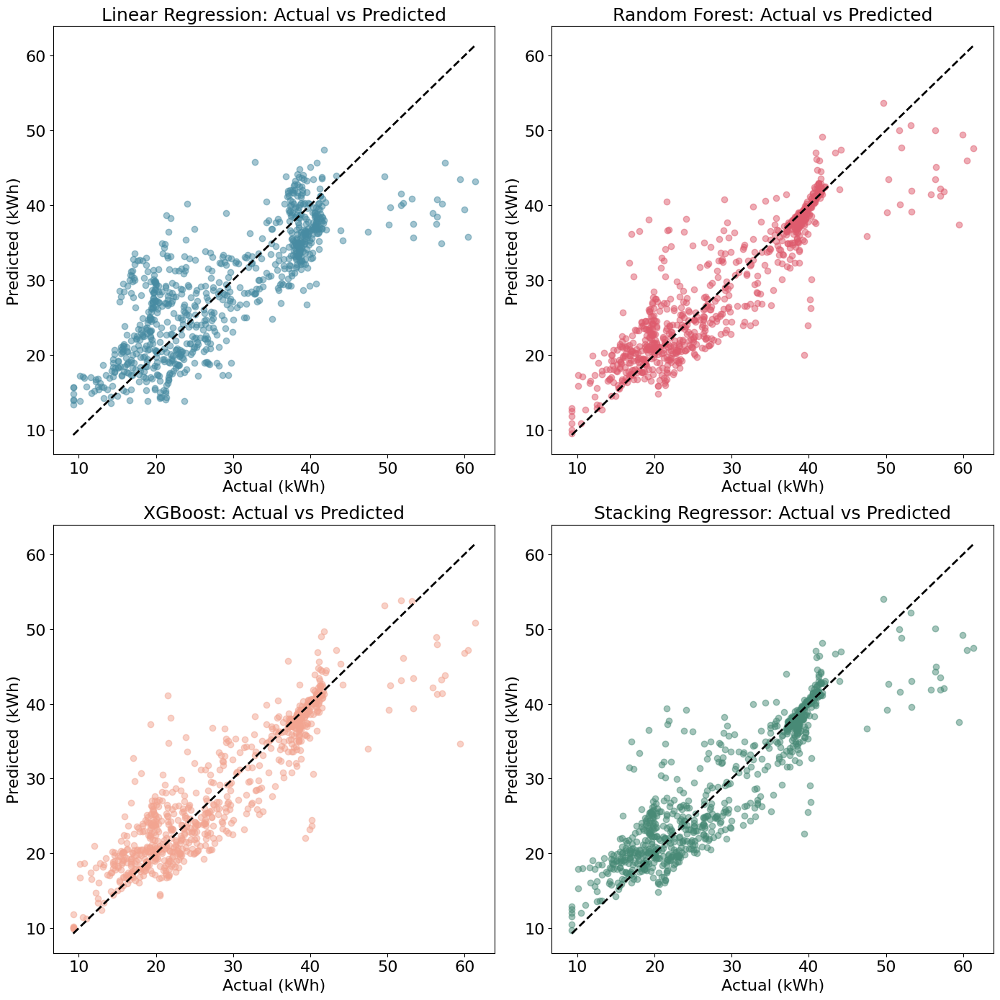

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, StackingRegressor
import xgboost as xgb
from matplotlib.ticker import FuncFormatter

# Load the selected feature data
train_selected = pd.read_csv('train_selected_data.csv')
test_selected = pd.read_csv('test_selected_data.csv')

# Prepare data
X_train = train_selected.drop('WH_RTU_Total', axis=1)
y_train = train_selected['WH_RTU_Total']
X_test = test_selected.drop('WH_RTU_Total', axis=1)
y_test = test_selected['WH_RTU_Total']

# Initialize models
lin_reg = LinearRegression()
rf_reg = RandomForestRegressor(n_estimators=100, random_state=42)
xgb_reg = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=6, random_state=42)
stacking_reg = StackingRegressor(
    estimators=[
        ('rf', RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)),
        ('gb', GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42))
    ],
    final_estimator=LinearRegression(),
    cv=5
)

# Train models
lin_reg.fit(X_train, y_train)
rf_reg.fit(X_train, y_train)
xgb_reg.fit(X_train, y_train)
stacking_reg.fit(X_train, y_train)

# Predictions
lin_y_test_pred = lin_reg.predict(X_test)
rf_y_test_pred = rf_reg.predict(X_test)
xgb_y_test_pred = xgb_reg.predict(X_test)
stacking_y_test_pred = stacking_reg.predict(X_test)

# Function to format the scale (without 'K')
def thousand_formatter(x, pos):
    return f'{int(x/1000)}' if int(x/1000) != 0 else f'{int(x)}'

formatter = FuncFormatter(thousand_formatter)

# Plotting
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 14))

# Apply font size changes
for ax in axes.flat:
    ax.xaxis.set_major_formatter(formatter)
    ax.yaxis.set_major_formatter(formatter)
    ax.tick_params(axis='both', which='major', labelsize=16)
    ax.set_xlabel('Actual (kWh)', fontsize=16)
    ax.set_ylabel('Predicted (kWh)', fontsize=16)
    ax.set_title(ax.get_title(), fontsize=18)

# Linear Regression
axes[0, 0].scatter(y_test, lin_y_test_pred, alpha=0.5, color='#478BA2')
axes[0, 0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
axes[0, 0].set_title('Linear Regression: Actual vs Predicted', fontsize=18)

# Random Forest
axes[0, 1].scatter(y_test, rf_y_test_pred, alpha=0.5, color='#DE5B6D')
axes[0, 1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
axes[0, 1].set_title('Random Forest: Actual vs Predicted', fontsize=18)

# XGBoost
axes[1, 0].scatter(y_test, xgb_y_test_pred, alpha=0.5, color='#F2A490')
axes[1, 0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
axes[1, 0].set_title('XGBoost: Actual vs Predicted', fontsize=18)

# Stacking Regressor
axes[1, 1].scatter(y_test, stacking_y_test_pred, alpha=0.5, color='#488A76')
axes[1, 1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
axes[1, 1].set_title('Stacking Regressor: Actual vs Predicted', fontsize=18)

plt.tight_layout()
plt.show()


### Before Hyperparameter Tuning(line)

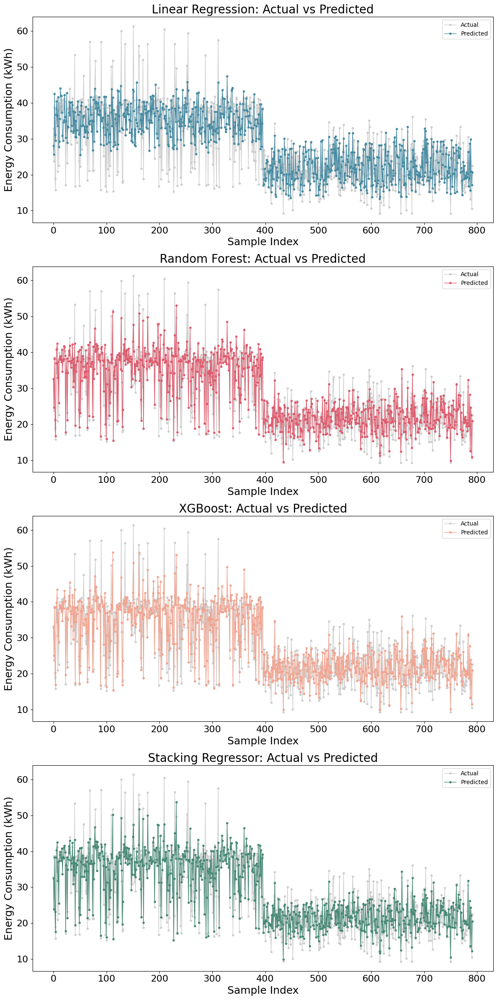

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, StackingRegressor
import xgboost as xgb

# Load the selected feature data
train_selected = pd.read_csv('train_selected_data.csv')
test_selected = pd.read_csv('test_selected_data.csv')

# Prepare data
X_train = train_selected.drop('WH_RTU_Total', axis=1)
y_train = train_selected['WH_RTU_Total'] / 1000  # Convert to kWh
X_test = test_selected.drop('WH_RTU_Total', axis=1)
y_test = test_selected['WH_RTU_Total'] / 1000  # Convert to kWh

# Initialize models
lin_reg = LinearRegression()
rf_reg = RandomForestRegressor(n_estimators=100, random_state=42)
xgb_reg = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=6, random_state=42)
stacking_reg = StackingRegressor(
    estimators=[
        ('rf', RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)),
        ('gb', GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42))
    ],
    final_estimator=LinearRegression(),
    cv=5
)

# Train models
lin_reg.fit(X_train, y_train)
rf_reg.fit(X_train, y_train)
xgb_reg.fit(X_train, y_train)
stacking_reg.fit(X_train, y_train)

# Predictions
lin_y_test_pred = lin_reg.predict(X_test)
rf_y_test_pred = rf_reg.predict(X_test)
xgb_y_test_pred = xgb_reg.predict(X_test)
stacking_y_test_pred = stacking_reg.predict(X_test)

# Plotting
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(12, 24))

# Set titles and colors for plotting
models = {
    'Linear Regression': (lin_y_test_pred, '#478BA2'),
    'Random Forest': (rf_y_test_pred, '#DE5B6D'),
    'XGBoost': (xgb_y_test_pred, '#F2A490'),
    'Stacking Regressor': (stacking_y_test_pred, '#488A76')
}

# Flatten axes for easy iteration
axes = axes.flatten()

for ax, (model_name, (predictions, color)) in zip(axes, models.items()):
    ax.plot(y_test.reset_index(drop=True), label='Actual', color='#cecece', marker='o', linestyle='-', linewidth=1, markersize=3)
    ax.plot(predictions, label='Predicted', color=color, marker='o', linestyle='-', linewidth=1, markersize=3)
    ax.set_title(f'{model_name}: Actual vs Predicted', fontsize=20)
    ax.set_xlabel('Sample Index', fontsize=18)
    ax.set_ylabel('Energy Consumption (kWh)', fontsize=18)
    ax.tick_params(axis='both', which='major', labelsize=16)  # Set the fontsize for tick labels
    ax.legend()

plt.tight_layout()
plt.show()


### After Hyperparameter Tuning(scatter)

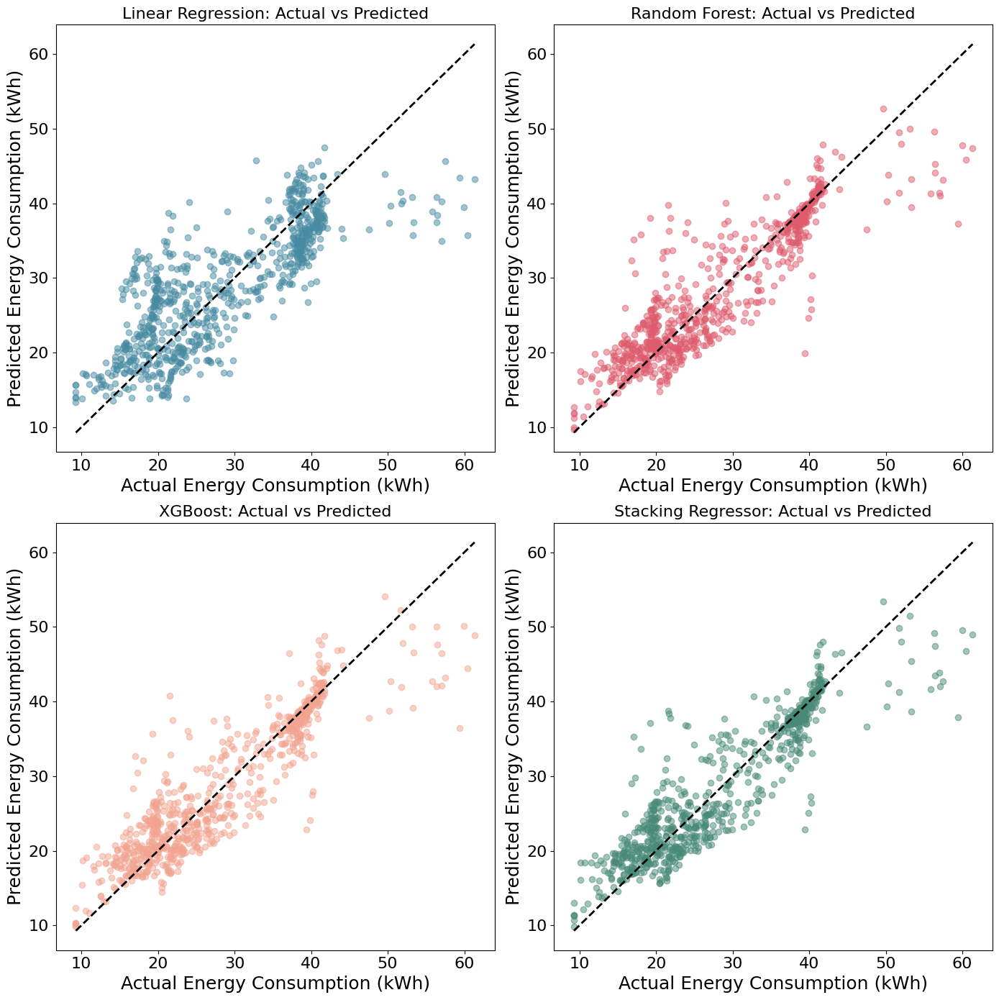

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, StackingRegressor
import xgboost as xgb
from matplotlib.ticker import FuncFormatter

# Load the selected feature data
train_selected = pd.read_csv('train_selected_data.csv')
test_selected = pd.read_csv('test_selected_data.csv')

# Prepare data
X_train = train_selected.drop('WH_RTU_Total', axis=1)
y_train = train_selected['WH_RTU_Total'] / 1000  # Convert to kWh for consistency
X_test = test_selected.drop('WH_RTU_Total', axis=1)
y_test = test_selected['WH_RTU_Total'] / 1000  # Convert to kWh for consistency

# Initialize and train models
lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)
lin_y_test_pred = lin_reg.predict(X_test)

rf_reg = RandomForestRegressor(n_estimators=200, max_depth=30, min_samples_split=2, min_samples_leaf=2, max_features=None, bootstrap=True, random_state=42)
rf_reg.fit(X_train, y_train)
rf_y_test_pred = rf_reg.predict(X_test)

xgb_reg = xgb.XGBRegressor(colsample_bytree=0.8, learning_rate=0.05, max_depth=6, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=1.0, random_state=42)
xgb_reg.fit(X_train, y_train)
xgb_y_test_pred = xgb_reg.predict(X_test)

estimators = [
    ('rf', rf_reg),
    ('gb', GradientBoostingRegressor(n_estimators=300, min_samples_split=2, max_depth=7, learning_rate=0.01, subsample=0.6, random_state=42))
]
stacking_reg = StackingRegressor(estimators=estimators, final_estimator=LinearRegression(), cv=5)
stacking_reg.fit(X_train, y_train)
stacking_y_test_pred = stacking_reg.predict(X_test)

# Function to format the scale as whole numbers
def integer_formatter(x, pos):
    return f'{int(x)}'

formatter = FuncFormatter(integer_formatter)

# Plotting
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 14))

# Apply font size changes
for ax in axes.flat:
    ax.xaxis.set_major_formatter(formatter)
    ax.yaxis.set_major_formatter(formatter)
    ax.tick_params(axis='both', which='major', labelsize=16)  # Set tick label font size to 14
    ax.set_xlabel('Actual Energy Consumption (kWh)', fontsize=18)
    ax.set_ylabel('Predicted Energy Consumption (kWh)', fontsize=18)

# Linear Regression
axes[0, 0].scatter(y_test, lin_y_test_pred, alpha=0.5, color='#478BA2')
axes[0, 0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
axes[0, 0].set_title('Linear Regression: Actual vs Predicted', fontsize=16)

# Random Forest
axes[0, 1].scatter(y_test, rf_y_test_pred, alpha=0.5, color='#DE5B6D')
axes[0, 1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
axes[0, 1].set_title('Random Forest: Actual vs Predicted', fontsize=16)

# XGBoost
axes[1, 0].scatter(y_test, xgb_y_test_pred, alpha=0.5, color='#F2A490')
axes[1, 0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
axes[1, 0].set_title('XGBoost: Actual vs Predicted', fontsize=16)

# Stacking Regressor
axes[1, 1].scatter(y_test, stacking_y_test_pred, alpha=0.5, color='#488A76')
axes[1, 1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
axes[1, 1].set_title('Stacking Regressor: Actual vs Predicted', fontsize=16)

plt.tight_layout()
plt.show()


### After Hyperparameter Tuning(line)

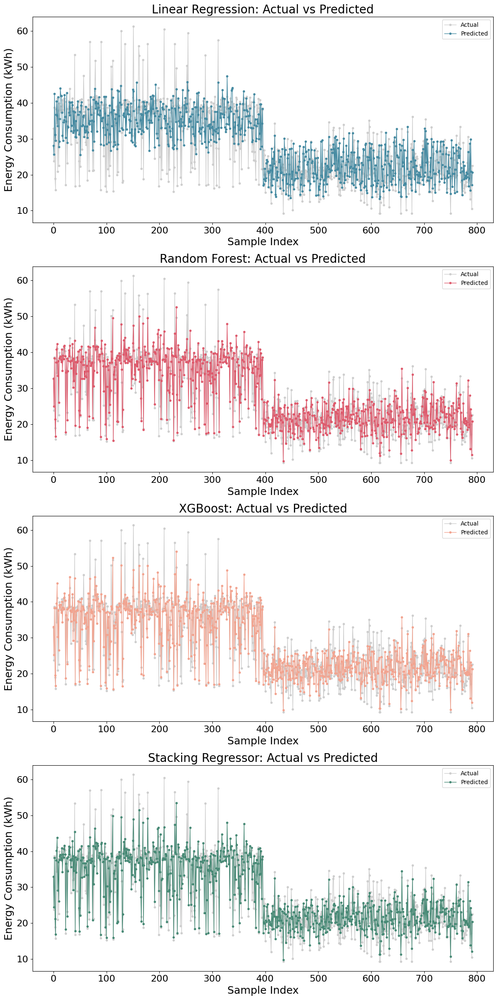

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, StackingRegressor
import xgboost as xgb
from matplotlib.ticker import FuncFormatter

# Load the selected feature data
train_selected = pd.read_csv('train_selected_data.csv')
test_selected = pd.read_csv('test_selected_data.csv')

# Prepare data
X_train = train_selected.drop('WH_RTU_Total', axis=1)
y_train = train_selected['WH_RTU_Total'] / 1000  # Convert to kWh for consistency
X_test = test_selected.drop('WH_RTU_Total', axis=1)
y_test = test_selected['WH_RTU_Total'] / 1000  # Convert to kWh for consistency

# Initialize and train models
lin_reg = LinearRegression()
rf_reg = RandomForestRegressor(n_estimators=200, max_depth=30, min_samples_split=2, min_samples_leaf=2, bootstrap=True, random_state=42)
xgb_reg = xgb.XGBRegressor(colsample_bytree=0.8, learning_rate=0.05, max_depth=6, n_estimators=200, reg_alpha=0.1, reg_lambda=1, subsample=1.0, random_state=42)
stacking_reg = StackingRegressor(
    estimators=[
        ('rf', rf_reg),
        ('gb', GradientBoostingRegressor(n_estimators=300, min_samples_split=2, max_depth=7, learning_rate=0.01, subsample=0.6, random_state=42))
    ],
    final_estimator=LinearRegression(),
    cv=5
)

lin_reg.fit(X_train, y_train)
rf_reg.fit(X_train, y_train)
xgb_reg.fit(X_train, y_train)
stacking_reg.fit(X_train, y_train)

# Predictions
lin_y_test_pred = lin_reg.predict(X_test)
rf_y_test_pred = rf_reg.predict(X_test)
xgb_y_test_pred = xgb_reg.predict(X_test)
stacking_y_test_pred = stacking_reg.predict(X_test)

# Plotting
fig, axes = plt.subplots(nrows=4, figsize=(12, 24))

# Set titles and colors for plotting
models = {
    'Linear Regression': (lin_y_test_pred, '#478BA2'),
    'Random Forest': (rf_y_test_pred, '#DE5B6D'),
    'XGBoost': (xgb_y_test_pred, '#F2A490'),
    'Stacking Regressor': (stacking_y_test_pred, '#488A76')
}

for ax, (model_name, (predictions, color)) in zip(axes, models.items()):
    ax.plot(y_test.reset_index(drop=True), label='Actual', color='#cecece', marker='o', linestyle='-', linewidth=1, markersize=3)
    ax.plot(predictions, label='Predicted', color=color, marker='o', linestyle='-', linewidth=1, markersize=3)
    ax.set_title(f'{model_name}: Actual vs Predicted', fontsize=20)
    ax.set_xlabel('Sample Index', fontsize=18)
    ax.set_ylabel('Energy Consumption (kWh)', fontsize=18)
    ax.legend()
    ax.tick_params(axis='both', which='major', labelsize=16)

plt.tight_layout()
plt.show()


# EXPERIMENT 2

### Exp2 Data Preparation

In [ ]:
train_cooling_data = pd.read_csv('train_cooling_data.csv')
test_cooling_data = pd.read_csv('test_cooling_data.csv')
train_heating_data = pd.read_csv('train_heating_data.csv')
test_heating_data = pd.read_csv('test_heating_data.csv')


# Extract the top features from the combined datasets, including the target column
train_cooling_selected= train_cooling_data[top_features + ['WH_RTU_Total']]
test_cooling_selected = test_cooling_data[top_features + ['WH_RTU_Total']]
train_heating_selected = train_heating_data[top_features + ['WH_RTU_Total']]
test_heating_selected = test_heating_data[top_features + ['WH_RTU_Total']]


# Save the selected feature data to new CSV files
train_cooling_selected.to_csv('train_cooling_selected_data.csv', index=False)
test_cooling_selected.to_csv('test_cooling_selected_data.csv', index=False)
train_heating_selected.to_csv('train_heating_selected_data.csv', index=False)
test_heating_selected.to_csv('test_heating_selected_data.csv', index=False)


## Exp2: Linear Regression for both cooling and heating data

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error

# Load the datasets
train_cooling_data = pd.read_csv('train_cooling_selected_data.csv')
test_cooling_data = pd.read_csv('test_cooling_selected_data.csv')
train_heating_data = pd.read_csv('train_heating_selected_data.csv')
test_heating_data = pd.read_csv('test_heating_selected_data.csv')

# Prepare cooling and heating data
X_cooling_train = train_cooling_data.drop(columns=['WH_RTU_Total'])
y_cooling_train = train_cooling_data['WH_RTU_Total']
X_cooling_test = test_cooling_data.drop(columns=['WH_RTU_Total'])
y_cooling_test = test_cooling_data['WH_RTU_Total']

X_heating_train = train_heating_data.drop(columns=['WH_RTU_Total'])
y_heating_train = train_heating_data['WH_RTU_Total']
X_heating_test = test_heating_data.drop(columns=['WH_RTU_Total'])
y_heating_test = test_heating_data['WH_RTU_Total']

# Train Linear Regression models
lr_model_cooling = LinearRegression()
lr_model_heating = LinearRegression()

lr_model_cooling.fit(X_cooling_train, y_cooling_train)
lr_model_heating.fit(X_heating_train, y_heating_train)

# Make predictions on the test sets
y_cooling_pred = lr_model_cooling.predict(X_cooling_test)
y_heating_pred = lr_model_heating.predict(X_heating_test)

# Calculate MAE for cooling and heating test sets
cooling_mae = mean_absolute_error(y_cooling_test, y_cooling_pred)
heating_mae = mean_absolute_error(y_heating_test, y_heating_pred)

# Calculate the mean of the target variable for each test set
y_cooling_mean = y_cooling_test.mean()
y_heating_mean = y_heating_test.mean()

# Calculate CV-MAE for cooling and heating data
cooling_cv_mae = (cooling_mae / y_cooling_mean) * 100
heating_cv_mae = (heating_mae / y_heating_mean) * 100

# Display the model performance
print("Linear Regression Model Performance on Cooling Data")
print(f"Cooling Test MAE: {cooling_mae}")
print(f"Cooling Test CV-MAE: {cooling_cv_mae}%")

print("\nLinear Regression Model Performance on Heating Data")
print(f"Heating Test MAE: {heating_mae}")
print(f"Heating Test CV-MAE: {heating_cv_mae}%")


FileNotFoundError: [Errno 2] No such file or directory: 'train_cooling_selected_data.csv'

## Exp2: RANDOM FOREST (Default)

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error


# Load the selected feature data
train_cooling_selected = pd.read_csv('train_cooling_selected_data.csv')
test_cooling_selected = pd.read_csv('test_cooling_selected_data.csv')
train_heating_selected = pd.read_csv('train_heating_selected_data.csv')
test_heating_selected = pd.read_csv('test_heating_selected_data.csv')


# Load and prepare your data
X_cooling_train = train_cooling_selected.drop('WH_RTU_Total', axis=1)
y_cooling_train = train_cooling_selected['WH_RTU_Total']
X_cooling_test = test_cooling_selected.drop('WH_RTU_Total', axis=1)
y_cooling_test = test_cooling_selected['WH_RTU_Total']

X_heating_train = train_heating_selected.drop('WH_RTU_Total', axis=1)
y_heating_train = train_heating_selected['WH_RTU_Total']
X_heating_test = test_heating_selected.drop('WH_RTU_Total', axis=1)
y_heating_test = test_heating_selected['WH_RTU_Total']


# Initialize the Random Forest model
rf_model_cooling = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model_heating = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the model on cooling data
rf_model_cooling.fit(X_cooling_train, y_cooling_train)

# Train the model on heating data
rf_model_heating.fit(X_heating_train, y_heating_train)

# Make predictions on the test sets
y_cooling_pred = rf_model_cooling.predict(X_cooling_test)
y_heating_pred = rf_model_heating.predict(X_heating_test)

# Calculate MAE for cooling and heating test sets
cooling_mae = mean_absolute_error(y_cooling_test, y_cooling_pred)
heating_mae = mean_absolute_error(y_heating_test, y_heating_pred)

# Calculate the mean of the target variable for each test set
y_cooling_mean = y_cooling_test.mean()
y_heating_mean = y_heating_test.mean()

# Calculate CV-MAE for cooling and heating data
cooling_cv_mae = (cooling_mae / y_cooling_mean) * 100
heating_cv_mae = (heating_mae / y_heating_mean) * 100

# Display the model performance
print("Random Forest Model Performance on Cooling Data")
print(f"Cooling Test MAE: {cooling_mae}")
print(f"Cooling Test CV-MAE: {cooling_cv_mae}%")

print("\nRandom Forest Model Performance on Heating Data")
print(f"Heating Test MAE: {heating_mae}")
print(f"Heating Test CV-MAE: {heating_cv_mae}%")


Random Forest Model Performance on Cooling Data
Cooling Test MAE: 2791.9525231484117
Cooling Test CV-MAE: 7.8427788909511715%

Random Forest Model Performance on Heating Data
Heating Test MAE: 3077.804206751775
Heating Test CV-MAE: 14.497673763334534%


### Exp2_Hyper Parameter Tuning for Random Forest

### RF_HY_for_Cooling

### Exp2 Random Forest Cooling Best Performance:

Cooling Test MAE: 2776.2243149046094

Cooling Test CV-MAE: 7.80%

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error

# Define the refined parameter grid for RandomizedSearchCV
param_grid = {
    'n_estimators': [100, 200, 300, 400],   # Moderate range for number of trees
    'max_depth': [None, 20, 30, 40],        # Reintroduce no depth limit
    'min_samples_split': [2, 5],            # Keep splits close to default
    'min_samples_leaf': [1, 2],             # Allow smaller leaf sizes
    'max_features': ['sqrt', None],         # Focus on practical options
    'bootstrap': [True]                     # Fix bootstrap to True for stability
}

# Initialize the Random Forest model for cooling data
rf_model_cooling = RandomForestRegressor(random_state=42)

# Set up RandomizedSearchCV for cooling data
random_search_cooling = RandomizedSearchCV(
    estimator=rf_model_cooling,
    param_distributions=param_grid,
    n_iter=40,  # Explore a wider range with moderate iterations
    cv=10,      # 10-fold cross-validation
    verbose=2,
    random_state=42,
    n_jobs=-1   # Use all available cores
)

# Fit RandomizedSearchCV to the cooling training data
random_search_cooling.fit(X_cooling_train, y_cooling_train)

# Extract the best estimator
best_rf_cooling = random_search_cooling.best_estimator_

# Make predictions on the cooling test set
y_cooling_pred = best_rf_cooling.predict(X_cooling_test)

# Calculate MAE and CV-MAE for the cooling data
cooling_mae = mean_absolute_error(y_cooling_test, y_cooling_pred)
y_cooling_mean = y_cooling_test.mean()
cooling_cv_mae = (cooling_mae / y_cooling_mean) * 100

# Display the performance of the tuned model
print("Tuned Random Forest Model Performance on Cooling Data")
print(f"Best Parameters for Cooling: {random_search_cooling.best_params_}")
print(f"Cooling Test MAE: {cooling_mae}")
print(f"Cooling Test CV-MAE: {cooling_cv_mae:.2f}%")


Fitting 10 folds for each of 40 candidates, totalling 400 fits
Tuned Random Forest Model Performance on Cooling Data
Best Parameters for Cooling: {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': None, 'max_depth': 20, 'bootstrap': True}
Cooling Test MAE: 2776.2243149046094
Cooling Test CV-MAE: 7.80%


### Other Attempts

Cooling Test MAE: 2807.0462914298528
Cooling Test CV-MAE: 7.89%

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error

# Define the refined parameter grid for RandomizedSearchCV
param_grid = {
    'n_estimators': [100, 200, 300, 400],  # Focused range
    'max_depth': [10, 20, 30, None],       # Moderate depths and no depth limit
    'min_samples_split': [2, 5, 8],        # Larger splits for regularization
    'min_samples_leaf': [3, 4, 5],         # Avoid overly small leaves
    'bootstrap': [True],                   # Fix bootstrap to True for stability
    'max_features': ['sqrt', 'log2', None]  # Include feature selection strategies
}


# Initialize the Random Forest model for cooling data
rf_model_cooling = RandomForestRegressor(random_state=42)

# Set up RandomizedSearchCV for cooling data
random_search_cooling = RandomizedSearchCV(
    estimator=rf_model_cooling,
    param_distributions=param_grid,
    n_iter=50,  # Fewer iterations for faster evaluation
    cv=10,  # 10-fold cross-validation for robustness
    verbose=2,
    random_state=42,
    n_jobs=-1  # Use all available cores
)

# Fit RandomizedSearchCV to the cooling training data
random_search_cooling.fit(X_cooling_train, y_cooling_train)

# Extract the best estimator
best_rf_cooling = random_search_cooling.best_estimator_

# Make predictions on the cooling test set
y_cooling_pred = best_rf_cooling.predict(X_cooling_test)

# Calculate MAE and CV-MAE for the cooling data
cooling_mae = mean_absolute_error(y_cooling_test, y_cooling_pred)
y_cooling_mean = y_cooling_test.mean()
cooling_cv_mae = (cooling_mae / y_cooling_mean) * 100

# Display the performance of the tuned model
print("Tuned Random Forest Model Performance on Cooling Data")
print(f"Best Parameters for Cooling: {random_search_cooling.best_params_}")
print(f"Cooling Test MAE: {cooling_mae}")
print(f"Cooling Test CV-MAE: {cooling_cv_mae:.2f}%")


Fitting 10 folds for each of 50 candidates, totalling 500 fits
Tuned Random Forest Model Performance on Cooling Data
Best Parameters for Cooling: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': None, 'max_depth': 30, 'bootstrap': True}
Cooling Test MAE: 2807.0462914298528
Cooling Test CV-MAE: 7.89%


Cooling Test MAE: 2828.6019296359996
Cooling Test CV-MAE: 7.95%

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error

# Define the parameter grid for RandomizedSearchCV
param_grid = {
    'n_estimators': [50, 100, 200, 300, 400, 500],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

# Initialize the Random Forest model for cooling data
rf_model_cooling = RandomForestRegressor(random_state=42)

# Set up RandomizedSearchCV for cooling data
random_search_cooling = RandomizedSearchCV(
    estimator=rf_model_cooling,
    param_distributions=param_grid,
    n_iter=100,  # Number of parameter combinations to try
    cv=5,  # 5-fold cross-validation
    verbose=2,
    random_state=42,
    n_jobs=-1  # Use all available cores
)

# Fit RandomizedSearchCV to the cooling training data
random_search_cooling.fit(X_cooling_train, y_cooling_train)

# Extract the best estimator
best_rf_cooling = random_search_cooling.best_estimator_

# Make predictions on the cooling test set
y_cooling_pred = best_rf_cooling.predict(X_cooling_test)

# Calculate MAE and CV-MAE for the cooling data
cooling_mae = mean_absolute_error(y_cooling_test, y_cooling_pred)
y_cooling_mean = y_cooling_test.mean()
cooling_cv_mae = (cooling_mae / y_cooling_mean) * 100

# Display the performance of the tuned model
print("Tuned Random Forest Model Performance on Cooling Data")
print(f"Best Parameters for Cooling: {random_search_cooling.best_params_}")
print(f"Cooling Test MAE: {cooling_mae}")
print(f"Cooling Test CV-MAE: {cooling_cv_mae:.2f}%")


Fitting 5 folds for each of 100 candidates, totalling 500 fits
Tuned Random Forest Model Performance on Cooling Data
Best Parameters for Cooling: {'n_estimators': 300, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_depth': None, 'bootstrap': True}
Cooling Test MAE: 2828.6019296359996
Cooling Test CV-MAE: 7.95%


### RF_HY_for_Heating
Best performance

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error

# Define the parameter grid for RandomizedSearchCV
param_grid = {
    'n_estimators': [50, 100, 200, 300, 400, 500],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

# Initialize the Random Forest model for heating data
rf_model_heating = RandomForestRegressor(random_state=42)

# Set up RandomizedSearchCV for heating data
random_search_heating = RandomizedSearchCV(
    estimator=rf_model_heating,
    param_distributions=param_grid,
    n_iter=100,  # Number of random combinations to try
    cv=5,  # 5-fold cross-validation
    verbose=2,
    random_state=42,
    n_jobs=-1  # Use all available cores
)

# Fit RandomizedSearchCV to the heating training data
random_search_heating.fit(X_heating_train, y_heating_train)

# Extract the best estimator
best_rf_heating = random_search_heating.best_estimator_

# Make predictions on the heating test set
y_heating_pred = best_rf_heating.predict(X_heating_test)

# Calculate MAE and CV-MAE for the heating data
heating_mae = mean_absolute_error(y_heating_test, y_heating_pred)
y_heating_mean = y_heating_test.mean()
heating_cv_mae = (heating_mae / y_heating_mean) * 100

# Display the performance of the tuned model
print("Tuned Random Forest Model Performance on Heating Data")
print(f"Best Parameters for Heating: {random_search_heating.best_params_}")
print(f"Heating Test MAE: {heating_mae}")
print(f"Heating Test CV-MAE: {heating_cv_mae:.2f}%")


Fitting 5 folds for each of 100 candidates, totalling 500 fits


/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Tuned Random Forest Model Performance on Heating Data
Best Parameters for Heating: {'n_estimators': 400, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_depth': 10, 'bootstrap': True}
Heating Test MAE: 3074.46295356542
Heating Test CV-MAE: 14.48%


## Exp2: XGBOOST Default

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
import xgboost as xgb

# Load the selected feature data
train_cooling_selected = pd.read_csv('train_cooling_selected_data.csv')
test_cooling_selected = pd.read_csv('test_cooling_selected_data.csv')
train_heating_selected = pd.read_csv('train_heating_selected_data.csv')
test_heating_selected = pd.read_csv('test_heating_selected_data.csv')


# Load and prepare your data
X_cooling_train = train_cooling_selected.drop('WH_RTU_Total', axis=1)
y_cooling_train = train_cooling_selected['WH_RTU_Total']
X_cooling_test = test_cooling_selected.drop('WH_RTU_Total', axis=1)
y_cooling_test = test_cooling_selected['WH_RTU_Total']

X_heating_train = train_heating_selected.drop('WH_RTU_Total', axis=1)
y_heating_train = train_heating_selected['WH_RTU_Total']
X_heating_test = test_heating_selected.drop('WH_RTU_Total', axis=1)
y_heating_test = test_heating_selected['WH_RTU_Total']

# Initialize the XGBoost model
xgb_model_cooling = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=6, random_state=42)
xgb_model_heating = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=6, random_state=42)

# Train the model on cooling data
xgb_model_cooling.fit(X_cooling_train, y_cooling_train)

# Train the model on heating data
xgb_model_heating.fit(X_heating_train, y_heating_train)

# Make predictions on the test sets
y_cooling_pred = xgb_model_cooling.predict(X_cooling_test)
y_heating_pred = xgb_model_heating.predict(X_heating_test)

# Calculate MAE for cooling and heating test sets
cooling_mae = mean_absolute_error(y_cooling_test, y_cooling_pred)
heating_mae = mean_absolute_error(y_heating_test, y_heating_pred)

# Calculate the mean of the target variable for each test set
y_cooling_mean = y_cooling_test.mean()
y_heating_mean = y_heating_test.mean()

# Calculate CV-MAE for cooling and heating data
cooling_cv_mae = (cooling_mae / y_cooling_mean) * 100
heating_cv_mae = (heating_mae / y_heating_mean) * 100

# Display the model performance
print("XGBoost Model Performance on Cooling Data")
print(f"Cooling Test MAE: {cooling_mae}")
print(f"Cooling Test CV-MAE: {cooling_cv_mae}%")

print("\nXGBoost Model Performance on Heating Data")
print(f"Heating Test MAE: {heating_mae}")
print(f"Heating Test CV-MAE: {heating_cv_mae}%")


XGBoost Model Performance on Cooling Data
Cooling Test MAE: 2670.277842688605
Cooling Test CV-MAE: 7.5009866836835135%

XGBoost Model Performance on Heating Data
Heating Test MAE: 3105.740031354482
Heating Test CV-MAE: 14.629262533832451%


### Exp2 after Hyper Parameter Tuning: XGBoost Cooling Best Performance



In [ ]:
import pandas as pd
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_absolute_error
import xgboost as xgb

# Load the selected feature data for cooling
train_cooling_selected = pd.read_csv('train_cooling_selected_data.csv')
test_cooling_selected = pd.read_csv('test_cooling_selected_data.csv')

# Prepare the data for cooling
X_cooling_train = train_cooling_selected.drop('WH_RTU_Total', axis=1)
y_cooling_train = train_cooling_selected['WH_RTU_Total']
X_cooling_test = test_cooling_selected.drop('WH_RTU_Total', axis=1)
y_cooling_test = test_cooling_selected['WH_RTU_Total']

# Define the parameter grid for RandomizedSearchCV
param_grid = {
    'n_estimators': [50, 100, 200, 300],      # Number of boosting rounds
    'learning_rate': [0.01, 0.05, 0.1, 0.2],  # Step size shrinkage
    'max_depth': [3, 4, 5, 6, 7, 8],          # Maximum tree depth
    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0],   # Fraction of samples for training
    'colsample_bytree': [0.6, 0.7, 0.8, 0.9, 1.0],  # Fraction of features for tree
    'gamma': [0, 0.1, 0.2, 0.3, 0.4]          # Minimum loss reduction for split
}

# Initialize the XGBoost model for cooling data
xgb_model_cooling = xgb.XGBRegressor(random_state=42)

# Use RandomizedSearchCV for cooling data
random_search_cooling = RandomizedSearchCV(
    estimator=xgb_model_cooling,
    param_distributions=param_grid,
    n_iter=50,  # Number of random combinations to try
    scoring='neg_mean_absolute_error',
    cv=3,  # 3-fold cross-validation
    verbose=1,
    random_state=42,
    n_jobs=-1  # Use all available cores
)

# Fit the RandomizedSearchCV on cooling data
random_search_cooling.fit(X_cooling_train, y_cooling_train)

# Get the best model and parameters
best_cooling_model = random_search_cooling.best_estimator_
print("Best Parameters for Cooling Model:", random_search_cooling.best_params_)

# Evaluate on the cooling test set
y_cooling_pred = best_cooling_model.predict(X_cooling_test)

# Calculate MAE for the tuned model
cooling_mae = mean_absolute_error(y_cooling_test, y_cooling_pred)

# Calculate the mean of the target variable for the cooling test set
y_cooling_mean = y_cooling_test.mean()

# Calculate CV-MAE for cooling data
cooling_cv_mae = (cooling_mae / y_cooling_mean) * 100

# Display the model performance
print("\nTuned XGBoost Model Performance on Cooling Data")
print(f"Cooling Test MAE: {cooling_mae}")
print(f"Cooling Test CV-MAE: {cooling_cv_mae:.2f}%")


Fitting 3 folds for each of 50 candidates, totalling 150 fits
Best Parameters for Cooling Model: {'subsample': 0.9, 'n_estimators': 300, 'max_depth': 6, 'learning_rate': 0.05, 'gamma': 0.3, 'colsample_bytree': 0.9}

Tuned XGBoost Model Performance on Cooling Data
Cooling Test MAE: 2578.0844504419197
Cooling Test CV-MAE: 7.24%


### Exp2 after Hyper Parameter Tuning: XGBoost Heating Best Performance  

In [ ]:
import pandas as pd
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_absolute_error
import xgboost as xgb

# Load the selected feature data for heating
train_heating_selected = pd.read_csv('train_heating_selected_data.csv')
test_heating_selected = pd.read_csv('test_heating_selected_data.csv')

# Prepare the data for heating
X_heating_train = train_heating_selected.drop('WH_RTU_Total', axis=1)
y_heating_train = train_heating_selected['WH_RTU_Total']
X_heating_test = test_heating_selected.drop('WH_RTU_Total', axis=1)
y_heating_test = test_heating_selected['WH_RTU_Total']

# Define the refined parameter grid for heating data
param_grid = {
    'n_estimators': [100, 150, 200],           # Keep close to default
    'learning_rate': [0.05, 0.1, 0.2],         # Slower learning for refinement
    'max_depth': [4, 5, 6],                    # Limit depth to avoid overfitting
    'subsample': [0.7, 0.8, 1.0],              # Explore smaller subsamples
    'colsample_bytree': [0.7, 0.8, 1.0],       # Fraction of features for trees
    'gamma': [0, 0.1, 0.2],                    # Regularization for tree splits
    'reg_lambda': [1, 5, 10]                   # L2 regularization
}

# Initialize the XGBoost model for heating data
xgb_model_heating = xgb.XGBRegressor(random_state=42)

# Use RandomizedSearchCV for heating data
random_search_heating = RandomizedSearchCV(
    estimator=xgb_model_heating,
    param_distributions=param_grid,
    n_iter=50,  # Number of random combinations to try
    scoring='neg_mean_absolute_error',
    cv=3,  # 3-fold cross-validation
    verbose=1,
    random_state=42,
    n_jobs=-1  # Use all available cores
)

# Fit the RandomizedSearchCV on heating data
random_search_heating.fit(X_heating_train, y_heating_train)

# Get the best model and parameters
best_heating_model = random_search_heating.best_estimator_
print("Best Parameters for Heating Model:", random_search_heating.best_params_)

# Evaluate on the heating test set
y_heating_pred = best_heating_model.predict(X_heating_test)

# Calculate MAE for the tuned model
heating_mae = mean_absolute_error(y_heating_test, y_heating_pred)

# Calculate the mean of the target variable for the heating test set
y_heating_mean = y_heating_test.mean()

# Calculate CV-MAE for heating data
heating_cv_mae = (heating_mae / y_heating_mean) * 100

# Display the model performance
print("\nTuned XGBoost Model Performance on Heating Data")
print(f"Heating Test MAE: {heating_mae}")
print(f"Heating Test CV-MAE: {heating_cv_mae:.2f}%")


Fitting 3 folds for each of 50 candidates, totalling 150 fits
Best Parameters for Heating Model: {'subsample': 0.8, 'reg_lambda': 10, 'n_estimators': 150, 'max_depth': 6, 'learning_rate': 0.05, 'gamma': 0.1, 'colsample_bytree': 1.0}

Tuned XGBoost Model Performance on Heating Data
Heating Test MAE: 3021.9417390350377
Heating Test CV-MAE: 14.23%


### Other Attemptes

In [ ]:
import pandas as pd
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_absolute_error
import xgboost as xgb
import numpy as np

# Load the selected feature data
train_cooling_selected = pd.read_csv('train_cooling_selected_data.csv')
test_cooling_selected = pd.read_csv('test_cooling_selected_data.csv')
train_heating_selected = pd.read_csv('train_heating_selected_data.csv')
test_heating_selected = pd.read_csv('test_heating_selected_data.csv')

# Prepare the data
X_cooling_train = train_cooling_selected.drop('WH_RTU_Total', axis=1)
y_cooling_train = train_cooling_selected['WH_RTU_Total']
X_cooling_test = test_cooling_selected.drop('WH_RTU_Total', axis=1)
y_cooling_test = test_cooling_selected['WH_RTU_Total']

X_heating_train = train_heating_selected.drop('WH_RTU_Total', axis=1)
y_heating_train = train_heating_selected['WH_RTU_Total']
X_heating_test = test_heating_selected.drop('WH_RTU_Total', axis=1)
y_heating_test = test_heating_selected['WH_RTU_Total']

# Define the parameter grid for RandomizedSearchCV
param_grid = {
    'n_estimators': [50, 100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 4, 5, 6, 7, 8],
    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.6, 0.7, 0.8, 0.9, 1.0],
    'gamma': [0, 0.1, 0.2, 0.3, 0.4]
}

# Initialize the XGBoost models
xgb_model_cooling = xgb.XGBRegressor(random_state=42)
xgb_model_heating = xgb.XGBRegressor(random_state=42)

# Use RandomizedSearchCV for cooling data
random_search_cooling = RandomizedSearchCV(
    estimator=xgb_model_cooling,
    param_distributions=param_grid,
    n_iter=50,
    scoring='neg_mean_absolute_error',
    cv=3,
    verbose=1,
    random_state=42,
    n_jobs=-1
)

# Fit the model on cooling data
random_search_cooling.fit(X_cooling_train, y_cooling_train)

# Use RandomizedSearchCV for heating data
random_search_heating = RandomizedSearchCV(
    estimator=xgb_model_heating,
    param_distributions=param_grid,
    n_iter=50,
    scoring='neg_mean_absolute_error',
    cv=3,
    verbose=1,
    random_state=42,
    n_jobs=-1
)

# Fit the model on heating data
random_search_heating.fit(X_heating_train, y_heating_train)

# Get the best models and parameters
best_cooling_model = random_search_cooling.best_estimator_
best_heating_model = random_search_heating.best_estimator_

print("Best Parameters for Cooling Model:", random_search_cooling.best_params_)
print("Best Parameters for Heating Model:", random_search_heating.best_params_)

# Evaluate on the test sets
y_cooling_pred = best_cooling_model.predict(X_cooling_test)
y_heating_pred = best_heating_model.predict(X_heating_test)

# Calculate MAE for the tuned models
cooling_mae = mean_absolute_error(y_cooling_test, y_cooling_pred)
heating_mae = mean_absolute_error(y_heating_test, y_heating_pred)

# Calculate the mean of the target variable for each test set
y_cooling_mean = y_cooling_test.mean()
y_heating_mean = y_heating_test.mean()

# Calculate CV-MAE for cooling and heating data
cooling_cv_mae = (cooling_mae / y_cooling_mean) * 100
heating_cv_mae = (heating_mae / y_heating_mean) * 100

# Display the model performance
print("\nTuned XGBoost Model Performance on Cooling Data")
print(f"Cooling Test MAE: {cooling_mae}")
print(f"Cooling Test CV-MAE: {cooling_cv_mae}%")

print("\nTuned XGBoost Model Performance on Heating Data")
print(f"Heating Test MAE: {heating_mae}")
print(f"Heating Test CV-MAE: {heating_cv_mae}%")


Fitting 3 folds for each of 50 candidates, totalling 150 fits
Fitting 3 folds for each of 50 candidates, totalling 150 fits
Best Parameters for Cooling Model: {'subsample': 0.9, 'n_estimators': 300, 'max_depth': 6, 'learning_rate': 0.05, 'gamma': 0.3, 'colsample_bytree': 0.9}
Best Parameters for Heating Model: {'subsample': 1.0, 'n_estimators': 200, 'max_depth': 4, 'learning_rate': 0.05, 'gamma': 0.4, 'colsample_bytree': 0.9}

Tuned XGBoost Model Performance on Cooling Data
Cooling Test MAE: 2578.0844504419197
Cooling Test CV-MAE: 7.242009360608508%

Tuned XGBoost Model Performance on Heating Data
Heating Test MAE: 3128.768139948864
Heating Test CV-MAE: 14.737734023037518%


## Exp2: Stacking Ensemble Regressor Default Cooling

FOR COOLING

In [ ]:
import pandas as pd
from sklearn.ensemble import StackingRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error
from math import sqrt

# Load the selected feature data
train_selected = pd.read_csv('train_cooling_selected_data.csv')
test_selected = pd.read_csv('test_cooling_selected_data.csv')

# Load and prepare your data
X_train = train_selected.drop('WH_RTU_Total', axis=1)
y_train = train_selected['WH_RTU_Total']
X_test = test_selected.drop('WH_RTU_Total', axis=1)
y_test = test_selected['WH_RTU_Total']

# Calculate mean of y_train and y_test for percentage calculations
y_train_mean = y_train.mean()
y_test_mean = y_test.mean()

# Define the base models
base_models = [
    ('rf', RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)),
    ('gb', GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42))
]

# Define the meta-model (e.g., Linear Regression)
meta_model = LinearRegression()

# Set up the Stacking Regressor
stacking_regressor = StackingRegressor(estimators=base_models, final_estimator=meta_model, cv=5)

# Train the Stacking Regressor
stacking_regressor.fit(X_train, y_train)

# Make predictions on training and testing sets
y_train_pred = stacking_regressor.predict(X_train)
y_test_pred = stacking_regressor.predict(X_test)

# Calculate MAE and CV-MAE for training set
train_mae = mean_absolute_error(y_train, y_train_pred)
train_cv_mae = (train_mae / y_train_mean) * 100

# Calculate MAE and CV-MAE for testing set
test_mae = mean_absolute_error(y_test, y_test_pred)
test_cv_mae = (test_mae / y_test_mean) * 100

# Calculate RMSE for testing set
test_rmse = sqrt(mean_squared_error(y_test, y_test_pred))

# Display results
print("Stacking Regressor Performance")
print(f"Training MAE COOLING: {train_mae}")
print(f"Training COOLING CV-MAE (%): {train_cv_mae}%")
print(f"Test COOLING MAE: {test_mae}")
print(f"Test COOLING CV-MAE (%): {test_cv_mae}%")
print(f"Test RMSE: {test_rmse}")


Stacking Regressor Performance
Training MAE COOLING: 1168.4022351121985
Training COOLING CV-MAE (%): 3.2592554968574508%
Test COOLING MAE: 2879.8506816668046
Test COOLING CV-MAE (%): 8.07061879904528%
Test RMSE: 4854.272696449149


### Exp2 after Hyper Parameter Tuning: Stacking Ensemble Regressor Cooling Best Performance



**Best Tuned Model!**
Tuned Stacking Regressor Performance on Cooling Data

Test MAE: 2745.943790703918

Test CV-MAE (%): 7.71%

Test RMSE: 4751.379241361392


In [ ]:
import pandas as pd
from sklearn.ensemble import StackingRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import GridSearchCV, train_test_split
from math import sqrt

# Load the selected feature data
train_selected = pd.read_csv('train_cooling_selected_data.csv')
test_selected = pd.read_csv('test_cooling_selected_data.csv')

# Prepare the data
X_train = train_selected.drop('WH_RTU_Total', axis=1)
y_train = train_selected['WH_RTU_Total']
X_test = test_selected.drop('WH_RTU_Total', axis=1)
y_test = test_selected['WH_RTU_Total']

# Define the parameter grid for tuning the base models
param_grid = {
    'rf__n_estimators': [50, 100],
    'rf__max_depth': [5, 10],
    'gb__n_estimators': [50, 100],
    'gb__learning_rate': [0.05, 0.1],
    'gb__max_depth': [3, 5]
}

# Define the base models
base_models = [
    ('rf', RandomForestRegressor(random_state=42)),
    ('gb', GradientBoostingRegressor(random_state=42))
]

# Define the meta-model
meta_model = LinearRegression()

# Set up the Stacking Regressor
stacking_regressor = StackingRegressor(estimators=base_models, final_estimator=meta_model, cv=5)

# Set up GridSearchCV to tune the base models within the Stacking Regressor
grid_search = GridSearchCV(estimator=stacking_regressor, param_grid=param_grid, cv=3, scoring='neg_mean_absolute_error', verbose=1, n_jobs=-1)

# Train the model with hyperparameter tuning
grid_search.fit(X_train, y_train)

# Retrieve the best model and parameters
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
print("Best Parameters for Stacking Regressor:", best_params)

# Make predictions on the test set using the best model
y_test_pred = best_model.predict(X_test)

# Calculate MAE, CV-MAE, and RMSE for the testing set
test_mae = mean_absolute_error(y_test, y_test_pred)
test_cv_mae = (test_mae / y_test.mean()) * 100
test_rmse = sqrt(mean_squared_error(y_test, y_test_pred))

# Display results
print("Tuned Stacking Regressor Performance on Cooling Data")
print(f"Test MAE: {test_mae}")
print(f"Test CV-MAE (%): {test_cv_mae:.2f}%")
print(f"Test RMSE: {test_rmse}")


Fitting 3 folds for each of 32 candidates, totalling 96 fits
Best Parameters for Stacking Regressor: {'gb__learning_rate': 0.1, 'gb__max_depth': 5, 'gb__n_estimators': 100, 'rf__max_depth': 10, 'rf__n_estimators': 100}
Tuned Stacking Regressor Performance on Cooling Data
Test MAE: 2745.943790703918
Test CV-MAE (%): 7.71%
Test RMSE: 4751.379241361392


### Other Attempts for cooling hyperparameter tuning

Tuned RandomForest Model Performance on Cooling Data

Cooling Test MAE: 2785.160212161922

Testing CV-MAE (%): 7.82%

In [ ]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error
from math import sqrt
import pandas as pd

# Load the selected feature data for cooling
train_cooling_selected = pd.read_csv('train_cooling_selected_data.csv')
test_cooling_selected = pd.read_csv('test_cooling_selected_data.csv')

# Prepare the data for cooling
X_cooling_train = train_cooling_selected.drop('WH_RTU_Total', axis=1)
y_cooling_train = train_cooling_selected['WH_RTU_Total']
X_cooling_test = test_cooling_selected.drop('WH_RTU_Total', axis=1)
y_cooling_test = test_cooling_selected['WH_RTU_Total']

# Calculate the mean of the target variable for training and testing sets
y_train_mean = y_cooling_train.mean()
y_test_mean = y_cooling_test.mean()

# Define hyperparameter grids
rf_param_grid = {
    'n_estimators': [100, 150],
    'max_depth': [10, 15],
    'min_samples_split': [5, 10],
    'min_samples_leaf': [2, 4]
}

gb_param_grid = {
    'n_estimators': [100, 150],
    'learning_rate': [0.05, 0.1],
    'max_depth': [3, 4],
    'subsample': [0.8, 1.0]
}

# Tune RandomForestRegressor
rf_search_cooling = GridSearchCV(
    estimator=RandomForestRegressor(random_state=42),
    param_grid=rf_param_grid,
    cv=3,
    scoring='neg_mean_absolute_error',
    verbose=1,
    n_jobs=-1
)
rf_search_cooling.fit(X_cooling_train, y_cooling_train)
best_rf_cooling = rf_search_cooling.best_estimator_

# Tune GradientBoostingRegressor
gb_search_cooling = GridSearchCV(
    estimator=GradientBoostingRegressor(random_state=42),
    param_grid=gb_param_grid,
    cv=3,
    scoring='neg_mean_absolute_error',
    verbose=1,
    n_jobs=-1
)
gb_search_cooling.fit(X_cooling_train, y_cooling_train)
best_gb_cooling = gb_search_cooling.best_estimator_

# Print best parameters for both models
print("Best Parameters for RandomForest (Cooling):", rf_search_cooling.best_params_)
print("Best Parameters for GradientBoosting (Cooling):", gb_search_cooling.best_params_)

# Make predictions on the test set using the best model
y_cooling_pred = best_rf_cooling.predict(X_cooling_test)

# Calculate MAE and RMSE for the tuned model
cooling_mae = mean_absolute_error(y_cooling_test, y_cooling_pred)
cooling_rmse = sqrt(mean_squared_error(y_cooling_test, y_cooling_pred))

# Calculate CV-MAE for training and testing sets
train_cv_mae = (mean_absolute_error(y_cooling_train, best_rf_cooling.predict(X_cooling_train)) / y_train_mean) * 100
test_cv_mae = (cooling_mae / y_test_mean) * 100

# Display model performance
print("Tuned RandomForest Model Performance on Cooling Data")
print(f"Cooling Test MAE: {cooling_mae}")
print(f"Cooling Test RMSE: {cooling_rmse}")
print(f"Training CV-MAE (%): {train_cv_mae:.2f}%")
print(f"Testing CV-MAE (%): {test_cv_mae:.2f}%")


Fitting 3 folds for each of 16 candidates, totalling 48 fits
Fitting 3 folds for each of 16 candidates, totalling 48 fits
Best Parameters for RandomForest (Cooling): {'max_depth': 15, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 150}
Best Parameters for GradientBoosting (Cooling): {'learning_rate': 0.05, 'max_depth': 4, 'n_estimators': 150, 'subsample': 0.8}
Tuned RandomForest Model Performance on Cooling Data
Cooling Test MAE: 2785.160212161922
Cooling Test RMSE: 4977.620117021292
Training CV-MAE (%): 2.86%
Testing CV-MAE (%): 7.82%


Test COOLING MAE: 2796.6849824983833

Test COOLING CV-MAE (%): 7.837551626702884%

Test RMSE: 4793.011443913488

In [ ]:
import pandas as pd
from sklearn.ensemble import StackingRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import GridSearchCV
from math import sqrt
import numpy as np

# Load the selected feature data
train_selected = pd.read_csv('train_cooling_selected_data.csv')
test_selected = pd.read_csv('test_cooling_selected_data.csv')

# Load and prepare your data
X_train = train_selected.drop('WH_RTU_Total', axis=1)
y_train = train_selected['WH_RTU_Total']
X_test = test_selected.drop('WH_RTU_Total', axis=1)
y_test = test_selected['WH_RTU_Total']

# Calculate mean of y_train and y_test for percentage calculations
y_train_mean = y_train.mean()
y_test_mean = y_test.mean()

# Define the parameter grid for tuning the base models
param_grid = {
    'rf__n_estimators': [50, 100, 150],
    'rf__max_depth': [5, 10, 15],
    'gb__n_estimators': [50, 100, 150],
    'gb__learning_rate': [0.05, 0.1, 0.2],
    'gb__max_depth': [3, 4, 5]
}

# Define the base models
base_models = [
    ('rf', RandomForestRegressor(random_state=42)),
    ('gb', GradientBoostingRegressor(random_state=42))
]

# Define the meta-model
meta_model = LinearRegression()

# Set up the Stacking Regressor
stacking_regressor = StackingRegressor(estimators=base_models, final_estimator=meta_model, cv=5)

# Set up GridSearchCV to tune the base models within the Stacking Regressor
grid_search = GridSearchCV(estimator=stacking_regressor, param_grid=param_grid, cv=3, scoring='neg_mean_absolute_error', n_jobs=-1, verbose=1)

# Train the model with hyperparameter tuning
grid_search.fit(X_train, y_train)

# Retrieve the best model and parameters
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_

print("Best Parameters for Stacking Regressor:", best_params)

# Make predictions on the test set using the best model
y_train_pred = best_model.predict(X_train)
y_test_pred = best_model.predict(X_test)

# Calculate MAE and CV-MAE for training set
train_mae = mean_absolute_error(y_train, y_train_pred)
train_cv_mae = (train_mae / y_train_mean) * 100

# Calculate MAE and CV-MAE for testing set
test_mae = mean_absolute_error(y_test, y_test_pred)
test_cv_mae = (test_mae / y_test_mean) * 100

# Calculate RMSE for testing set
test_rmse = sqrt(mean_squared_error(y_test, y_test_pred))

# Display results
print("Tuned Stacking Regressor Performance")
print(f"Training MAE COOLING: {train_mae}")
print(f"Training COOLING CV-MAE (%): {train_cv_mae}%")
print(f"Test COOLING MAE: {test_mae}")
print(f"Test COOLING CV-MAE (%): {test_cv_mae}%")
print(f"Test RMSE: {test_rmse}")


Fitting 3 folds for each of 243 candidates, totalling 729 fits
Best Parameters for Stacking Regressor: {'gb__learning_rate': 0.05, 'gb__max_depth': 5, 'gb__n_estimators': 150, 'rf__max_depth': 10, 'rf__n_estimators': 150}
Tuned Stacking Regressor Performance
Training MAE COOLING: 830.4386153778587
Training COOLING CV-MAE (%): 2.316506713728657%
Test COOLING MAE: 2796.6849824983833
Test COOLING CV-MAE (%): 7.837551626702884%
Test RMSE: 4793.011443913488


## Exp2: Stacking Ensemble Regressor Default Heating

Default Model

Test HEATING MAE: 3094.1041017359985

Test HEATING CV-MAE (%): 14.57445270831729%

In [ ]:
import pandas as pd
from sklearn.ensemble import StackingRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error
from math import sqrt

# Load the selected feature data
train_selected = pd.read_csv('train_heating_selected_data.csv')
test_selected = pd.read_csv('test_heating_selected_data.csv')

# Load and prepare your data
X_train = train_selected.drop('WH_RTU_Total', axis=1)
y_train = train_selected['WH_RTU_Total']
X_test = test_selected.drop('WH_RTU_Total', axis=1)
y_test = test_selected['WH_RTU_Total']

# Calculate mean of y_train and y_test for percentage calculations
y_train_mean = y_train.mean()
y_test_mean = y_test.mean()

# Define the base models
base_models = [
    ('rf', RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)),
    ('gb', GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42))
]

# Define the meta-model (e.g., Linear Regression)
meta_model = LinearRegression()

# Set up the Stacking Regressor
stacking_regressor = StackingRegressor(estimators=base_models, final_estimator=meta_model, cv=5)

# Train the Stacking Regressor
stacking_regressor.fit(X_train, y_train)

# Make predictions on training and testing sets
y_train_pred = stacking_regressor.predict(X_train)
y_test_pred = stacking_regressor.predict(X_test)

# Calculate MAE and CV-MAE for training set
train_mae = mean_absolute_error(y_train, y_train_pred)
train_cv_mae = (train_mae / y_train_mean) * 100

# Calculate MAE and CV-MAE for testing set
test_mae = mean_absolute_error(y_test, y_test_pred)
test_cv_mae = (test_mae / y_test_mean) * 100

# Calculate RMSE for testing set
test_rmse = sqrt(mean_squared_error(y_test, y_test_pred))

# Display results
print("Stacking Regressor Performance")
print(f"Training MAE HEATING: {train_mae}")
print(f"Training HEATING CV-MAE (%): {train_cv_mae}%")
print(f"Test HEATING MAE: {test_mae}")
print(f"Test HEATING CV-MAE (%): {test_cv_mae}%")
print(f"Test RMSE: {test_rmse}")


Stacking Regressor Performance
Training MAE HEATING: 2236.8669817779705
Training HEATING CV-MAE (%): 10.263952854674034%
Test HEATING MAE: 3094.1041017359985
Test HEATING CV-MAE (%): 14.57445270831729%
Test RMSE: 3649.296219713554


### Exp2 after Hyper Parameter Tuning: Stacking Ensemble Regressor Heating Best Performance



Tuned Stacking Regressor Performance on Test Data

Test MAE: 3074.8314331355446

Test CV-MAE (%): 14.48%

Test RMSE: 3623.656343402383

In [ ]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error
from math import sqrt
from sklearn.ensemble import StackingRegressor
from scipy.stats import randint as sp_randint

# Define a more expansive parameter grid
param_grid = {
    'rf__n_estimators': sp_randint(100, 300),  # Randomized range
    'rf__max_depth': [10, 20, 30, None],  # Expanded depth
    'gb__n_estimators': sp_randint(100, 300),  # Randomized range
    'gb__learning_rate': [0.01, 0.05, 0.1, 0.15],  # Detailed learning rates
    'gb__max_depth': [3, 5, 7, 9],  # Expanded depth options
    'gb__subsample': [0.7, 0.85, 1.0]  # Subsampling rates
}

# Define base models with default parameters for starting point
base_models = [
    ('rf', RandomForestRegressor(random_state=42)),
    ('gb', GradientBoostingRegressor(random_state=42, validation_fraction=0.1, n_iter_no_change=10, tol=0.01))  # Added early stopping
]

# Define the meta-model
meta_model = LinearRegression()

# Set up the Stacking Regressor
stacking_regressor = StackingRegressor(estimators=base_models, final_estimator=meta_model, cv=3)

# Set up RandomizedSearchCV with a specified number of iterations
random_search = RandomizedSearchCV(estimator=stacking_regressor, param_distributions=param_grid, n_iter=100, cv=2, scoring='neg_mean_absolute_error', verbose=2, random_state=42, n_jobs=-1)

# Train the model with hyperparameter tuning on a representative subset of data
random_search.fit(X_train, y_train)

# Retrieve the best model and parameters
best_model = random_search.best_estimator_
best_params = random_search.best_params_
print("Best Parameters for Stacking Regressor:", best_params)

# Make predictions on the test set using the best model
y_test_pred = best_model.predict(X_test)

# Calculate MAE, CV-MAE, and RMSE for the testing set
test_mae = mean_absolute_error(y_test, y_test_pred)
test_cv_mae = (test_mae / y_test.mean()) * 100
test_rmse = sqrt(mean_squared_error(y_test, y_test_pred))

# Display results
print("Tuned Stacking Regressor Performance on Test Data")
print(f"Test MAE: {test_mae}")
print(f"Test CV-MAE (%): {test_cv_mae:.2f}%")
print(f"Test RMSE: {test_rmse}")


Fitting 2 folds for each of 100 candidates, totalling 200 fits
Best Parameters for Stacking Regressor: {'gb__learning_rate': 0.15, 'gb__max_depth': 5, 'gb__n_estimators': 239, 'gb__subsample': 0.7, 'rf__max_depth': 10, 'rf__n_estimators': 259}
Tuned Stacking Regressor Performance on Test Data
Test MAE: 3074.8314331355446
Test CV-MAE (%): 14.48%
Test RMSE: 3623.656343402383


### Other Attempts for heating hyperparameter tuning

Tuned Stacking Regressor Performance on Test Data

Test MAE: 3203.7377928201995

Test CV-MAE (%): 15.09%

Test RMSE: 3767.0820542466813

In [ ]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error
from math import sqrt
from sklearn.ensemble import StackingRegressor
# Define the updated parameter grid with reduced complexity
param_grid = {
    'rf__n_estimators': [100, 200],  # Reduced number of estimators
    'rf__max_depth': [None, 10, 20],  # Reduced options for max_depth
    'gb__n_estimators': [100, 200],  # Reduced number of estimators for Gradient Boosting
    'gb__learning_rate': [0.05, 0.1],  # Fewer options for learning rate
    'gb__max_depth': [3, 5],  # Reduced depth options
    'gb__subsample': [0.85, 1.0]  # Fewer subsample options
}

# Define base models with default parameters for starting point
base_models = [
    ('rf', RandomForestRegressor(random_state=42)),
    ('gb', GradientBoostingRegressor(random_state=42, validation_fraction=0.1, n_iter_no_change=10, tol=0.01))  # Early stopping added
]

# Define the meta-model
meta_model = LinearRegression()

# Set up the Stacking Regressor with reduced CV folds
stacking_regressor = StackingRegressor(estimators=base_models, final_estimator=meta_model, cv=3)

# Set up GridSearchCV with reduced CV folds
grid_search = GridSearchCV(estimator=stacking_regressor, param_grid=param_grid, cv=2, scoring='neg_mean_absolute_error', verbose=2, n_jobs=-1)

# Train the model with hyperparameter tuning on a smaller subset of data
grid_search.fit(X_train[:1000], y_train[:1000])  # Assuming your dataset is large, adjust size accordingly

# Retrieve the best model and parameters
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
print("Best Parameters for Stacking Regressor:", best_params)

# Make predictions on the test set using the best model
y_test_pred = best_model.predict(X_test)

# Calculate MAE, CV-MAE, and RMSE for the testing set
test_mae = mean_absolute_error(y_test, y_test_pred)
test_cv_mae = (test_mae / y_test.mean()) * 100
test_rmse = sqrt(mean_squared_error(y_test, y_test_pred))

# Display results
print("Tuned Stacking Regressor Performance on Test Data")
print(f"Test MAE: {test_mae}")
print(f"Test CV-MAE (%): {test_cv_mae:.2f}%")
print(f"Test RMSE: {test_rmse}")


Fitting 2 folds for each of 96 candidates, totalling 192 fits
Best Parameters for Stacking Regressor: {'gb__learning_rate': 0.1, 'gb__max_depth': 5, 'gb__n_estimators': 100, 'gb__subsample': 1.0, 'rf__max_depth': 10, 'rf__n_estimators': 100}
Tuned Stacking Regressor Performance on Test Data
Test MAE: 3203.7377928201995
Test CV-MAE (%): 15.09%
Test RMSE: 3767.0820542466813


Tuned Stacking Regressor Performance on Heating Data

Test MAE: 3117.6995638261146

Test CV-MAE (%): 14.69%

Test RMSE: 3661.587109480366

In [ ]:
import pandas as pd
from sklearn.ensemble import StackingRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import GridSearchCV, train_test_split
from math import sqrt

# Load the selected feature data
train_selected = pd.read_csv('train_heating_selected_data.csv')
test_selected = pd.read_csv('test_heating_selected_data.csv')

# Prepare the data
X_train = train_selected.drop('WH_RTU_Total', axis=1)
y_train = train_selected['WH_RTU_Total']
X_test = test_selected.drop('WH_RTU_Total', axis=1)
y_test = test_selected['WH_RTU_Total']

# Define the parameter grid for tuning the base models
param_grid = {
    'rf__n_estimators': [50, 100],
    'rf__max_depth': [5, 10],
    'gb__n_estimators': [50, 100],
    'gb__learning_rate': [0.05, 0.1],
    'gb__max_depth': [3, 5]
}

# Define the base models
base_models = [
    ('rf', RandomForestRegressor(random_state=42)),
    ('gb', GradientBoostingRegressor(random_state=42))
]

# Define the meta-model
meta_model = LinearRegression()

# Set up the Stacking Regressor
stacking_regressor = StackingRegressor(estimators=base_models, final_estimator=meta_model, cv=5)

# Set up GridSearchCV to tune the base models within the Stacking Regressor
grid_search = GridSearchCV(estimator=stacking_regressor, param_grid=param_grid, cv=3, scoring='neg_mean_absolute_error', verbose=1, n_jobs=-1)

# Train the model with hyperparameter tuning
grid_search.fit(X_train, y_train)

# Retrieve the best model and parameters
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_
print("Best Parameters for Stacking Regressor:", best_params)

# Make predictions on the test set using the best model
y_test_pred = best_model.predict(X_test)

# Calculate MAE, CV-MAE, and RMSE for the testing set
test_mae = mean_absolute_error(y_test, y_test_pred)
test_cv_mae = (test_mae / y_test.mean()) * 100
test_rmse = sqrt(mean_squared_error(y_test, y_test_pred))

# Display results
print("Tuned Stacking Regressor Performance on Cooling Data")
print(f"Test MAE: {test_mae}")
print(f"Test CV-MAE (%): {test_cv_mae:.2f}%")
print(f"Test RMSE: {test_rmse}")


Fitting 3 folds for each of 32 candidates, totalling 96 fits
Best Parameters for Stacking Regressor: {'gb__learning_rate': 0.05, 'gb__max_depth': 5, 'gb__n_estimators': 50, 'rf__max_depth': 10, 'rf__n_estimators': 50}
Tuned Stacking Regressor Performance on Cooling Data
Test MAE: 3117.6995638261146
Test CV-MAE (%): 14.69%
Test RMSE: 3661.587109480366


Training HEATING CV-MAE (%): 10.62%

Test HEATING MAE: 3047.792161311525

Test HEATING CV-MAE (%): 14.36%

Test RMSE: 3662.2102624728195

In [ ]:
!pip install catboost
import pandas as pd
from sklearn.ensemble import StackingRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from catboost import CatBoostRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from math import sqrt

# Load the selected feature data
train_selected = pd.read_csv('train_heating_selected_data.csv')
test_selected = pd.read_csv('test_heating_selected_data.csv')

# Load and prepare your data
X_train = train_selected.drop('WH_RTU_Total', axis=1)
y_train = train_selected['WH_RTU_Total']
X_test = test_selected.drop('WH_RTU_Total', axis=1)
y_test = test_selected['WH_RTU_Total']

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define hyperparameter grids
rf_param_grid = {
    'n_estimators': [100, 150],
    'max_depth': [10, 15],
    'min_samples_split': [5, 10],
    'min_samples_leaf': [2, 4]
}

gb_param_grid = {
    'n_estimators': [100, 150],
    'learning_rate': [0.05, 0.1],
    'max_depth': [3, 4],
    'subsample': [0.8, 1.0]
}

# Tune RandomForestRegressor
rf_random = GridSearchCV(
    estimator=RandomForestRegressor(random_state=42),
    param_grid=rf_param_grid,
    cv=3,
    scoring='neg_mean_absolute_error',
    verbose=1,
    n_jobs=-1
)
rf_random.fit(X_train_scaled, y_train)
best_rf = rf_random.best_estimator_

# Tune GradientBoostingRegressor
gb_random = GridSearchCV(
    estimator=GradientBoostingRegressor(random_state=42),
    param_grid=gb_param_grid,
    cv=3,
    scoring='neg_mean_absolute_error',
    verbose=1,
    n_jobs=-1
)
gb_random.fit(X_train_scaled, y_train)
best_gb = gb_random.best_estimator_

# Define the meta-model
meta_model = CatBoostRegressor(iterations=100, depth=4, learning_rate=0.1, verbose=0, random_state=42)

# Define the stacking model
stacking_regressor = StackingRegressor(
    estimators=[('rf', best_rf), ('gb', best_gb)],
    final_estimator=meta_model,
    cv=5
)

# Train the Stacking Regressor
stacking_regressor.fit(X_train_scaled, y_train)

# Make predictions on training and testing sets
y_train_pred = stacking_regressor.predict(X_train_scaled)
y_test_pred = stacking_regressor.predict(X_test_scaled)

# Calculate MAE and CV-MAE for training set
train_mae = mean_absolute_error(y_train, y_train_pred)
train_cv_mae = (train_mae / y_train.mean()) * 100

# Calculate MAE and CV-MAE for testing set
test_mae = mean_absolute_error(y_test, y_test_pred)
test_cv_mae = (test_mae / y_test.mean()) * 100

# Calculate RMSE for testing set
test_rmse = sqrt(mean_squared_error(y_test, y_test_pred))

# Display results
print("Refined Stacking Regressor Performance")
print(f"Training MAE HEATING: {train_mae}")
print(f"Training HEATING CV-MAE (%): {train_cv_mae:.2f}%")
print(f"Test HEATING MAE: {test_mae}")
print(f"Test HEATING CV-MAE (%): {test_cv_mae:.2f}%")
print(f"Test RMSE: {test_rmse}")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 6.7 MB/s eta 0:00:00
Fitting 3 folds for each of 16 candidates, totalling 48 fits
Fitting 3 folds for each of 16 candidates, totalling 48 fits
Refined Stacking Regressor Performance
Training MAE HEATING: 2314.8380191488345
Training HEATING CV-MAE (%): 10.62%
Test HEATING MAE: 3047.792161311525
Test HEATING CV-MAE (%): 14.36%
Test RMSE: 3662.2102624728195


Tuned Stacking Regressor Performance

Training MAE HEATING: 2151.907159918324

Training HEATING CV-MAE (%): 9.87%

Test HEATING MAE: 3102.4390937889834

Test HEATING CV-MAE (%): 14.61%

Test RMSE: 3683.885548306104

In [ ]:
import pandas as pd
from sklearn.ensemble import StackingRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import GridSearchCV, train_test_split
from math import sqrt
import xgboost as xgb

# Load the selected feature data
train_selected = pd.read_csv('train_heating_selected_data.csv')
test_selected = pd.read_csv('test_heating_selected_data.csv')

# Load and prepare your data
X_train = train_selected.drop('WH_RTU_Total', axis=1)
y_train = train_selected['WH_RTU_Total']
X_test = test_selected.drop('WH_RTU_Total', axis=1)
y_test = test_selected['WH_RTU_Total']

# Define hyperparameter grids for tuning
rf_param_grid = {
    'n_estimators': [100, 150, 200],
    'max_depth': [10, 15, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

gb_param_grid = {
    'n_estimators': [100, 150],
    'learning_rate': [0.05, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'subsample': [0.8, 1.0]
}

# Tune RandomForestRegressor
rf_random = GridSearchCV(
    estimator=RandomForestRegressor(random_state=42),
    param_grid=rf_param_grid,
    cv=3,
    scoring='neg_mean_absolute_error',
    verbose=1,
    n_jobs=-1
)
rf_random.fit(X_train, y_train)
best_rf = rf_random.best_estimator_

# Tune GradientBoostingRegressor
gb_random = GridSearchCV(
    estimator=GradientBoostingRegressor(random_state=42),
    param_grid=gb_param_grid,
    cv=3,
    scoring='neg_mean_absolute_error',
    verbose=1,
    n_jobs=-1
)
gb_random.fit(X_train, y_train)
best_gb = gb_random.best_estimator_

# Define the tuned base models
base_models = [
    ('rf', best_rf),
    ('gb', best_gb)
]

# Define the meta-model using XGBoost
meta_model = xgb.XGBRegressor(
    n_estimators=50, learning_rate=0.1, max_depth=3, random_state=42
)

# Set up the Stacking Regressor
stacking_regressor = StackingRegressor(
    estimators=base_models, final_estimator=meta_model, cv=5
)

# Train the Stacking Regressor
stacking_regressor.fit(X_train, y_train)

# Make predictions on training and testing sets
y_train_pred = stacking_regressor.predict(X_train)
y_test_pred = stacking_regressor.predict(X_test)

# Calculate MAE and CV-MAE for training set
train_mae = mean_absolute_error(y_train, y_train_pred)
train_cv_mae = (train_mae / y_train.mean()) * 100

# Calculate MAE and CV-MAE for testing set
test_mae = mean_absolute_error(y_test, y_test_pred)
test_cv_mae = (test_mae / y_test.mean()) * 100

# Calculate RMSE for testing set
test_rmse = sqrt(mean_squared_error(y_test, y_test_pred))

# Display results
print("Tuned Stacking Regressor Performance")
print(f"Training MAE HEATING: {train_mae}")
print(f"Training HEATING CV-MAE (%): {train_cv_mae:.2f}%")
print(f"Test HEATING MAE: {test_mae}")
print(f"Test HEATING CV-MAE (%): {test_cv_mae:.2f}%")
print(f"Test RMSE: {test_rmse}")


Fitting 3 folds for each of 81 candidates, totalling 243 fits
Fitting 3 folds for each of 36 candidates, totalling 108 fits
Tuned Stacking Regressor Performance
Training MAE HEATING: 2151.907159918324
Training HEATING CV-MAE (%): 9.87%
Test HEATING MAE: 3102.4390937889834
Test HEATING CV-MAE (%): 14.61%
Test RMSE: 3683.885548306104


Tuned Stacking Regressor Performance

Training MAE HEATING: 2449.2230593924746

Training HEATING CV-MAE (%): 11.238357138341499%

Test HEATING MAE: 3106.3163712539085

Test HEATING CV-MAE (%): 14.63197732245362%

Test RMSE: 3655.131358010702

In [ ]:
import pandas as pd
from sklearn.ensemble import StackingRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import RandomizedSearchCV
from math import sqrt

# Load the selected feature data
train_selected = pd.read_csv('train_heating_selected_data.csv')
test_selected = pd.read_csv('test_heating_selected_data.csv')

# Load and prepare your data
X_train = train_selected.drop('WH_RTU_Total', axis=1)
y_train = train_selected['WH_RTU_Total']
X_test = test_selected.drop('WH_RTU_Total', axis=1)
y_test = test_selected['WH_RTU_Total']

# Calculate mean of y_train and y_test for percentage calculations
y_train_mean = y_train.mean()
y_test_mean = y_test.mean()

# Define reduced parameter grids for tuning the base models
rf_param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [5, 10],
}

gb_param_grid = {
    'n_estimators': [50, 100],
    'learning_rate': [0.05, 0.1],
    'max_depth': [3, 4],
}

# Tune RandomForestRegressor
rf_random = RandomizedSearchCV(
    estimator=RandomForestRegressor(random_state=42),
    param_distributions=rf_param_grid,
    n_iter=10,
    cv=3,
    verbose=1,
    random_state=42,
    n_jobs=-1
)
rf_random.fit(X_train, y_train)
best_rf = rf_random.best_estimator_

# Tune GradientBoostingRegressor
gb_random = RandomizedSearchCV(
    estimator=GradientBoostingRegressor(random_state=42),
    param_distributions=gb_param_grid,
    n_iter=10,
    cv=3,
    verbose=1,
    random_state=42,
    n_jobs=-1
)
gb_random.fit(X_train, y_train)
best_gb = gb_random.best_estimator_

# Define the tuned base models
base_models = [
    ('rf', best_rf),
    ('gb', best_gb)
]

# Define the meta-model
meta_model = Ridge(alpha=1.0)

# Set up the Stacking Regressor
stacking_regressor = StackingRegressor(estimators=base_models, final_estimator=meta_model, cv=3)

# Train the Stacking Regressor
stacking_regressor.fit(X_train, y_train)

# Make predictions on training and testing sets
y_train_pred = stacking_regressor.predict(X_train)
y_test_pred = stacking_regressor.predict(X_test)

# Calculate MAE and CV-MAE for training set
train_mae = mean_absolute_error(y_train, y_train_pred)
train_cv_mae = (train_mae / y_train_mean) * 100

# Calculate MAE and CV-MAE for testing set
test_mae = mean_absolute_error(y_test, y_test_pred)
test_cv_mae = (test_mae / y_test_mean) * 100

# Calculate RMSE for testing set
test_rmse = sqrt(mean_squared_error(y_test, y_test_pred))

# Display results
print("Tuned Stacking Regressor Performance")
print(f"Training MAE HEATING: {train_mae}")
print(f"Training HEATING CV-MAE (%): {train_cv_mae}%")
print(f"Test HEATING MAE: {test_mae}")
print(f"Test HEATING CV-MAE (%): {test_cv_mae}%")
print(f"Test RMSE: {test_rmse}")


Fitting 3 folds for each of 6 candidates, totalling 18 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:320: UserWarning: The total space of parameters 6 is smaller than n_iter=10. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:320: UserWarning: The total space of parameters 8 is smaller than n_iter=10. Running 8 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Fitting 3 folds for each of 8 candidates, totalling 24 fits
Tuned Stacking Regressor Performance
Training MAE HEATING: 2449.2230593924746
Training HEATING CV-MAE (%): 11.238357138341499%
Test HEATING MAE: 3106.3163712539085
Test HEATING CV-MAE (%): 14.63197732245362%
Test RMSE: 3655.131358010702


Test HEATING MAE: 3117.6995638261146
Test HEATING CV-MAE (%): 14.685596656631875%

In [ ]:
import pandas as pd
from sklearn.ensemble import StackingRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import GridSearchCV
from math import sqrt
import numpy as np

# Load the selected feature data
train_selected = pd.read_csv('train_heating_selected_data.csv')
test_selected = pd.read_csv('test_heating_selected_data.csv')

# Load and prepare your data
X_train = train_selected.drop('WH_RTU_Total', axis=1)
y_train = train_selected['WH_RTU_Total']
X_test = test_selected.drop('WH_RTU_Total', axis=1)
y_test = test_selected['WH_RTU_Total']

# Calculate mean of y_train and y_test for percentage calculations
y_train_mean = y_train.mean()
y_test_mean = y_test.mean()

# Define the parameter grid for tuning the base models
param_grid = {
    'rf__n_estimators': [50, 100, 150],
    'rf__max_depth': [5, 10, 15],
    'gb__n_estimators': [50, 100, 150],
    'gb__learning_rate': [0.05, 0.1, 0.2],
    'gb__max_depth': [3, 4, 5]
}

# Define the base models
base_models = [
    ('rf', RandomForestRegressor(random_state=42)),
    ('gb', GradientBoostingRegressor(random_state=42))
]

# Define the meta-model
meta_model = LinearRegression()

# Set up the Stacking Regressor
stacking_regressor = StackingRegressor(estimators=base_models, final_estimator=meta_model, cv=5)

# Set up GridSearchCV to tune the base models within the Stacking Regressor
grid_search = GridSearchCV(estimator=stacking_regressor, param_grid=param_grid, cv=3, scoring='neg_mean_absolute_error', n_jobs=-1, verbose=1)

# Train the model with hyperparameter tuning
grid_search.fit(X_train, y_train)

# Retrieve the best model and parameters
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_

print("Best Parameters for Stacking Regressor:", best_params)

# Make predictions on the test set using the best model
y_train_pred = best_model.predict(X_train)
y_test_pred = best_model.predict(X_test)

# Calculate MAE and CV-MAE for training set
train_mae = mean_absolute_error(y_train, y_train_pred)
train_cv_mae = (train_mae / y_train_mean) * 100

# Calculate MAE and CV-MAE for testing set
test_mae = mean_absolute_error(y_test, y_test_pred)
test_cv_mae = (test_mae / y_test_mean) * 100

# Calculate RMSE for testing set
test_rmse = sqrt(mean_squared_error(y_test, y_test_pred))

# Display results
print("Tuned Stacking Regressor Performance")
print(f"Training MAE HEATING: {train_mae}")
print(f"Training HEATING CV-MAE (%): {train_cv_mae}%")
print(f"Test HEATING MAE: {test_mae}")
print(f"Test HEATING CV-MAE (%): {test_cv_mae}%")
print(f"Test RMSE: {test_rmse}")


Fitting 3 folds for each of 243 candidates, totalling 729 fits
Best Parameters for Stacking Regressor: {'gb__learning_rate': 0.05, 'gb__max_depth': 5, 'gb__n_estimators': 50, 'rf__max_depth': 10, 'rf__n_estimators': 50}
Tuned Stacking Regressor Performance
Training MAE HEATING: 2347.8550491163355
Training HEATING CV-MAE (%): 10.773226003176987%
Test HEATING MAE: 3117.6995638261146
Test HEATING CV-MAE (%): 14.685596656631875%
Test RMSE: 3661.587109480366


In [ ]:
import pandas as pd
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_absolute_error

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

# Load the selected feature data
train_selected = pd.read_csv('train_heating_selected_data.csv')
test_selected = pd.read_csv('test_heating_selected_data.csv')

# Load and prepare your data
X_train = train_selected.drop('WH_RTU_Total', axis=1)
y_train = train_selected['WH_RTU_Total']
X_test = test_selected.drop('WH_RTU_Total', axis=1)
y_test = test_selected['WH_RTU_Total']

# Calculate mean of y_train and y_test for percentage calculations
y_train_mean = y_train.mean()
y_test_mean = y_test.mean()

# Define parameter grids for tuning
rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

gb_param_grid = {
    'n_estimators': [100, 200],
    'learning_rate': [0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0]
}

# Tune RandomForestRegressor
rf_random = RandomizedSearchCV(
    estimator=RandomForestRegressor(random_state=42),
    param_distributions=rf_param_grid,
    n_iter=30,
    cv=3,
    verbose=2,
    random_state=42,
    n_jobs=-1
)
rf_random.fit(X_train, y_train)
best_rf = rf_random.best_estimator_

# Predict and evaluate RandomForestRegressor
rf_train_pred = best_rf.predict(X_train)
rf_test_pred = best_rf.predict(X_test)
rf_train_mae = mean_absolute_error(y_train, rf_train_pred)
rf_test_mae = mean_absolute_error(y_test, rf_test_pred)
rf_train_cv_mae = (rf_train_mae / y_train_mean) * 100
rf_test_cv_mae = (rf_test_mae / y_test_mean) * 100

print("Best Parameters for RandomForestRegressor:", rf_random.best_params_)
print("RandomForestRegressor Performance:")
print(f"Train MAE: {rf_train_mae}")
print(f"Train CV-MAE: {rf_train_cv_mae:.2f}%")
print(f"Test MAE: {rf_test_mae}")
print(f"Test CV-MAE: {rf_test_cv_mae:.2f}%\n")

# Tune GradientBoostingRegressor
gb_random = RandomizedSearchCV(
    estimator=GradientBoostingRegressor(random_state=42),
    param_distributions=gb_param_grid,
    n_iter=30,
    cv=3,
    verbose=2,
    random_state=42,
    n_jobs=-1
)
gb_random.fit(X_train, y_train)
best_gb = gb_random.best_estimator_

# Predict and evaluate GradientBoostingRegressor
gb_train_pred = best_gb.predict(X_train)
gb_test_pred = best_gb.predict(X_test)
gb_train_mae = mean_absolute_error(y_train, gb_train_pred)
gb_test_mae = mean_absolute_error(y_test, gb_test_pred)
gb_train_cv_mae = (gb_train_mae / y_train_mean) * 100
gb_test_cv_mae = (gb_test_mae / y_test_mean) * 100

print("Best Parameters for GradientBoostingRegressor:", gb_random.best_params_)
print("GradientBoostingRegressor Performance:")
print(f"Train MAE: {gb_train_mae}")
print(f"Train CV-MAE: {gb_train_cv_mae:.2f}%")
print(f"Test MAE: {gb_test_mae}")
print(f"Test CV-MAE: {gb_test_cv_mae:.2f}%")


Fitting 3 folds for each of 30 candidates, totalling 90 fits
Best Parameters for RandomForestRegressor: {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_depth': 10, 'bootstrap': True}
RandomForestRegressor Performance:
Train MAE: 2155.379190028892
Train CV-MAE: 9.89%
Test MAE: 3071.0262646327637
Test CV-MAE: 14.47%

Fitting 3 folds for each of 30 candidates, totalling 90 fits
Best Parameters for GradientBoostingRegressor: {'subsample': 1.0, 'n_estimators': 100, 'max_depth': 5, 'learning_rate': 0.05}
GradientBoostingRegressor Performance:
Train MAE: 2327.9512140921443
Train CV-MAE: 10.68%
Test MAE: 3124.520655801498
Test CV-MAE: 14.72%


# Exp2 Result Visualization


## Cooling and Heating Default model result (Scatter)

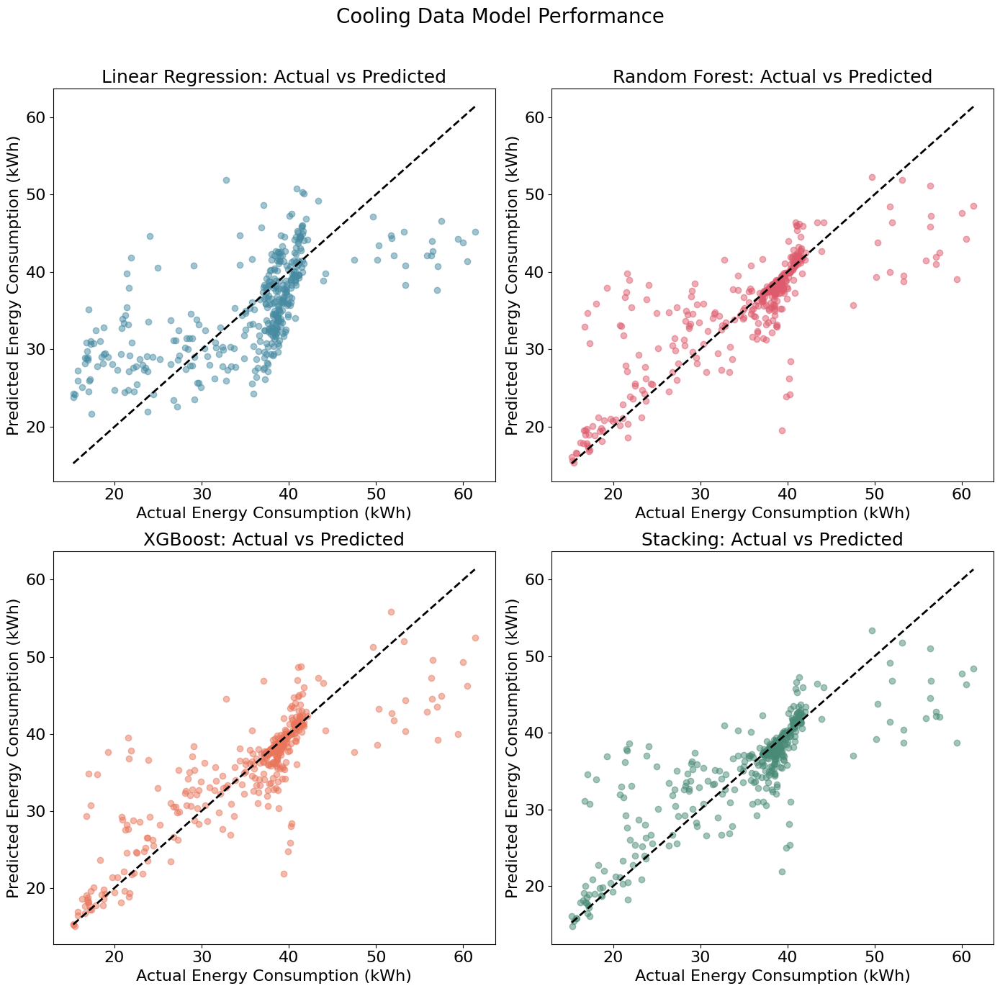

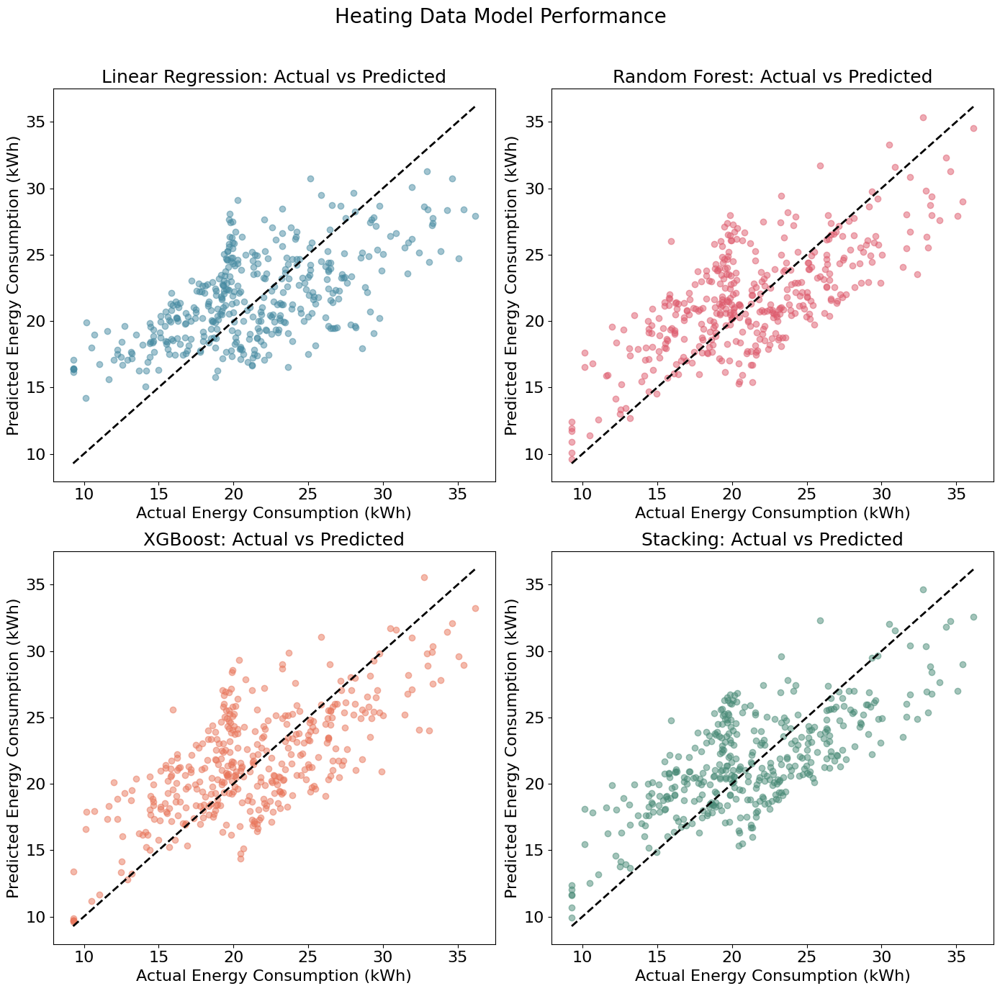

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, StackingRegressor
import xgboost as xgb
from matplotlib.ticker import FuncFormatter

# Load the selected feature data
train_cooling_data = pd.read_csv('train_cooling_selected_data.csv')
test_cooling_data = pd.read_csv('test_cooling_selected_data.csv')
train_heating_data = pd.read_csv('train_heating_selected_data.csv')
test_heating_data = pd.read_csv('test_heating_selected_data.csv')

# Prepare data
X_cooling_train = train_cooling_data.drop(columns=['WH_RTU_Total'])
y_cooling_train = train_cooling_data['WH_RTU_Total'] / 1000  # Convert to kWh
X_cooling_test = test_cooling_data.drop(columns=['WH_RTU_Total'])
y_cooling_test = test_cooling_data['WH_RTU_Total'] / 1000  # Convert to kWh

X_heating_train = train_heating_data.drop(columns=['WH_RTU_Total'])
y_heating_train = train_heating_data['WH_RTU_Total'] / 1000  # Convert to kWh
X_heating_test = test_heating_data.drop(columns=['WH_RTU_Total'])
y_heating_test = test_heating_data['WH_RTU_Total'] / 1000  # Convert to kWh

# Initialize and train models
models = {
    'Linear Regression': LinearRegression(),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'XGBoost': xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=6, random_state=42),
    'Stacking': StackingRegressor(
        estimators=[
            ('rf', RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)),
            ('gb', GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42))
        ],
        final_estimator=LinearRegression(),
        cv=5
    )
}

colors = {
    'Linear Regression': '#478BA2',
    'Random Forest': '#DE5B6D',
    'XGBoost': '#E9765B',
    'Stacking': '#488A76'
}

# Function to format the scale as whole numbers
def integer_formatter(x, pos):
    return f'{int(x)}'

formatter = FuncFormatter(integer_formatter)

# Plotting function
def plot_predictions(predictions, actual, title):
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 14))
    axes = axes.flatten()
    for i, (name, pred) in enumerate(predictions.items()):
        ax = axes[i]
        ax.scatter(actual, pred / 1000, alpha=0.5, color=colors[name])  # Convert predictions to kWh
        ax.plot([actual.min(), actual.max()], [actual.min(), actual.max()], 'k--', lw=2)
        ax.set_title(f'{name}: Actual vs Predicted', fontsize=18)
        ax.xaxis.set_major_formatter(formatter)
        ax.yaxis.set_major_formatter(formatter)
        ax.set_xlabel('Actual Energy Consumption (kWh)', fontsize=16)
        ax.set_ylabel('Predicted Energy Consumption (kWh)', fontsize=16)
        ax.tick_params(axis='both', which='major', labelsize=16)
    plt.suptitle(title, fontsize=20)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# Training and predictions
predictions_cooling = {}
predictions_heating = {}
for name, model in models.items():
    # Cooling
    model.fit(X_cooling_train, y_cooling_train)
    predictions_cooling[name] = model.predict(X_cooling_test) * 1000  # Keep model scale, adjust for plot

    # Heating
    model.fit(X_heating_train, y_heating_train)
    predictions_heating[name] = model.predict(X_heating_test) * 1000  # Keep model scale, adjust for plot

# Generate plots
plot_predictions(predictions_cooling, y_cooling_test, 'Cooling Data Model Performance')
plot_predictions(predictions_heating, y_heating_test, 'Heating Data Model Performance')


## Cooling and Heating Default model result (Line)

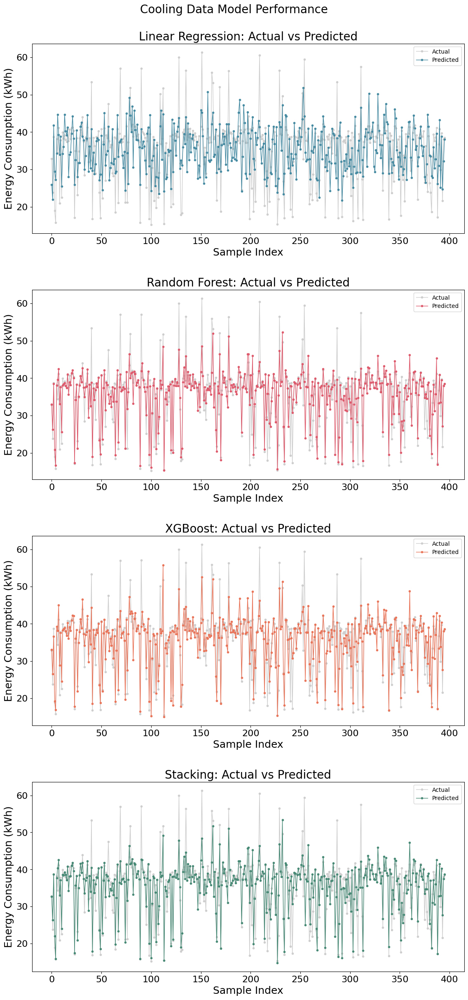

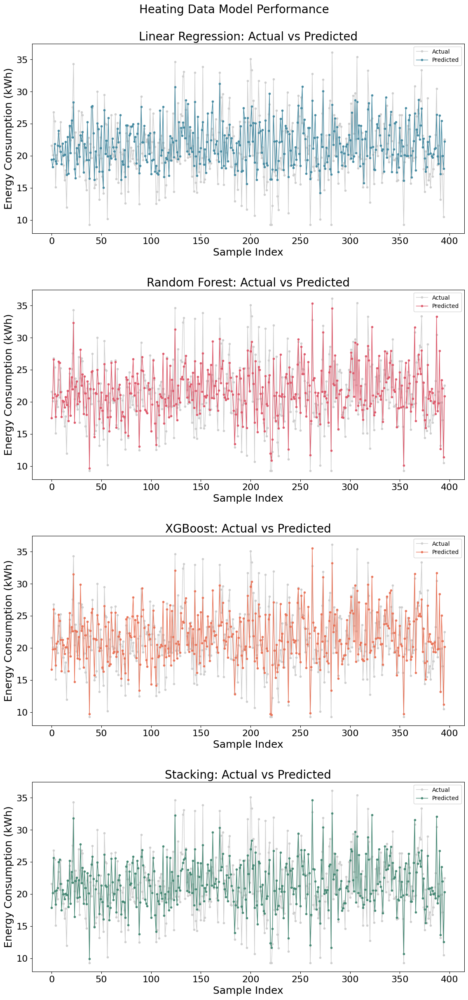

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, StackingRegressor
import xgboost as xgb

# Load the selected feature data
train_cooling_data = pd.read_csv('train_cooling_selected_data.csv')
test_cooling_data = pd.read_csv('test_cooling_selected_data.csv')
train_heating_data = pd.read_csv('train_heating_selected_data.csv')
test_heating_data = pd.read_csv('test_heating_selected_data.csv')

# Prepare data
X_cooling_train = train_cooling_data.drop(columns=['WH_RTU_Total'])
y_cooling_train = train_cooling_data['WH_RTU_Total'] / 1000  # Convert to kWh
X_cooling_test = test_cooling_data.drop(columns=['WH_RTU_Total'])
y_cooling_test = test_cooling_data['WH_RTU_Total'] / 1000  # Convert to kWh

X_heating_train = train_heating_data.drop(columns=['WH_RTU_Total'])
y_heating_train = train_heating_data['WH_RTU_Total'] / 1000  # Convert to kWh
X_heating_test = test_heating_data.drop(columns=['WH_RTU_Total'])
y_heating_test = test_heating_data['WH_RTU_Total'] / 1000  # Convert to kWh

# Initialize and train models for cooling
models = {
    'Linear Regression': LinearRegression(),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'XGBoost': xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=6, random_state=42),
    'Stacking': StackingRegressor(
        estimators=[
            ('rf', RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)),
            ('gb', GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42))
        ],
        final_estimator=LinearRegression(),
        cv=5
    )
}

# Train models and predict for cooling
predictions_cooling = {}
for name, model in models.items():
    model.fit(X_cooling_train, y_cooling_train)
    predictions_cooling[name] = model.predict(X_cooling_test)

# Train models and predict for heating
predictions_heating = {}
for name, model in models.items():
    model.fit(X_heating_train, y_heating_train)
    predictions_heating[name] = model.predict(X_heating_test)

# Plotting function for both datasets
def plot_line_predictions(predictions, actual, title):
    fig, axes = plt.subplots(nrows=4, figsize=(12, 24))  # You may adjust the figsize for better layout
    actual_series = actual.reset_index(drop=True)  # Reset index for proper line plotting
    for ax, (model_name, pred) in zip(axes, predictions.items()):
        ax.plot(actual_series, label='Actual', color='#cecece',  marker='o', linestyle='-', linewidth=1, markersize=3)
        ax.plot(pred, label='Predicted', color=colors[model_name],  marker='o', linestyle='-', linewidth=1, markersize=3)
        ax.set_title(f'{model_name}: Actual vs Predicted', fontsize=20)
        ax.set_xlabel('Sample Index', fontsize=18)
        ax.set_ylabel('Energy Consumption (kWh)', fontsize=18)
        ax.tick_params(axis='both', labelsize=16)
        ax.legend()
    plt.suptitle(title, fontsize=20, y=1.02)  # Adjust the vertical position of the suptitle
    plt.tight_layout(pad=3.0)  # Adjust padding
    plt.subplots_adjust(top=0.98)  # Adjust top margin
    plt.show()


# Generate line chart plots for both cooling and heating
plot_line_predictions(predictions_cooling, y_cooling_test, 'Cooling Data Model Performance')
plot_line_predictions(predictions_heating, y_heating_test, 'Heating Data Model Performance')


## Cooling model result after tuning (Scatter)

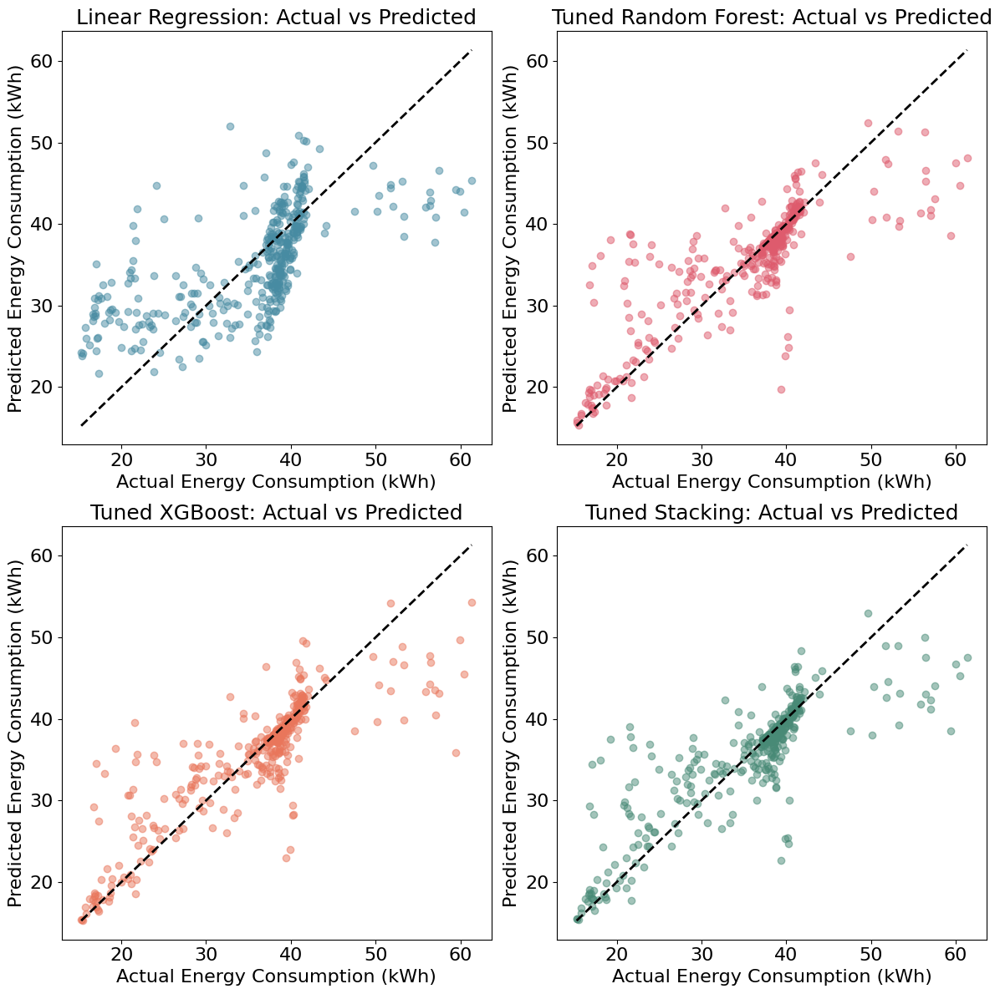

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, StackingRegressor
import xgboost as xgb
from matplotlib.ticker import FuncFormatter

# Load the selected feature data
train_cooling_data = pd.read_csv('train_cooling_selected_data.csv')
test_cooling_data = pd.read_csv('test_cooling_selected_data.csv')

# Prepare data
X_cooling_train = train_cooling_data.drop(columns=['WH_RTU_Total'])
y_cooling_train = train_cooling_data['WH_RTU_Total']
X_cooling_test = test_cooling_data.drop(columns=['WH_RTU_Total'])
y_cooling_test = test_cooling_data['WH_RTU_Total']

# Initialize and train models with tuned parameters
lr_model = LinearRegression()
rf_model = RandomForestRegressor(n_estimators=100, min_samples_split=2, min_samples_leaf=2, max_features=None, max_depth=20, bootstrap=True, random_state=42)
xgb_model = xgb.XGBRegressor(subsample=0.9, n_estimators=300, max_depth=6, learning_rate=0.05, gamma=0.3, colsample_bytree=0.9, random_state=42)

base_models = [
    ('rf', RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)),
    ('gb', GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42))
]
meta_model = LinearRegression()
stacking_model = StackingRegressor(estimators=base_models, final_estimator=meta_model, cv=5)

# Train models
lr_model.fit(X_cooling_train, y_cooling_train)
rf_model.fit(X_cooling_train, y_cooling_train)
xgb_model.fit(X_cooling_train, y_cooling_train)
stacking_model.fit(X_cooling_train, y_cooling_train)

# Predictions
predictions = {
    'Linear Regression': lr_model.predict(X_cooling_test),
    'Tuned Random Forest': rf_model.predict(X_cooling_test),
    'Tuned XGBoost': xgb_model.predict(X_cooling_test),
    'Tuned Stacking': stacking_model.predict(X_cooling_test)
}

colors = {
    'Linear Regression': '#478BA2',
    'Tuned Random Forest': '#DE5B6D',
    'Tuned XGBoost': '#E9765B',
    'Tuned Stacking': '#488A76'
}

# Function to format the scale as integers (divided by 1000)
def thousand_formatter(x, pos):
    return f'{int(x/1000)}'

formatter = FuncFormatter(thousand_formatter)

# Plotting
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))
axes = axes.flatten()

for i, (name, pred) in enumerate(predictions.items()):
    ax = axes[i]
    ax.scatter(y_cooling_test, pred, alpha=0.5, color=colors[name])
    ax.plot([y_cooling_test.min(), y_cooling_test.max()], [y_cooling_test.min(), y_cooling_test.max()], 'k--', lw=2)
    ax.set_title(f'{name}: Actual vs Predicted', fontsize=18)
    ax.set_xlabel('Actual Energy Consumption (kWh)', fontsize=16)
    ax.set_ylabel('Predicted Energy Consumption (kWh)', fontsize=16)
    ax.xaxis.set_major_formatter(formatter)
    ax.yaxis.set_major_formatter(formatter)
    ax.tick_params(axis='both', which='major', labelsize=16)

plt.tight_layout()
plt.show()


## Cooling model result after tuning (Line)

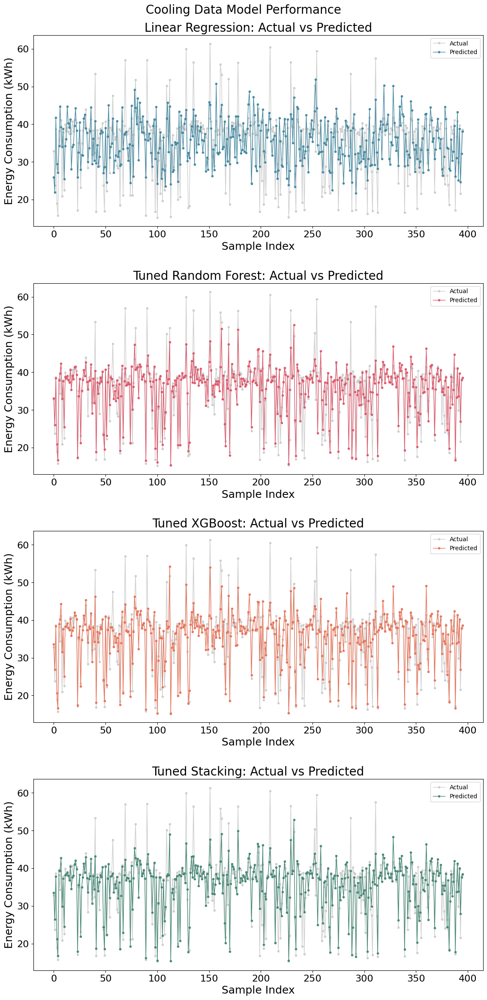

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, StackingRegressor
import xgboost as xgb

# Load the selected feature data
train_cooling_data = pd.read_csv('train_cooling_selected_data.csv')
test_cooling_data = pd.read_csv('test_cooling_selected_data.csv')

# Prepare data
X_cooling_train = train_cooling_data.drop(columns=['WH_RTU_Total'])
y_cooling_train = train_cooling_data['WH_RTU_Total'] / 1000  # Convert to kWh
X_cooling_test = test_cooling_data.drop(columns=['WH_RTU_Total'])
y_cooling_test = test_cooling_data['WH_RTU_Total'] / 1000  # Convert to kWh

# Initialize and train models with tuned parameters
lr_model = LinearRegression()
rf_model = RandomForestRegressor(n_estimators=100, min_samples_split=2, min_samples_leaf=2, max_features=None, max_depth=20, bootstrap=True, random_state=42)
xgb_model = xgb.XGBRegressor(subsample=0.9, n_estimators=300, max_depth=6, learning_rate=0.05, gamma=0.3, colsample_bytree=0.9, random_state=42)
stacking_model = StackingRegressor(
    estimators=[
        ('rf', RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)),
        ('gb', GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42))
    ],
    final_estimator=LinearRegression(),
    cv=5
)

# Train models
lr_model.fit(X_cooling_train, y_cooling_train)
rf_model.fit(X_cooling_train, y_cooling_train)
xgb_model.fit(X_cooling_train, y_cooling_train)
stacking_model.fit(X_cooling_train, y_cooling_train)

# Predictions
predictions = {
    'Linear Regression': lr_model.predict(X_cooling_test),
    'Tuned Random Forest': rf_model.predict(X_cooling_test),
    'Tuned XGBoost': xgb_model.predict(X_cooling_test),
    'Tuned Stacking': stacking_model.predict(X_cooling_test)
}

colors = {
    'Linear Regression': '#478BA2',
    'Tuned Random Forest': '#DE5B6D',
    'Tuned XGBoost': '#E9765B',
    'Tuned Stacking': '#488A76'
}

# Plotting line charts
fig, axes = plt.subplots(nrows=4, figsize=(12, 24))  # Adjust the figsize to better fit the content
y_cooling_test_series = y_cooling_test.reset_index(drop=True)  # Reset index for proper line plotting

for ax, (name, pred) in zip(axes, predictions.items()):
    ax.plot(y_cooling_test_series, label='Actual', color='#cecece', marker='o', linestyle='-', linewidth=1, markersize=3)
    ax.plot(pred , label='Predicted', color=colors[name], marker='o', linestyle='-', linewidth=1, markersize=3)  # Ensure predictions are scaled to kWh
    ax.set_title(f'{name}: Actual vs Predicted', fontsize=20)
    ax.set_xlabel('Sample Index', fontsize=18)
    ax.set_ylabel('Energy Consumption (kWh)', fontsize=18)
    ax.tick_params(axis='both', labelsize=16)
    ax.legend()

plt.suptitle('Cooling Data Model Performance', fontsize=20, y=0.98)  # Adjust the vertical position of the suptitle
plt.tight_layout(pad=3.0)  # Adjust padding to prevent overlap
plt.subplots_adjust(top=0.95)  # Adjust the top margin to fit the suptitle
plt.show()


## Heating model result after tuning (Scatter)

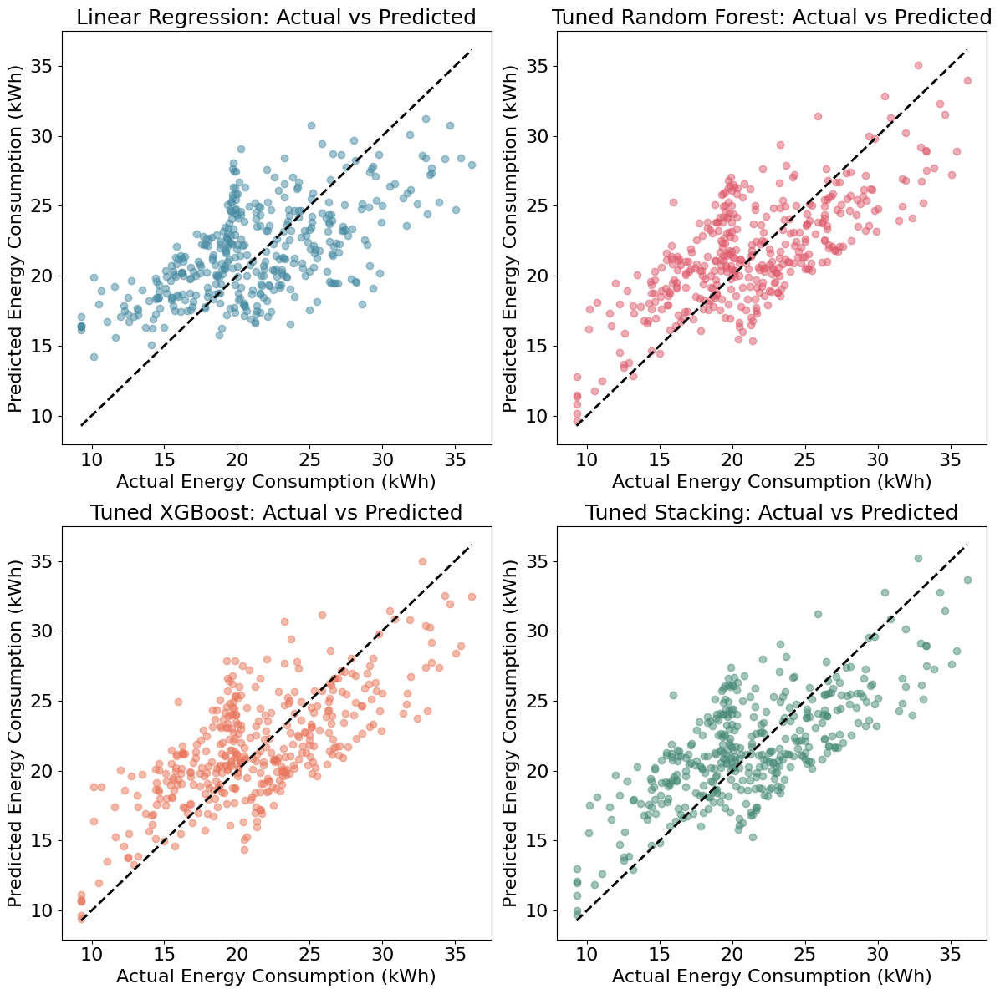

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, StackingRegressor
import xgboost as xgb
from matplotlib.ticker import FuncFormatter

# Load the selected feature data
train_heating_data = pd.read_csv('train_heating_selected_data.csv')
test_heating_data = pd.read_csv('test_heating_selected_data.csv')

# Prepare data
X_heating_train = train_heating_data.drop(columns=['WH_RTU_Total'])
y_heating_train = train_heating_data['WH_RTU_Total'] / 1000  # Convert to kWh for consistency
X_heating_test = test_heating_data.drop(columns=['WH_RTU_Total'])
y_heating_test = test_heating_data['WH_RTU_Total'] / 1000  # Convert to kWh for consistency

# Initialize and train models with tuned parameters
lr_model_heating = LinearRegression()
rf_model_heating = RandomForestRegressor(n_estimators=259, max_depth=10, random_state=42)
xgb_model_heating = xgb.XGBRegressor(subsample=0.8, reg_lambda=10, n_estimators=150, max_depth=6, learning_rate=0.05, gamma=0.1, colsample_bytree=1.0, random_state=42)

base_models = [
    ('rf', rf_model_heating),  # Reuse the initialized Random Forest for the stacking
    ('gb', GradientBoostingRegressor(n_estimators=239, learning_rate=0.15, max_depth=5, subsample=0.7, random_state=42))
]
meta_model = LinearRegression()
stacking_model_heating = StackingRegressor(estimators=base_models, final_estimator=meta_model, cv=5)

# Train models
lr_model_heating.fit(X_heating_train, y_heating_train)
rf_model_heating.fit(X_heating_train, y_heating_train)
xgb_model_heating.fit(X_heating_train, y_heating_train)
stacking_model_heating.fit(X_heating_train, y_heating_train)

# Predictions
predictions = {
    'Linear Regression': lr_model_heating.predict(X_heating_test),
    'Tuned Random Forest': rf_model_heating.predict(X_heating_test),
    'Tuned XGBoost': xgb_model_heating.predict(X_heating_test),
    'Tuned Stacking': stacking_model_heating.predict(X_heating_test)
}

colors = {
    'Linear Regression': '#478BA2',
    'Tuned Random Forest': '#DE5B6D',
    'Tuned XGBoost': '#E9765B',
    'Tuned Stacking': '#488A76'
}

# Function to format the scale as integers and divide by 1000
def integer_formatter(x, pos):
    return f'{int(x)}'

formatter = FuncFormatter(integer_formatter)

# Plotting
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))
plot_order = [
    ('Linear Regression', 0, 0),  # Left-top
    ('Tuned Random Forest', 0, 1),  # Right-top
    ('Tuned XGBoost', 1, 0),  # Left-bottom
    ('Tuned Stacking', 1, 1)  # Right-bottom
]

for model_name, row, col in plot_order:
    pred = predictions[model_name]
    ax = axes[row, col]
    ax.scatter(y_heating_test, pred, alpha=0.5, color=colors[model_name])
    ax.plot([y_heating_test.min(), y_heating_test.max()], [y_heating_test.min(), y_heating_test.max()], 'k--', lw=2)
    ax.set_title(f'{model_name}: Actual vs Predicted', fontsize=18)
    ax.set_xlabel('Actual Energy Consumption (kWh)', fontsize=16)
    ax.set_ylabel('Predicted Energy Consumption (kWh)', fontsize=16)
    ax.xaxis.set_major_formatter(formatter)
    ax.yaxis.set_major_formatter(formatter)
    ax.tick_params(axis='both', which='major', labelsize=16)

plt.tight_layout()
plt.show()


## Heating model result after tuning (Line)

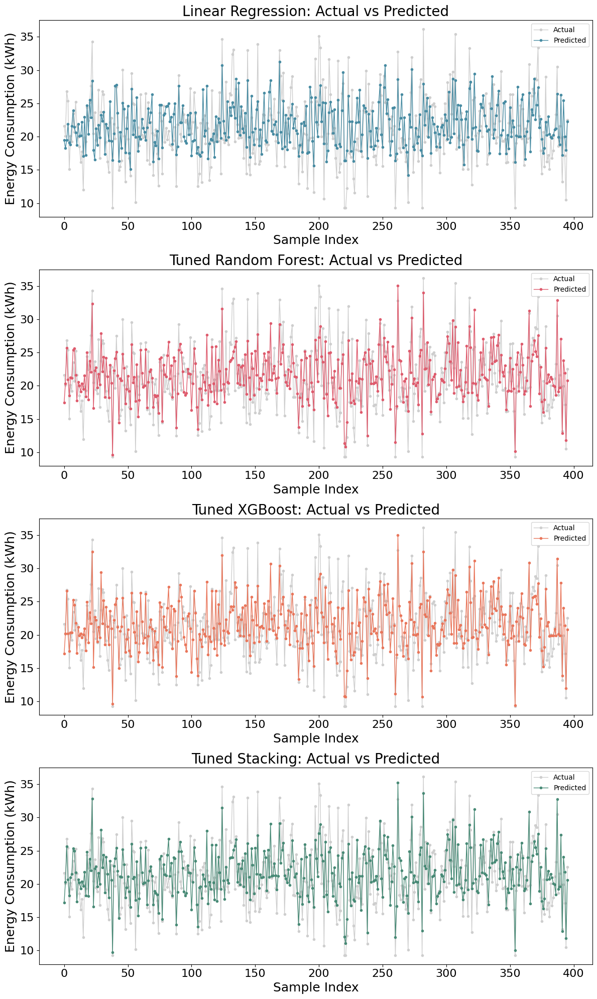

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, StackingRegressor
import xgboost as xgb

# Load the selected feature data
train_heating_data = pd.read_csv('train_heating_selected_data.csv')
test_heating_data = pd.read_csv('test_heating_selected_data.csv')

# Prepare data
X_heating_train = train_heating_data.drop(columns=['WH_RTU_Total'])
y_heating_train = train_heating_data['WH_RTU_Total'] / 1000  # Convert to kWh
X_heating_test = test_heating_data.drop(columns=['WH_RTU_Total'])
y_heating_test = test_heating_data['WH_RTU_Total'] / 1000  # Convert to kWh

# Initialize and train models with tuned parameters
lr_model_heating = LinearRegression()
rf_model_heating = RandomForestRegressor(n_estimators=259, max_depth=10, random_state=42)
xgb_model_heating = xgb.XGBRegressor(subsample=0.8, reg_lambda=10, n_estimators=150, max_depth=6, learning_rate=0.05, gamma=0.1, colsample_bytree=1.0, random_state=42)
stacking_model_heating = StackingRegressor(
    estimators=[
        ('rf', rf_model_heating),
        ('gb', GradientBoostingRegressor(n_estimators=239, learning_rate=0.15, max_depth=5, subsample=0.7, random_state=42))
    ],
    final_estimator=LinearRegression(),
    cv=5
)

# Train models
lr_model_heating.fit(X_heating_train, y_heating_train)
rf_model_heating.fit(X_heating_train, y_heating_train)
xgb_model_heating.fit(X_heating_train, y_heating_train)
stacking_model_heating.fit(X_heating_train, y_heating_train)

# Predictions
predictions = {
    'Linear Regression': lr_model_heating.predict(X_heating_test),
    'Tuned Random Forest': rf_model_heating.predict(X_heating_test),
    'Tuned XGBoost': xgb_model_heating.predict(X_heating_test),
    'Tuned Stacking': stacking_model_heating.predict(X_heating_test)
}

colors = {
    'Linear Regression': '#478BA2',
    'Tuned Random Forest': '#DE5B6D',
    'Tuned XGBoost': '#E9765B',
    'Tuned Stacking': '#488A76'
}

# Plotting line charts
fig, axes = plt.subplots(nrows=4, figsize=(12, 20))
y_heating_test_series = y_heating_test.reset_index(drop=True)  # Reset index for proper line plotting

for ax, (name, pred) in zip(axes, predictions.items()):
    ax.plot(y_heating_test_series, label='Actual', color='#cecece', marker='o', linestyle='-', linewidth=1, markersize=3)
    ax.plot(pred, label='Predicted', color=colors[name], marker='o', linestyle='-', linewidth=1, markersize=3)
    ax.set_title(f'{name}: Actual vs Predicted', fontsize=20)
    ax.set_xlabel('Sample Index', fontsize=18)
    ax.set_ylabel('Energy Consumption (kWh)', fontsize=18)
    ax.tick_params(axis='both', labelsize=16)
    ax.legend()

plt.tight_layout()
plt.show()
